# Uncovering Key Insights: Analyzing the Stack Overflow Developer Survey Dataset using Python

## Introduction

In the realm of software development, Stack Overflow stands as a cornerstone platform, serving as a hub for developers worldwide to seek assistance, share knowledge, and engage with a vibrant community of peers. The annual Stack Overflow Developer Survey offers a plethora of insights into the demographics, preferences, and behaviors of developers across the globe.<br>

This project delves into the Stack Overflow Developer Survey dataset, aiming to uncover valuable insights that illuminate the landscape of modern software development. By analyzing this dataset, the aim is to gain a deeper understanding of the developer community's composition, their technological preferences and their engagement with the platform.   

For the current project, the analysis is limited to the following areas:

1. <b>Demographic Analysis</b><br>
    1.1. Age, Gender, and location of survey takers.<br>
    1.2. Education and Employment Stats of survey takers.<br>

2. <b> Education and Professional Background</b><br>
    2.1. Educational background of survey takers and how it relates to their current roles.<br>
    2.2. Are survey takers actively engaged in continuous learning and their preferred professional development resources?<br>

3. <b> Programming Language and Technology</b><br>
    3.1. Most commonly used programming language and technology used by survey takers.<br>
    3.2. Correlation between survey takers years of experience and the choice of programming language.<br>

4. <b> Stack Overflow Usage, Contribution and Community Engagement</b><br>
    4.1. Proportion of survey takers have a Stack Overflow account.<br>
    4.2. Frequency of survey takers visiting and participating in Q&A.<br>
    4.3. Frequency of survey takers contribution to open source projects and nature of their contribution.<br>


## Table of Contents

1. [Data Extraction](#Data-Extraction)<br>
2. [Data Prep and Cleaning](#Data-Prep-and-Cleaning)<br>
3. [Reusable Codes](#Reusable-Codes)<br>
    3.1. Year Range Conversion <br>
    3.2. Colour Mapping <br>
    3.3. Pie chart Function <br>
    3.4. Grouped plots Function <br>
4. [Demographic Analysis](#Demographic-Analysis)<br>
    4.1. Age, Gender, location of survey takers. <br>
    4.2. Education and Employment Stats of survey takers.<br>
5. [Education and Professional Background](#Education-and-Professional-Background)<br>
    5.1. Educational background of survey takers and how it relates to their current roles.<br> 
    5.2. Are survey takers actively engaged in continuous learning and their preferred professional development resources.<br>
6. [Programming language and Technology](#Programming-language-and-Technology)<br>
    6.1. Most commonly used programming language and technology used by survey takers. <br>
    6.2. Correlation between survey takers years of experience and the choice of programming language. <br>
7. [Stack Overflow Usage, Contribution and Community engagement](#Stack-Overflow-Usage,-Contribution-and-Community-engagement)<br>
    7.1. Proportion of survey takers have a stackoverflow account. <br>
    7.2. Frequency of survey takers visiting and participating in Q&A. <br>
    7.3. Frequency of survey takers contribution to open source projects and nature of their contribution.<br>
8. [Summary](#Summary)

In [1]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from wordcloud import WordCloud

# Data Extraction

The Stack Overflow Developer Survey dataset provides a comprehensive snapshot of the global developer community, capturing a wide range of demographic, professional, and technological information. Here's a brief description of the dataset:<br>

<b>1. Demographic Information:</b>
The dataset includes demographic information such as age, gender, country of residence, and employment status, providing insights into the diverse makeup of the developer community.<br>

<b>2. Professional Background:</b>
Information about the respondents' professional backgrounds is included, such as their main branch (e.g., developer, student, manager), years of coding experience, education level, and industry affiliation.<br>

<b>3. Technological Preferences:</b>
The dataset covers a wide array of technological preferences, including programming languages, databases, platforms, web frameworks, and developer tools used by the respondents in their day-to-day work.<br>

<b>4. Stack Overflow Engagement:</b>
Data related to the respondents' engagement with the Stack Overflow platform is included, such as whether they have a Stack Overflow account, their frequency of visits, participation in Q&A, and their perception of the Stack Overflow community.<br>

In [3]:
raw_df=pd.read_csv(r"C:\Users\swati\Desktop\DATA ANALYSIS\DataAnalyticswithpython\survey_results_public.csv")
raw_df_schema=pd.read_csv(r"C:\Users\swati\Desktop\DATA ANALYSIS\DataAnalyticswithpython\survey_results_schema.csv",index_col='qname')
raw_df_schema=raw_df_schema['question']

Th raw_df provides the comprehensive survey results. The raw_df_schema provides a description of each survey question.

# Data Prep and Cleaning

The original dataset consists of 84 columns and 89184 rows of data. For this project only a subset of this data is required.

In [4]:
required_col_survey=[#DemographicAnalysis
'ResponseId',
'MainBranch',
'Country',
'Age',
'EdLevel',
'Employment',
'CodingActivities',
    
#EducationandProfessionalBackground
'YearsCode',
'YearsCodePro',
'LearnCode',
'LearnCodeOnline',
'LearnCodeCoursesCert',
'WorkExp',

#Employment Details
'DevType',
'OrgSize',
'CompTotal',
'Industry',

#Programming-language-and-Technology
'LanguageHaveWorkedWith',
'DatabaseHaveWorkedWith',
    


#Stackoverflow-Usage,-Contribution-and-Community-engagement
'NEWSOSites',
'SOVisitFreq',
'SOAccount',
'SOPartFreq',
'SOComm'   
]
#subset of original raw survey data - 89184 rows × 24 columns
survey_df=raw_df[required_col_survey].copy()

In [5]:
required_col_schema=[#DemographicAnalysis
'ResponseId',
'MainBranch',
'Country',
'Age',
'EdLevel',
'Employment',
'CodingActivities',
    
#EducationandProfessionalBackground
'YearsCode',
'YearsCodePro',
'LearnCode',
'WorkExp',

#Employment Details
'DevType',
'OrgSize',
'CompTotal',
'ProfessionalTech',
'Industry',

#Programming-language-and-Technology
'Language',
'Database',

#Stackoverflow-Usage,-Contribution-and-Community-engagement
'NEWSOSites',
'SOVisitFreq',
'SOAccount',
'SOPartFreq',
'SOComm'
]

#subset of original schema
schema_df=raw_df_schema[required_col_schema].copy()

In [6]:
survey_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89184 entries, 0 to 89183
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ResponseId              89184 non-null  int64  
 1   MainBranch              89184 non-null  object 
 2   Country                 87973 non-null  object 
 3   Age                     89184 non-null  object 
 4   EdLevel                 87973 non-null  object 
 5   Employment              87898 non-null  object 
 6   CodingActivities        73764 non-null  object 
 7   YearsCode               87435 non-null  object 
 8   YearsCodePro            66136 non-null  object 
 9   LearnCode               87663 non-null  object 
 10  LearnCodeOnline         70084 non-null  object 
 11  LearnCodeCoursesCert    37076 non-null  object 
 12  WorkExp                 43579 non-null  float64
 13  DevType                 76872 non-null  object 
 14  OrgSize                 65043 non-null

Some of the data types by default are set to object. In order to ensure numeric calculations are performed the data type is converted to numeric for those where it applies. 

In the case of <b>"YearsCode"</b> which determines how many years someone has been coding, there are both numeric and string values in answers which can be seen from the list of unique data in this column. The two string values are "More than 50 years" and "Less than 1 year". For the current analysis, these values are replaced by nan.

In [7]:
survey_df['YearsCode'].unique()
survey_df['YearsCode']=pd.to_numeric(survey_df.YearsCode,errors='coerce')
survey_df['YearsCode'].unique()

array([nan,  6., 14., 16., 20.,  5., 10.,  3., 30., 15.,  7.,  4., 28.,
        8., 40., 11., 12.,  9., 13., 25., 35., 27., 38., 45.,  2., 23.,
       17., 24., 26.,  1., 48., 31., 18., 34., 50., 21., 22., 33., 19.,
       39., 37., 29., 42., 43., 32., 44., 49., 46., 41., 47., 36.])

Performing the same as above for <b>"YearsCodePro"</b>.

In [8]:
survey_df['YearsCodePro'].unique() 
survey_df['YearsCodePro']=pd.to_numeric(survey_df.YearsCodePro,errors='coerce')
survey_df['YearsCode'].unique()

array([nan,  6., 14., 16., 20.,  5., 10.,  3., 30., 15.,  7.,  4., 28.,
        8., 40., 11., 12.,  9., 13., 25., 35., 27., 38., 45.,  2., 23.,
       17., 24., 26.,  1., 48., 31., 18., 34., 50., 21., 22., 33., 19.,
       39., 37., 29., 42., 43., 32., 44., 49., 46., 41., 47., 36.])

One of the errors that can be noticed is the salary range ie, <b>"CompTotal"</b>. The max value of 5e46 is clearly wrong and therefore drives the mean and standard deviation. Therefore, to ensure no incorrect data is included in the analysis CompTotal values are limited to an upper limit of 1e10 (10-figure salary).


In [9]:
survey_df.describe()                         

,ResponseId,YearsCode,YearsCodePro,WorkExp,CompTotal
count,89184.000000,86114.000000,64217.000000,43579.000000,4.822500e+04
mean,44592.500000,13.972049,11.508354,11.405126,1.036807e+42
std,25745.347541,10.259548,9.070346,9.051989,2.276847e+44
min,1.000000,1.000000,1.000000,0.000000,0.000000e+00
25%,22296.750000,6.000000,5.000000,5.000000,6.300000e+04
50%,44592.500000,11.000000,9.000000,9.000000,1.150000e+05
75%,66888.250000,20.000000,16.000000,16.000000,2.300000e+05
max,89184.000000,50.000000,50.000000,50.000000,5.000000e+46


In [10]:
survey_df.sort_values('CompTotal',ascending=False).CompTotal.head(5)
survey_df.drop(survey_df[survey_df['CompTotal']>1e10].index,inplace=True)
survey_df.sort_values('CompTotal',ascending=False).head(5).CompTotal

40971    1.000000e+10
40974    1.000000e+10
40975    1.000000e+10
40972    1.000000e+10
40973    1.000000e+10
Name: CompTotal, dtype: float64

In [11]:
survey_df.describe()      

,ResponseId,YearsCode,YearsCodePro,WorkExp,CompTotal
count,89172.000000,86104.000000,64208.000000,43572.000000,4.821300e+04
mean,44593.487945,13.972405,11.509127,11.404962,1.156820e+07
std,25745.988811,10.259945,9.070699,9.052479,2.153491e+08
min,1.000000,1.000000,1.000000,0.000000,0.000000e+00
25%,22297.750000,6.000000,5.000000,5.000000,6.300000e+04
50%,44594.500000,11.000000,9.000000,9.000000,1.150000e+05
75%,66890.250000,20.000000,16.000000,16.000000,2.300000e+05
max,89184.000000,50.000000,50.000000,50.000000,1.000000e+10


Other numeric values are sensible and therefore no other rows are dropped.

Another error that was noticed is that survey takers may have entered or selected contrasting answers - such as the years of professional coding (only professional coding) being greater than the total years of coding (which includes educational and professional coding). Such cases are dropped from the dataset.

In [12]:
schema_df['YearsCode']

'Including any education, how many years have you been coding in total?'

In [13]:
schema_df['YearsCodePro']

'NOT including education, how many years have you coded professionally (as a part of your work)?'

In [14]:
#Drop cases where the years of professional coding is less than total years of coding
survey_df=survey_df[survey_df['YearsCode']>=survey_df['YearsCodePro']]

Next, it is also confirmed that the age range selected and years of coding are not contrasting, i.e., years of coding experience cannot be greater than the upper limit of the age group selected. Any survey response with this error is dropped. 

In [15]:
#There are also cases in the data set where the number of years of coding experience is greater the upper limit of age group
survey_df['Age'].unique()

survey_df_age1=survey_df[survey_df['Age']=='18-24 years old']
survey_df_age1=survey_df_age1[survey_df_age1['YearsCode']>=24]#values present

survey_df_age2=survey_df[survey_df['Age']=='25-34 years old']
survey_df_age2=survey_df_age2[survey_df_age2['YearsCode']>=34]

survey_df_age3=survey_df[survey_df['Age']=='35-44 years old']
survey_df_age3=survey_df_age3[survey_df_age3['YearsCode']>=44]

survey_df_age4=survey_df[survey_df['Age']=='55-64 years old']
survey_df_age4=survey_df_age4[survey_df_age4['YearsCode']>=64]

survey_df_age5=survey_df[survey_df['Age']=='Under 18 years old']
survey_df_age5=survey_df_age5[survey_df_age5['YearsCode']>=18]#values present

survey_df_age6=survey_df[survey_df['Age']=='45-54 years old']
survey_df_age6=survey_df_age6[survey_df_age6['YearsCode']>=54]

survey_df_age7=survey_df[survey_df['Age']=='65 years or older']
survey_df_age7=survey_df_age7[survey_df_age7['YearsCode']>=65]

#Ids where the years of experience is greater than age group upper limit
response_ids=list(survey_df_age1.ResponseId)+list(survey_df_age5.ResponseId)

survey_df= survey_df.drop(survey_df[survey_df['ResponseId'] == 33924].index)
survey_df= survey_df.drop(survey_df[survey_df['ResponseId'] == 81004].index)
survey_df= survey_df.drop(survey_df[survey_df['ResponseId'] == 65231].index)
survey_df= survey_df.drop(survey_df[survey_df['ResponseId'] == 86150].index)
survey_df= survey_df.drop(survey_df[survey_df['ResponseId'] == 71893].index)

No other discrepancies that may hinder the current analysis of the dataset are identified. A sample of the dataset for the current analysis is shown below.

In [16]:
survey_df.sample(10)

,ResponseId,MainBranch,Country,Age,EdLevel,Employment,CodingActivities,YearsCode,YearsCodePro,LearnCode,...,OrgSize,CompTotal,Industry,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm
87660,78245,I am a developer by profession,Poland,25-34 years old,"Master's degree (M.A., M.S., M.Eng., MBA, etc.)","Employed, full-time",Hobby;School or academic work,10.0,5.0,Books / Physical media;Online Courses or Certi...,...,"1,000 to 4,999 employees",18000.0,NaN,Bash/Shell (all shells);JavaScript;PHP,Clickhouse;MongoDB;MySQL;PostgreSQL,Stack Overflow,A few times per week,Yes,I have never participated in Q&A on Stack Over...,"No, not really"
53607,75898,I am a developer by profession,United States of America,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",I don't code outside of work,10.0,6.0,On the job training;Other online resources (e....,...,"1,000 to 4,999 employees",220000.0,Other,Bash/Shell (all shells);Go;HTML/CSS;Java;Pytho...,Dynamodb;Elasticsearch;PostgreSQL;Redis,Stack Overflow;Stack Exchange;Collectives on S...,A few times per week,Not sure/can't remember,NaN,"No, not really"
52236,35528,I am a developer by profession,United States of America,35-44 years old,"Master's degree (M.A., M.S., M.Eng., MBA, etc.)","Employed, full-time",Hobby;Contribute to open-source projects;Profe...,15.0,11.0,Books / Physical media;Online Courses or Certi...,...,"10,000 or more employees",250000.0,"Information Services, IT, Software Development...",Assembly;Bash/Shell (all shells);C;C++;Lua;Python,MySQL,Stack Overflow;Stack Exchange,A few times per week,No,NaN,"No, not really"
46150,72983,I am a developer by profession,Turkey,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",I don't code outside of work,11.0,8.0,"School (i.e., University, College, etc)",...,20 to 99 employees,860000.0,"Information Services, IT, Software Development...",JavaScript;Python,PostgreSQL;Redis,Stack Overflow;Stack Exchange,Daily or almost daily,Yes,Less than once per month or monthly,"No, not really"
48700,58249,I am a developer by profession,United States of America,35-44 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time;Independent contractor, fr...",Hobby;Contribute to open-source projects;Freel...,32.0,23.0,Books / Physical media;Friend or family member,...,"10,000 or more employees",500000.0,Retail and Consumer Services,Bash/Shell (all shells);C;C++;Go;HTML/CSS;Java...,Dynamodb;MariaDB;MongoDB;MySQL;PostgreSQL;Redi...,Stack Overflow;Stack Exchange,A few times per week,Yes,A few times per month or weekly,"Yes, somewhat"
15365,37372,I am a developer by profession,New Zealand,35-44 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",Hobby,17.0,14.0,Books / Physical media;Online Courses or Certi...,...,"1,000 to 4,999 employees",NaN,NaN,C;C++,SQLite,Stack Overflow;Stack Exchange;Collectives on S...,A few times per week,Yes,Less than once per month or monthly,"Yes, somewhat"
17504,42521,I am a developer by profession,United Kingdom of Great Britain and Northern I...,25-34 years old,"Master's degree (M.A., M.S., M.Eng., MBA, etc.)","Employed, full-time",Professional development or self-paced learnin...,15.0,10.0,Books / Physical media;Other online resources ...,...,"10,000 or more employees",NaN,"Information Services, IT, Software Development...",C++;Java;JavaScript;Kotlin;Python;TypeScript,PostgreSQL;SQLite,Stack Overflow,A few times per month or weekly,Yes,Less than once per month or monthly,"Yes, somewhat"
59148,6182,I am a developer by profession,United States of America,35-44 years old,"Master's degree (M.A., M.S., M.Eng., MBA, etc.)","Employed, full-time",Professional development or self-paced learnin...,20.0,17.0,"School (i.e., University, College, etc)",...,"1,000 to 4,999 employees",150000.0,Financial Services,HTML/CSS;Java;JavaScript;Python,Dynamodb;Elasticsearch;MySQL;PostgreSQL;Redis;...,St

# Reusable Codes

To make the coding process simpler, certain reusable codes in terms of functions are defined, which are called throughout the analysis. 

## Year Range Conversion

There are multiple different values for Years of coding experience in the dataset. For the current analysis, these years are grouped into ranges to better analyse their influence. This is performed by the <b>YearCode_range</b> function.

In [17]:
#Converting Number of Years of experience into ranges
def YearCode_range(row):
    if row < 5:
        x='Less than 5'
    elif row >= 5 and row < 10:
        x='Between 5-10 years'
    elif row >= 10 and row < 20:
        x='Between 10-20 years'
    elif row >= 20 and row < 30:
        x='Between 20-30 years'
    elif row >= 30 and row < 40:
        x='Between 30-40 years'
    elif row >= 40 and row < 50:
        x='Between 40-50 years'
    else:
        x='50+ years'
    return x

## Colour Mapping

The function <b>color_matching</b> assigns each text-based value to a certain colour.

In [18]:
#Color Mapping
def color_matching(item_list,color_set,Maingroup):
    
    All_colors = pd.DataFrame({Maingroup: item_list,'Color': color_set})
    color_map = {}
    
    for i, row in All_colors.iterrows():
        color_map[row[Maingroup]] = row['Color']
    
    All_colors['Color'] = All_colors[Maingroup].map(color_map)
    
    return All_colors
    

#Main Branch
Branch_list=survey_df['MainBranch'].unique()
colors_branch=color_matching(Branch_list,['skyblue', 'orange', 'green'],'MainBranch')


#Age Group
Age_list=survey_df['Age'].unique()
colors_Age=color_matching(Age_list,['firebrick','bisque','gold','darkorchid','plum','royalblue','lightcoral','forestgreen'],'Age')

#Employment Status
Emp_list=survey_df['Employment'].copy()
Emp_list=Emp_list.str.split(';')
Emp_list=Emp_list.explode('Employment')
Emp_list=Emp_list.drop_duplicates().unique()
colors_emp=color_matching(Emp_list,['dodgerblue','maroon','khaki','palegreen','darkturquoise','dimgray'],'Employment')

#Education Level
ED_list=survey_df['EdLevel'].unique()
colors_ED=color_matching(ED_list,['m','pink','darkorchid','palevioletred','plum','darkblue','rebeccapurple','mediumvioletred'],'EdLevel')
#Industry
Industry_list=survey_df['Industry'].unique()
colors_Industry=color_matching(Industry_list,['darkred','lightsalmon','dimgray','darkorange','steelblue','orchid','lime','mediumslateblue','darkolivegreen','cyan','thistle','purple','b'],'Industry')

#Coding Activities
Coding_list=survey_df['CodingActivities'].copy()
Coding_list=Coding_list.str.split(';')
Coding_list=Coding_list.explode('CodingActivities')
Coding_list=Coding_list.drop_duplicates().unique()
colors_Coding=color_matching(Coding_list,['crimson','salmon','navy','magenta','darkgoldenrod','lemonchiffon','sandybrown','dimgray','blueviolet'],'CodingActivities')

#Resources used to LearnCode
Resources_list=survey_df['LearnCode'].copy()
Resources_list=Resources_list.str.split(';')
Resources_list=Resources_list.explode('LearnCode')
Resources_list=Resources_list.drop_duplicates().unique()
colors_Resources=color_matching(Resources_list,['aquamarine','b','tomato','indigo','y','slategrey','deeppink','cornflowerblue','c','saddlebrown','dimgray'],'LearnCode')

#Developer Type
Dev_list=survey_df['DevType'].unique()
colors_Dev=color_matching(Dev_list,["turquoise", "orchid", "chartreuse", "skyblue", "limegreen", "darkorange",
    "darkcyan", "thistle", "sandybrown", "dimgray", "darkkhaki", "peru",
    "mediumaquamarine", "darkorchid", "lightcoral", "mediumvioletred", "darkseagreen",
    "cadetblue", "lightpink", "dodgerblue", "mediumspringgreen", "darkgoldenrod",
    "palegreen", "royalblue", "mediumslateblue", "saddlebrown", "steelblue",
    "mediumturquoise", "darkolivegreen", "firebrick", "cornflowerblue","red","pink","orange"],'DevType')

#Programming Language Color
language_list=survey_df['LanguageHaveWorkedWith'].copy()
language_list=language_list.str.split(';')
language_list=language_list.explode('LanguageHaveWorkedWith')
language_list=language_list.drop_duplicates().unique()
All_Lang_colors=color_matching(language_list,['red', 'green', 'blue', 'yellow', 'orange', 'purple', 'cyan', 'magenta', 'lime', 
          'pink', 'teal', 'lavender', 'brown', 'beige', 'maroon', 'lightslategrey', 'olive', 'peru', 
          'navy', 'grey', 'white', 'black', 'turquoise', 'gold', 'skyblue', 'coral', 
          'violet', 'darkgreen', 'salmon', 'ivory', 'indigo', 'chartreuse', 'crimson', 
          'tan', 'khaki', 'silver', 'orchid', 'plum', 'azure', 'fuchsia', 'hotpink', 'dimgray',
          'limegreen', 'bisque', 'chocolate', 'aqua', 'wheat', 'tomato', 'firebrick', 
          'mediumseagreen', 'mistyrose', 'rosybrown'],'LanguageHaveWorkedWith')

#Database Color
Database_list=survey_df['DatabaseHaveWorkedWith'].copy()
Database_list=Database_list.str.split(';')
Database_list=Database_list.explode('DatabaseHaveWorkedWith')
Database_list=Database_list.drop_duplicates().unique()
All_Database_colors=color_matching(Database_list,["red", "blue", "green", "yellow", "orange", "purple", "cyan", "magenta",
    "lime", "pink",'dimgray', "teal", "brown", "gold", "silver", "olive", "indigo",
    "turquoise", "tan", "coral", "orchid", "maroon", "salmon", "navy", "lavender",
    "crimson", "burlywood", "fuchsia", "violet", "beige", "skyblue", "aquamarine", "khaki"
],'DatabaseHaveWorkedWith')

#SOAccount
SOAccount_list=survey_df['SOAccount'].unique()
colors_SO_acc=color_matching(SOAccount_list,['red','green','yellow','dimgray'],'SOAccount')

#Most popular stackover flow sites ? 
SOSites_list=survey_df['NEWSOSites'].copy()
SOSites_list=SOSites_list.str.split(';')
SOSites_list=SOSites_list.explode('NEWSOSites')
SOSites_list=SOSites_list.drop_duplicates().unique() #5 options
colors_SO_sites=color_matching(SOSites_list,['blue','purple','lavender','forestgreen','orange'],'NEWSOSites')

#Site Visit
SOVisit_list=survey_df['SOVisitFreq'].unique()
colors_SO_VisitFreq=color_matching(SOVisit_list,['blue', 'orange', 'green', 'red', 'purple', 'dimgray'],'SOVisitFreq')


#Site Participation
SOPart_list=survey_df['SOPartFreq'].unique()
colors_SO_PartFreq=color_matching(SOPart_list,['dimgray','skyblue','brown','peru','crimson','lime','pink'],'SOPartFreq')

#Years of coding experience
YearsExp_list=survey_df.copy()
YearsExp_list['YearsCode_Range']=survey_df['YearsCode'].apply(YearCode_range)
YearsExp_list=YearsExp_list['YearsCode_Range'].unique()
colors_YearsExp=color_matching(YearsExp_list,['Indigo', 'Magenta', 'Teal', 'Maroon', 'Olive', 'Coral', 'Cyan'],'YearsCode_Range')

## Pie chart Function

The function <b>draw_pie</b> drafts a pie chart and assigns appropriate color based on the above function. 

In [19]:
#Calculating percentage and drawing pie chart
def draw_pie(df,group1,figsize_x,figsize_y,fig_title,colors):
    df['Perc']=(df['ResponseId']/(df['ResponseId']).sum())*100
    fig,axes=plt.subplots(1,1,figsize=(figsize_x,figsize_y))
    df= df.sort_values('Perc',ascending=False)['Perc']
    color_set=df.reset_index().merge(colors,on=group1)['Color']
    df.plot(kind='pie', colors=color_set,fontsize=8,autopct='%1.1f%%').axes.get_yaxis().set_visible(False)
    plt.title(fig_title)
    print(df)


## Grouped plots Function

For comparison of different parameters, it is easier to plot subplots. This is performed by the <b>plot_grouped_bar_plots</b>, <b>plot_grouped_hist_plots</b> and <b>plot_grouped_pie_plots</b> functions.

In [20]:
def plot_grouped_bar_plots(num_rows,num_cols,group1,group2,grouped_data,figsize_x,figsize_y,x_text,y_text,fig_title,colors,ranking=0):

    group2=grouped_data.get(group2)
    
    if num_rows==1:
        if ranking==1:
            fig, axes=plt.subplots(num_rows,num_cols,figsize=(figsize_x,figsize_y),sharex=False,sharey=False)
        if ranking==0:
            fig, axes=plt.subplots(num_rows,num_cols,figsize=(figsize_x,figsize_y),sharex=True,sharey=False)
        for i, (group2, data) in enumerate(grouped_data.items()):
            colors_x=colors
            col = i % num_cols            
            if ranking==1:
                #colors_set=grouped_data.merge(All_Lang_colors, on=group1)['Color']
                grouped_data[group2 + 'Rank']=grouped_data[group2].rank(method='dense',ascending=False)
                colors_x=grouped_data[grouped_data[group2 + 'Rank']<=10].merge(colors, on=group1)['Color']
                data[grouped_data[group2 + 'Rank']<=10].plot.bar(ax=axes[col],color=colors_x)#list(color_x)
            if ranking==0:
                colors_x=grouped_data.merge(colors, on=group1)['Color']
                data.plot.bar(ax=axes[col], color=colors_x)
            axes[col].set_title(group2)
            axes[col].set_xlabel(x_text)
            axes[col].set_ylabel(y_text)
            axes[col].tick_params(axis='x')
             # Add annotations to the bars
            for bar in axes[col].patches:
                axes[col].annotate(str(bar.get_height()), 
                                   (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                                   ha='center', va='center', xytext=(0, 5), 
                                   textcoords='offset points')
            
        fig.suptitle(fig_title, fontsize=20)
        plt.tight_layout()
        plt.show()   
    if num_rows>1:
        if ranking==1:
            fig, axes=plt.subplots(num_rows,num_cols,figsize=(figsize_x,figsize_y),sharex=False,sharey=False)
        if ranking==0:
            fig, axes=plt.subplots(num_rows,num_cols,figsize=(figsize_x,figsize_y),sharex=True,sharey=False)
        # Loop through each main branch and create a bar plot for each category
        for i, (group2, data) in enumerate(grouped_data.items()):
            colors_x=colors
            row = i // num_cols
            col = i % num_cols            
            if ranking==1:
                grouped_data[group2 + 'Rank']=grouped_data[group2].rank(method='dense',ascending=False)
                colors_x=grouped_data[grouped_data[group2 + 'Rank']<=10].merge(colors, on=group1)['Color']
                data[grouped_data[group2 + 'Rank']<=10].plot.bar(ax=axes[row][col],color=colors_x)
            if ranking==0:
                colors_x=grouped_data.merge(colors, on=group1)['Color']
                data.plot.bar(ax=axes[row][col], color=colors_x)
            axes[row][col].set_title(group2)
            axes[row][col].set_xlabel(x_text)
            axes[row][col].set_ylabel(y_text)
            axes[row][col].tick_params(axis='x', rotation=90)
            # Add annotations to the bars
            for bar in axes[row][col].patches:
                axes[row][col].annotate(str(bar.get_height()), 
                                        (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                                        ha='center', va='center', xytext=(0, 5), 
                                        textcoords='offset points')
        fig.suptitle(fig_title, fontsize=20)
        plt.tight_layout()
        plt.show()  

In [21]:
#Plotting multiple histograms
def plot_grouped_hist_plots(num_rows,num_cols,group1,group2,df,figsize_x,figsize_y,x_text,fig_title):
    grouped_data = df.groupby(group1)
    group1=df.get(group1)
    
    fig, axes = plt.subplots(num_rows,num_cols,figsize=(figsize_x,figsize_y))
    
    if num_rows==1:
        for i, (group1, data) in enumerate(grouped_data):
            col=i%num_cols            
            counts = data[group2]
            # Plot histogram on the corresponding subplot
            axes[col].hist(counts, edgecolor='black')
            axes[col].set_title(f'{group1} ')
            axes[col].set_xlabel(x_text)
            axes[col].set_ylabel('Frequency')
    if num_rows>1:
        for i, (group1, data) in enumerate(grouped_data):
            col=i%num_cols
            row=i//num_cols
            # Count the number of unique languages used in the current industry
            counts = data[group2]
            # Plot histogram on the corresponding subplot
            axes[row][col].hist(counts, edgecolor='black')
            axes[row][col].set_title(f'{group1} ')
            axes[row][col].set_xlabel(x_text)
            axes[row][col].set_ylabel('Frequency')        
    fig.suptitle(fig_title, fontsize=16)
    # Adjust layout
    plt.tight_layout()
    plt.show()


In [22]:
#Plotting multiple pie plots
def plot_grouped_pie_plots(num_rows,num_cols,group1,group2,grouped_data,figsize_x,figsize_y,fig_title,colors,ranking=0):
    group2=grouped_data.get(group2)
    
    if num_rows==1:
        fig, axes=plt.subplots(num_rows,num_cols,figsize=(figsize_x,figsize_y),sharex=False,sharey=False)
        for i, (group2, data) in enumerate(grouped_data.items()):
            colors_x=colors
            col = i % num_cols
            if ranking==1:          
                grouped_data[group2 + 'Rank']=grouped_data[group2].rank(method='dense',ascending=False)
                colors_x=grouped_data[grouped_data[group2 + 'Rank']<=10].merge(colors, on=group1)['Color']
                data[grouped_data[group2 + 'Rank']<=10].plot.pie(ax=axes[col],colors=colors_x,autopct='%1.1f%%')
            if ranking==0:          
                colors_x=grouped_data.merge(colors, on=group1)['Color']
                data.plot.pie(ax=axes[col], colors=colors_x,autopct='%1.1f%%')
            axes[col].set_title(group2)
            axes[col].axes.get_yaxis().set_visible(False)
            axes[col].axes.get_xaxis().set_visible(False)
            
        fig.suptitle(fig_title, fontsize=20)
        plt.tight_layout()
        plt.show()   
    if num_rows>1:
        fig, axes=plt.subplots(num_rows,num_cols,figsize=(figsize_x,figsize_y),sharex=False,sharey=False)
        # Loop through each main branch and create a pie plot for each category
        for i, (group2, data) in enumerate(grouped_data.items()):
            colors_x=colors
            row = i // num_cols
            col = i % num_cols
            if ranking==1:       
                grouped_data[group2 + 'Rank']=grouped_data[group2].rank(method='dense',ascending=False)
                colors_x=grouped_data[grouped_data[group2 + 'Rank']<=10].merge(colors, on=group1)['Color']
                data[grouped_data[group2 + 'Rank']<=10].plot.pie(ax=axes[row][col],colors=colors_x,autopct='%1.1f%%')
            if ranking==0:          
                colors_x=grouped_data.merge(colors, on=group1)['Color']
                data.plot.pie(ax=axes[row][col], colors=colors_x,autopct='%1.1f%%')
            axes[row][col].set_title(group2)
            axes[row][col].axes.get_yaxis().set_visible(False)
            axes[row][col].axes.get_xaxis().set_visible(False)
            
        fig.suptitle(fig_title, fontsize=20)
        plt.tight_layout()
        plt.show() 



# Demographic Analysis

Understanding the demographics of the survey respondents provides valuable insights into the composition of the developer community and allows us to gain a deeper understanding of their backgrounds and contexts. In this section, the various demographic factors are analysed, shedding light on the diverse makeup of the survey respondents.

## Main Branch Analysis

Starting with analyzing the main branch of the survey takers, which is a category survey responders would use to describe themselves - students, developers, people who code are not formally developers, previous  developer etc. This analysis offers insights into the primary roles of the respondents.

MainBranch
I am a developer by profession                                                           89.723570
I am not primarily a developer, but I write code sometimes as part of my work/studies     8.073209
I used to be a developer by profession, but no longer am                                  2.203221
Name: Perc, dtype: float64


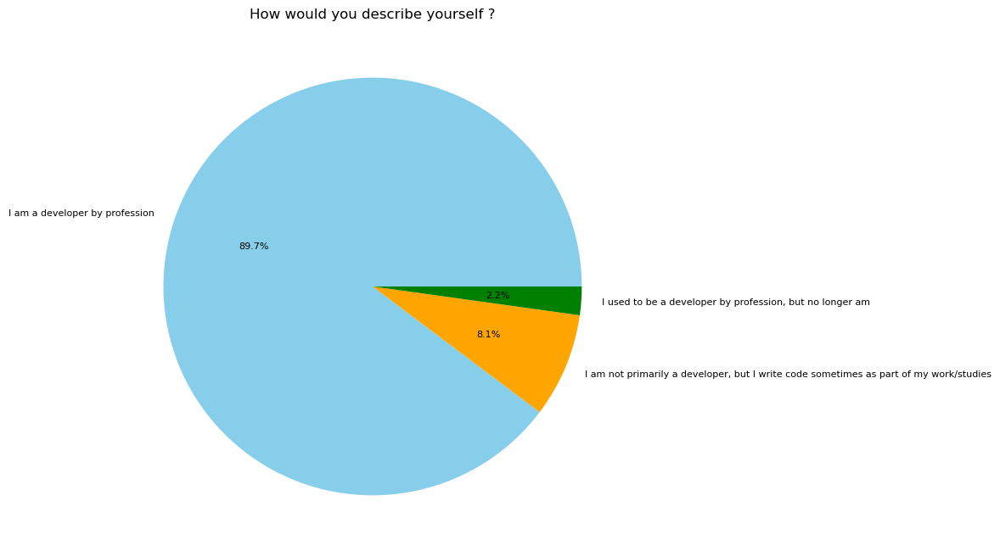

In [23]:
Main_branch_group=survey_df.groupby('MainBranch').count()[['ResponseId']]
draw_pie(Main_branch_group,'MainBranch',8,8,'How would you describe yourself ?',colors_branch)

<b>90% of the survey takers are developers by profession</b>. A distant second are those who are not primarily developers but sometimes write code as part of work or studies. The rest are those that were previously developers.

## Age Group Distribution

Next, the distribution of survey respondents across different age groups is analysed. This analysis provides insights into the generational diversity within the developer community.


Age
25-34 years old       43.833668
35-44 years old       29.100220
45-54 years old       11.735234
18-24 years old        9.394509
55-64 years old        4.586619
65 years or older      0.992556
Prefer not to say      0.195982
Under 18 years old     0.161211
Name: Perc, dtype: float64


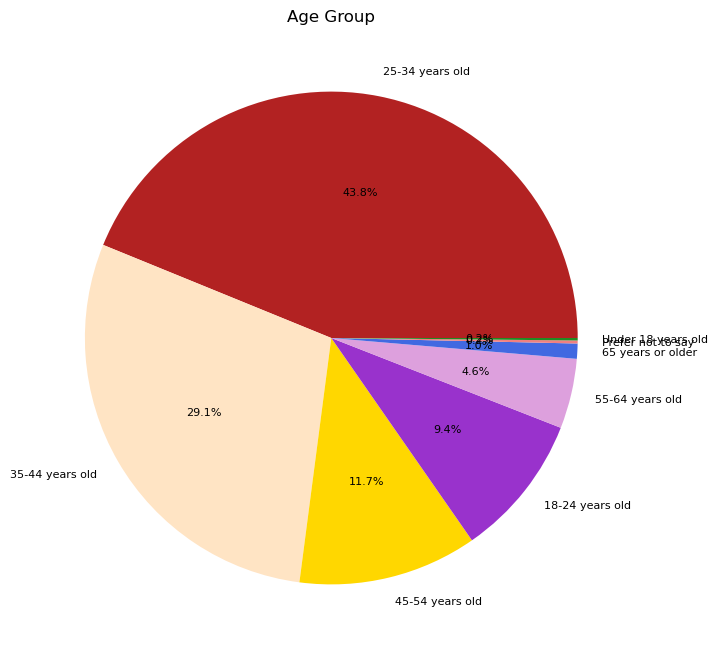

In [24]:
#Calculating percentage and drawing pie chart
Age_group=survey_df.groupby('Age').count()[['ResponseId']]
draw_pie(Age_group,'Age',8,8,'Age Group',colors_Age)

Most survey takers are in the age group <b>25-34 years old.</b> This makes sense as most survey takers are developers by profession. This is followed by by age groups <b>35-44 years old.</b> Therefore, most survey takers are those who are in the workforce. Next are those who are either in the early phase of their careers (18-24 years) or towards the end of their careers (45-54 years). Those who are under 18 or over 55 form a very small percentage of the survey takers. 

## Top 10 Countries Analysis

Next, the top 10 countries from which the survey takers originate are identified. This analysis provides geographical insights into the distribution of developers globally and highlights the countries with the largest representation in the survey.

In [25]:
Country_group=survey_df.groupby('Country').count()[['ResponseId']]
Country_group['Perc_Country']=(Country_group['ResponseId']/(Country_group['ResponseId']).sum())*100
Country_group.sort_values('Perc_Country',ascending=False).head(10)

,ResponseId,Perc_Country
Country,,
United States of America,14344,22.670734
Germany,5190,8.202810
United Kingdom of Great Britain and Northern Ireland,4318,6.824612
India,3336,5.272558
Canada,2614,4.131435
France,2257,3.567195
Netherlands,1774,2.803812
Poland,1728,2.731109
Australia,1567,2.476648


<b>About 23% of all survey takers are from the United States of America </b>. This is followed by Germany which makes up 8% and then United Kingdom and Northern Ireland and India which make up 7% and 5% respectively. 

Text(0.5, 1.0, 'Top 10 Countries in the survey takers demographic')

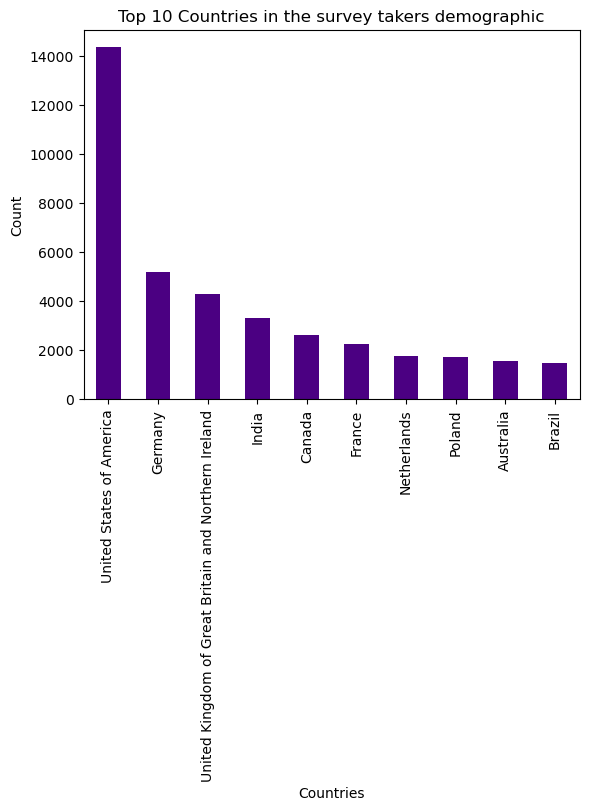

In [26]:
Country_group.sort_values('Perc_Country',ascending=False).head(10)['ResponseId'].plot(kind='bar', color="indigo")
plt.xlabel('Countries')
plt.ylabel('Count')
plt.title('Top 10 Countries in the survey takers demographic')

In [27]:
top_ten=Country_group.sort_values('Perc_Country',ascending=False).head(10)
top_ten[top_ten.Perc_Country.cumsum()<=50].Perc_Country

Country
United States of America                                22.670734
Germany                                                  8.202810
United Kingdom of Great Britain and Northern Ireland     6.824612
India                                                    5.272558
Canada                                                   4.131435
Name: Perc_Country, dtype: float64

<b>50% </b> of the survey takers are from <b>one of these 5 countries </b> - USA, Germany, UK and Northern Ireland, India or Canada.

## Employment Group Distribution

Exploring the distribution of survey respondents based on their employment status allows us to understand the employment landscape within the developer community.

In [28]:
Employment_group=survey_df.groupby('Employment').count()[['ResponseId']]
Employment_group['Perc_Employment']=(Employment_group['ResponseId']).sum()
Employment_group.index.unique()

Index(['Employed, full-time', 'Employed, full-time;Employed, part-time',
       'Employed, full-time;Independent contractor, freelancer, or self-employed',
       'Employed, full-time;Independent contractor, freelancer, or self-employed;Employed, part-time',
       'Employed, full-time;Independent contractor, freelancer, or self-employed;Retired',
       'Employed, full-time;Retired', 'Employed, part-time',
       'Employed, part-time;Retired', 'I prefer not to say',
       'Independent contractor, freelancer, or self-employed',
       'Independent contractor, freelancer, or self-employed;Employed, part-time',
       'Independent contractor, freelancer, or self-employed;Employed, part-time;Retired',
       'Independent contractor, freelancer, or self-employed;Retired',
       'Retired'],
      dtype='object', name='Employment')

There are 63271 data values in the survey_df. Employment status question in the dataset allowed for multiple option selection. Therefore the dataset consists of the employment data as combinations. To identify each unique employment status, this data is first split and exploded to ensure all options are considered: <br>

1. Employed, full time<br>
2. Employed, Part time <br>
3. Student, fulltime <br>
4. Student, parttime <br>
5. Independent contractor, freelancer, or self-employed <br>
6. Not employed,but looking for work <br>
7. Not employed, and not looking for work<br>
8. Retired <br>
9. Prefer not to say <br>

Because multiple options are possible, it is important to ensure the selections are not conflicting. One such conflicting selection is Employed Full time and Retired. Therefore, to ensure these conflicting data are not considered, responses with this selection are dropped.

In [29]:
emp_analysis=survey_df.copy()
emp_analysis['Employment']=emp_analysis['Employment'].str.split(';')
emp_analysis=emp_analysis[['ResponseId','Employment']]
emp_analysis['Count']=emp_analysis['Employment'].str.len()
emp_analysis['EmpChoice1']=emp_analysis['Employment'].str[0]
emp_analysis['EmpChoice2']=emp_analysis['Employment'].str[1]
emp_analysis['EmpChoice3']=emp_analysis['Employment'].str[3]
emp_analysis=emp_analysis[emp_analysis['EmpChoice1']=='Employed, full-time']
emp_analysis=emp_analysis[emp_analysis['EmpChoice2']=='Retired']

data_set=survey_df.copy()#63271 rows × 24 columns

for i in emp_analysis.index:
    data_set=data_set.drop(data_set[data_set['ResponseId']==emp_analysis.loc[i]['ResponseId']].index)
data_set    #63260 rows × 24 columns
survey_df=data_set

Employment
Employed, full-time                                     80.070186
Independent contractor, freelancer, or self-employed    16.313789
Employed, part-time                                      2.940488
Retired                                                  0.463518
I prefer not to say                                      0.212019
Name: Perc, dtype: float64


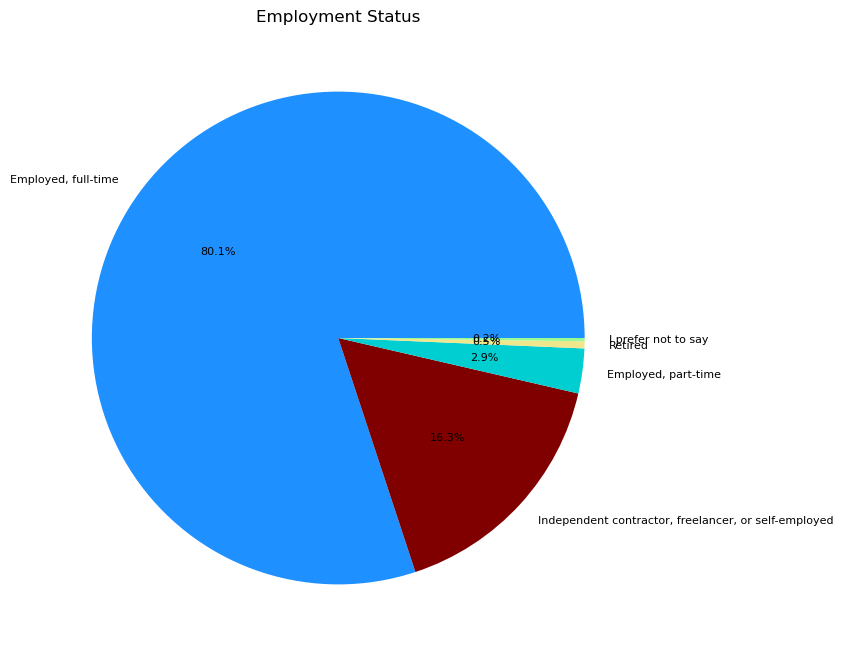

In [30]:
emp_analysis=survey_df.copy()
emp_analysis['Employment']=emp_analysis['Employment'].str.split(';')
emp_analysis=emp_analysis.explode('Employment')
emp_group=emp_analysis.groupby('Employment').count()[['ResponseId']]
draw_pie(emp_group,'Employment',8,8,'Employment Status',colors_emp)

<b>80% of the survey takers are Employed full time.</b> This correlates with the finding that most survey takers are developers by profession. This is followed distantly by <b>Independent contractor, freelancer, or self-employed.</b> The rest form a very low percentage.

## Education Level Distribution

An analysis of the highest level of education of the survey takers is also analysed. This allows understanding of the different educational backgrounds of the developers.

EdLevel
Bachelor's degree (B.A., B.S., B.Eng., etc.)                                          46.130256
Master's degree (M.A., M.S., M.Eng., MBA, etc.)                                       27.967120
Some college/university study without earning a degree                                11.430604
Professional degree (JD, MD, Ph.D, Ed.D, etc.)                                         5.196016
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     4.454632
Associate degree (A.A., A.S., etc.)                                                    3.141005
Something else                                                                         1.160291
Primary/elementary school                                                              0.520076
Name: Perc, dtype: float64


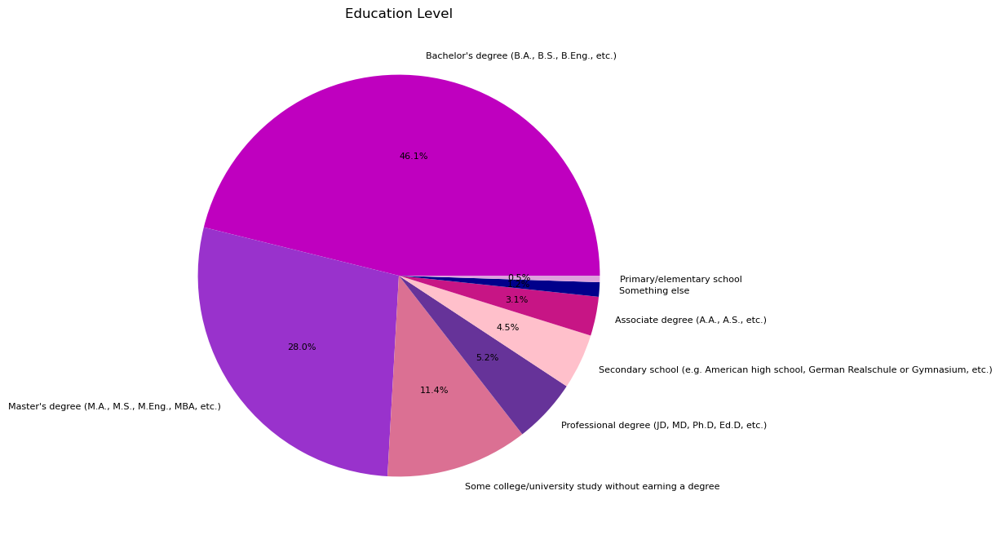

In [31]:
EDlevel_group=survey_df.groupby('EdLevel').count()[['ResponseId']]
draw_pie(EDlevel_group,'EdLevel',8,8,'Education Level',colors_ED)

<b>Almost 50% </b> of the survey takers have the highest degree - <b>Bachelor's degree (B.A., B.S., B.Eng., etc.). </b>This is followed by  <b>Master's degree (M.A., M.S., M.Eng., MBA, etc.). </b> About 5% of the survey takers are still in school and just a little over 5% have a Professional degree (JD, MD, Ph.D, Ed.D, etc.).

## Industry Group Distribution

Finally, the distribution of survey respondents across different industries is analysed. 

Industry
Information Services, IT, Software Development, or other Technology    49.526109
Financial Services                                                     12.166190
Other                                                                  10.851812
Manufacturing, Transportation, or Supply Chain                          7.024917
Healthcare                                                              6.077134
Retail and Consumer Services                                            5.376729
Higher Education                                                        3.117549
Advertising Services                                                    2.139962
Insurance                                                               1.931330
Oil & Gas                                                               0.724249
Legal Services                                                          0.572246
Wholesale                                                               0.491774
Name: Perc, dtype: 

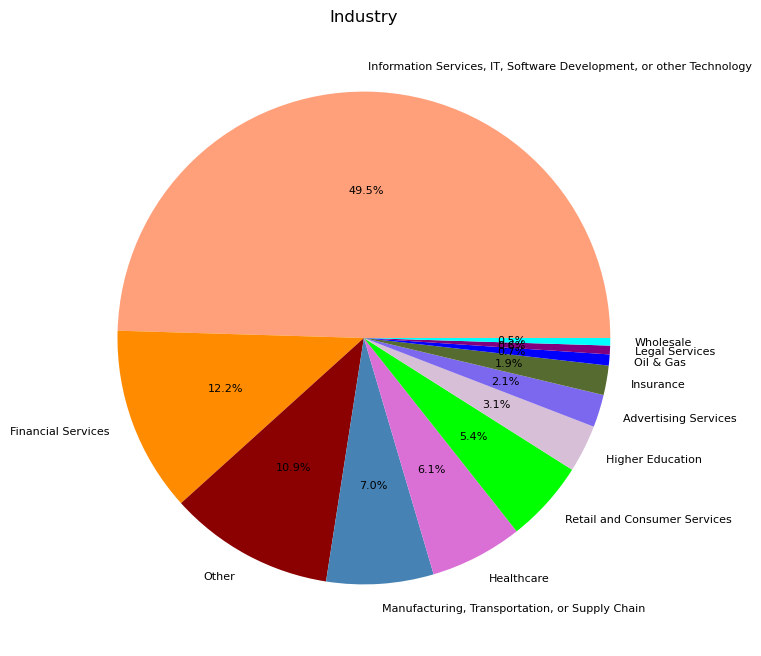

In [32]:
Industry_group=survey_df.groupby('Industry').count()[['ResponseId']]
draw_pie(Industry_group,'Industry',8,8,'Industry',colors_Industry)

<b>50%</b> of all survey takers are from the <b>IT sector</b>, followed by <b>Financial Services</b>.

# Education and Professional Background

Understanding the educational backgrounds and professional trajectories of survey respondents is crucial for gaining insights into their skills, expertise, and career paths. In this section, various aspects of the education and professional background of the survey respondents are analysed, shedding light on their qualifications, employment status, coding activities, and resources used.

In [33]:
ED_Emp_analysis=survey_df.copy()
ED_Emp_analysis['Employment']=ED_Emp_analysis['Employment'].str.split(';')
ED_Emp_analysis=ED_Emp_analysis.explode('Employment')
ED_Emp_analysis['CodingActivities']=ED_Emp_analysis['CodingActivities'].str.split(';')
ED_Emp_analysis=ED_Emp_analysis.explode('CodingActivities')
ED_Emp_analysis['LearnCode']=ED_Emp_analysis['LearnCode'].str.split(';')
ED_Emp_analysis=ED_Emp_analysis.explode('LearnCode')
ED_Emp_relation=ED_Emp_analysis[['ResponseId','MainBranch','Age','EdLevel','Employment','YearsCode','CodingActivities','LearnCode','WorkExp','Industry']]
ED_Emp_relation

,ResponseId,MainBranch,Age,EdLevel,Employment,YearsCode,CodingActivities,LearnCode,WorkExp,Industry
2,11,I am a developer by profession,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",14.0,Hobby,Books / Physical media,3.0,Other
2,11,I am a developer by profession,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",14.0,Hobby,Friend or family member,3.0,Other
2,11,I am a developer by profession,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",14.0,Hobby,"Other online resources (e.g., videos, blogs, f...",3.0,Other
2,11,I am a developer by profession,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",14.0,Hobby,"School (i.e., University, College, etc)",3.0,Other
3,27,I am a developer by profession,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",16.0,Hobby,Books / Physical media,9.0,"Information Services, IT, Software Development..."
...,...,...,...,...,...,...,...,...,...,...
89181,88011,I am a developer by profession,35-44 years old,Some college/university study without earning ...,"Independent contractor, freelancer, or self-em...",23.0,Professional development or self-paced learnin...,Online Courses or Certification,NaN,NaN
89181,88011,I am a developer by profession,35-44 years old,Some college/university study without earning ...,"Independent contractor, freelancer, or self-em...",23.0,Professional development or self-paced learnin...,"Other online resources (e.g., videos, blogs, f...",NaN,NaN
89183,88950,"I am not primarily a developer, but I write co...",65 years or older,"Secondary school (e.g. American high school, G...",Retired,46.0,NaN,Books / Physical media,NaN,NaN
89183,88950,"I am not primarily a developer, but I write co...",65 years or older,"Secondary school (e.g. American high school, G...",Retired,46.0,NaN,Colleague,NaN,NaN


## Main Branch and Education Level, Professional Background, Industry Comparison

Beginning by comparing the main branch of survey takers with their highest level of formal education completed. This analysis provides insights into the educational qualifications of developers across different roles within the developer community.

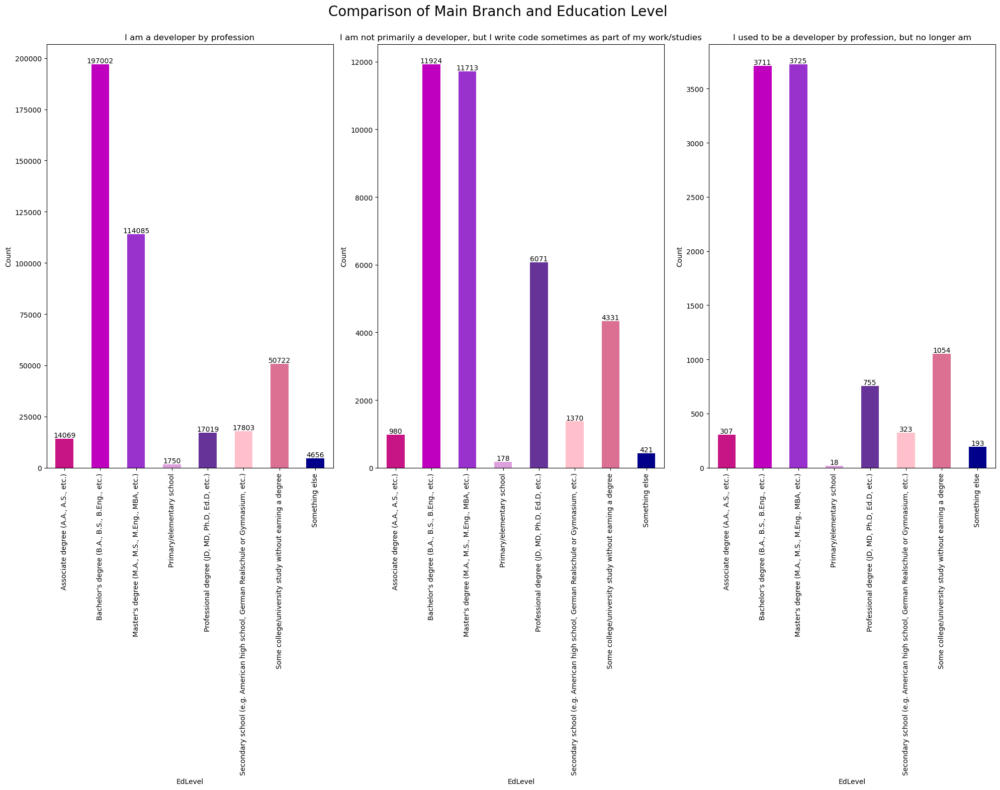

In [34]:
grouped_data = ED_Emp_relation.groupby(['EdLevel','MainBranch' ]).size().unstack()
plot_grouped_bar_plots(1,3,'EdLevel','MainBranch',grouped_data,20,16,'EdLevel','Count','Comparison of Main Branch and Education Level \n',colors_ED)

<b>Inference:</b><br>
<br>1. <b>I am a developer by profession:</b> Most developers in the workforce have a Bachelor's degree as their highest level of education. A master's degree is the next highest degree followed by some university study without a degree. Indicating it is the skills that are more important than the formal education.<br>
<br>2.<b>I am not primarily a developer, but I write code sometimes as part of my work/studies:</b> The number of people who selected this main branch have either a Bachelor's or Master's degree. This group is also the one that has the relatively highest number of developers with a Professional Degree. Therefore, for certain jobs that may primarily be related to developers, a higher education level is preferred. The number of survey takers without a degree is a relatively lower percentage than those who are developers.<br>
<br>3.<b>I used to be a developer  by profession, but no longer am:</b>Similar to those who are not primarily developers, survey takers who were previously developers but are now in other professions have a similar number of people with a bachelor's and Master's degree, again highlighting that to become a good developer a Bachelor's degree is sufficient. Also, the number of people without a degree is slightly higher than those with a Professional Degree. Therefore, it comes down to the type of job.

Next the Main branch and the employment status are compared:

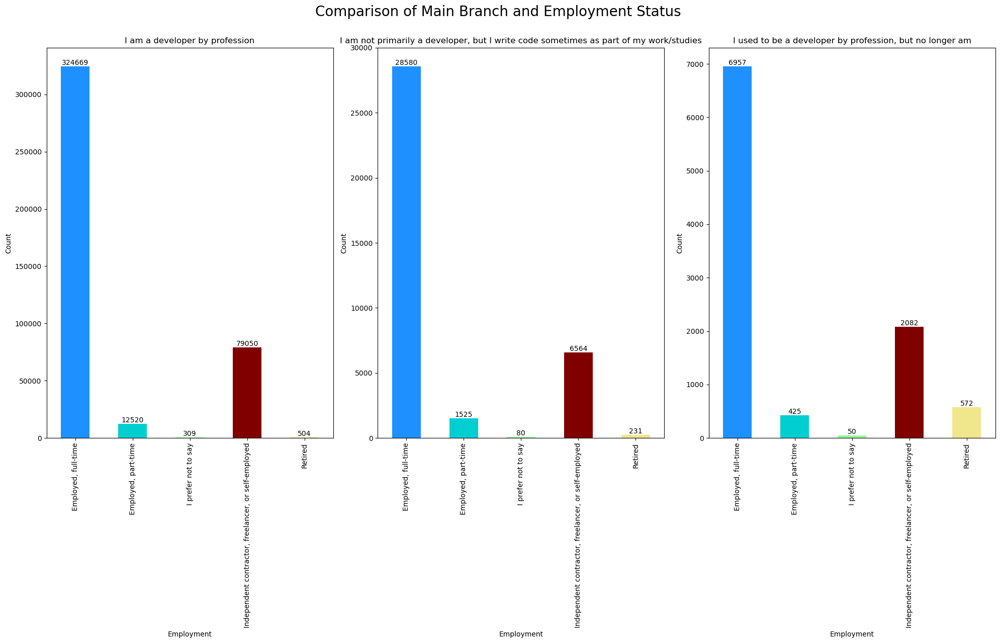

In [35]:
grouped_data=ED_Emp_relation.groupby(['Employment','MainBranch']).size().unstack()
plot_grouped_bar_plots(1,3,'Employment','MainBranch',grouped_data,20,13,'Employment','Count','Comparison of Main Branch and Employment Status \n',colors_emp)

<b>Inference:</b><br>
1. Regardless of the main branch, most survey takers are <b>employed full time</b>. 
2. Survey takers who used to be developers, have a higher percentage of self-employed or retired employment status than the other branches.

Finally, the Main branch is compared to the type of industry:

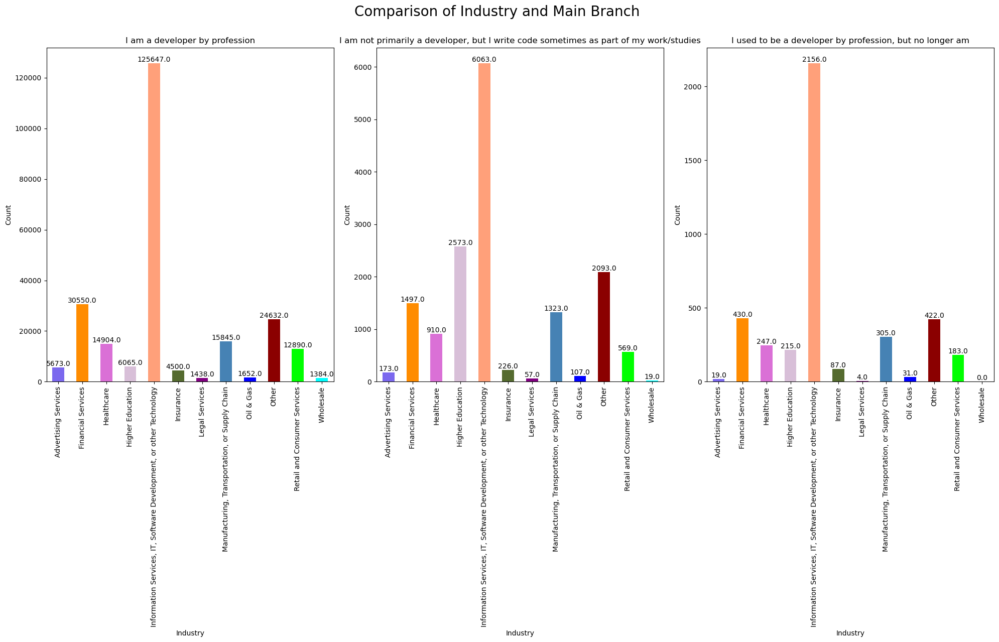

In [36]:
grouped_data = ED_Emp_relation.groupby(['Industry','MainBranch']).size().unstack()
plot_grouped_bar_plots(1,3,'Industry','MainBranch',grouped_data,20,13,'Industry','Count','Comparison of Industry and Main Branch \n',colors_Industry)

<b>Inference:</b><br>
1. Most developers regardless of their Main Branch work in the <b>IT sector</b>. 
2. For <b>current and previous developers, the Financial Services industry is also a popular choice</b>, but only a distant second. For those who code as part of their work or studies, a realtively higher variation in industry employed in is noticed.
3. A higher percentage of those who work in higher education or Manufacturing are those who are not primarily developers but write code as part of their work.

## Comparison of Education level and Professional status

Now comparing the education level and the professional Status. This comparison offers insights into the correlation between educational qualifications and employment opportunities within the developer community.

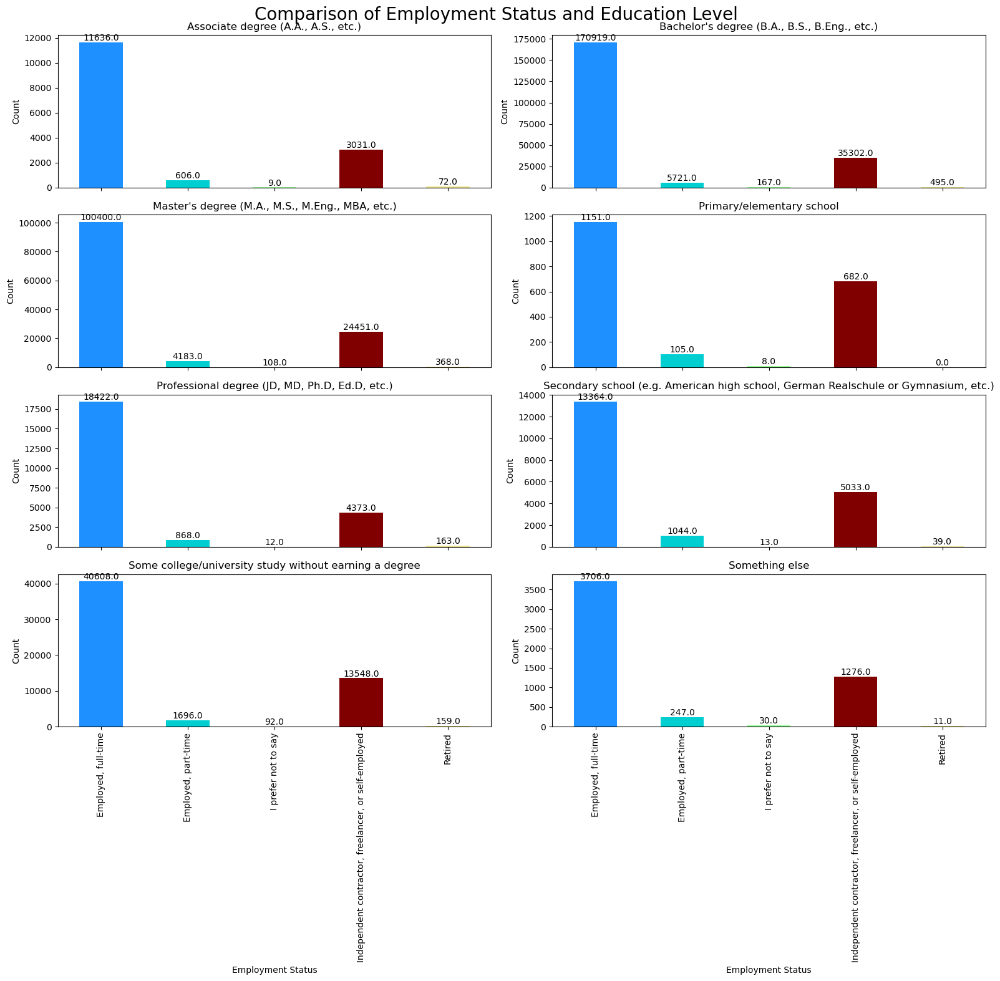

In [37]:
df=ED_Emp_relation.groupby([ 'Employment','EdLevel']).size().unstack()
plot_grouped_bar_plots(4,2,'Employment','EdLevel',df,16,16,'Employment Status','Count','Comparison of Employment Status and Education Level',colors_emp)

<b>Inference:</b><br>
1. Regardless of the education level, most survey takers are <b>either employed full time or self employed.</b> 
2. In each education level, <b>a higher percentage of people are self employed than employed part time.</b> 
3. A higher percentage of people who are <b>freelance/self-employed and employed part time </b>are those who are either <b>still in school or have been to university without earning a degree. </b>
4. People with a <b>formal degree</b> are more likely to be <b>employed full time.</b>

## Comparison of Coding Activity performed outside work and Education level and Professional status

Coding activities in the survey have the below options possible:

1. Hobby 
2. Contribute to open-source projects
3. Freelance/contract work
4. Professional development or self-paced learning from online courses
5. Other
6. Bootstrapping a business
7. I don't code outside of work
8. School or academic work

Again as in the case of employment status, multiple options are possible. An example of a conflicting selection would be <b>I don't code outside of work</b> and any other Coding Activity option. Therefore, it is checked if any conflicting options are selected: 

In [38]:
#checking if for cases where more than one answer is selected in Coding activities outside if conflicting answers are selected such as 'I don't code outside work' and any other option
Coding_Act=survey_df.copy()
Coding_Act['CodingActivities']=Coding_Act['CodingActivities'].str.split(';')
Coding_Act['CodingActivities_options']=Coding_Act['CodingActivities'].str.len()
df=Coding_Act[['ResponseId','CodingActivities','CodingActivities_options']].sort_values('CodingActivities_options',ascending=False)[Coding_Act.CodingActivities_options>1]
df=df[df.CodingActivities_options>1]

ind=df.index
ind
ind_yes=[]
ind_no=[]
count_yes=0
count_no=0
for x in ind:
    if "I don't code outside work" in df.loc[x].CodingActivities:
        ind_yes.append(df.loc[x].ResponseId)
        count_yes+=1
        
    else:
        ind_no.append(df.loc[x].ResponseId)
        count_no+=1
                       
print("Number of Conflicting Selections: "+ str(count_yes))
print("Number of Valid Selections: "+ str(count_no))

Number of Conflicting Selections: 0
Number of Valid Selections: 33580


No conflicting options are selected. Therefore the dataset needs no changes.

### Coding Activities Distribution

CodingActivities
Hobby                                                                  37.853395
Professional development or self-paced learning from online courses    19.714086
Contribute to open-source projects                                     13.314722
Freelance/contract work                                                10.169492
Bootstrapping a business                                                7.640515
I don't code outside of work                                            7.140943
School or academic work                                                 3.325871
Other                                                                   0.840975
Name: Perc, dtype: float64


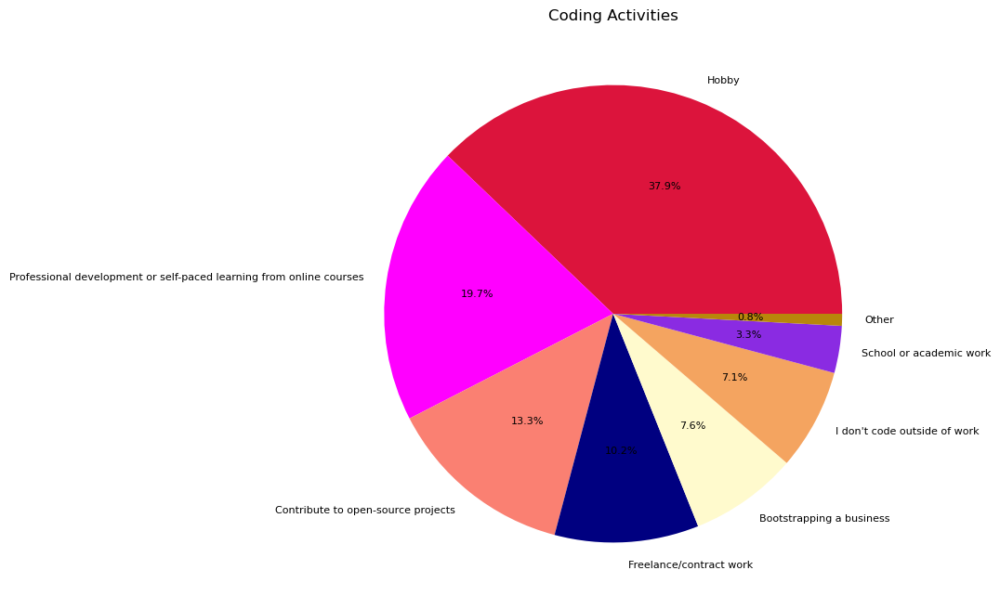

In [39]:
Coding_Act=ED_Emp_relation[['ResponseId','CodingActivities']]
Coding_Act=Coding_Act.dropna(subset='CodingActivities')
Coding_Act=Coding_Act.drop_duplicates()
Coding_Act=Coding_Act.groupby(['CodingActivities']).count()[['ResponseId']]
draw_pie(Coding_Act,'CodingActivities',8,8,'Coding Activities',colors_Coding)

About <b>40%</b> of the survey takers code outside of work as a <b>Hobby</b>, followed by <b>Professional Development</b> and <b>Contribution to open source projects.</b> Only 7% of survey takers don't code outside of work. Around 10% and & 7.6% of survey takers are indulged in freelance work or bootstrapping a business respectively.

### Comparison of Coding Activities performed and Main Branch

How do survey takers that have different branches code outside of work ? 

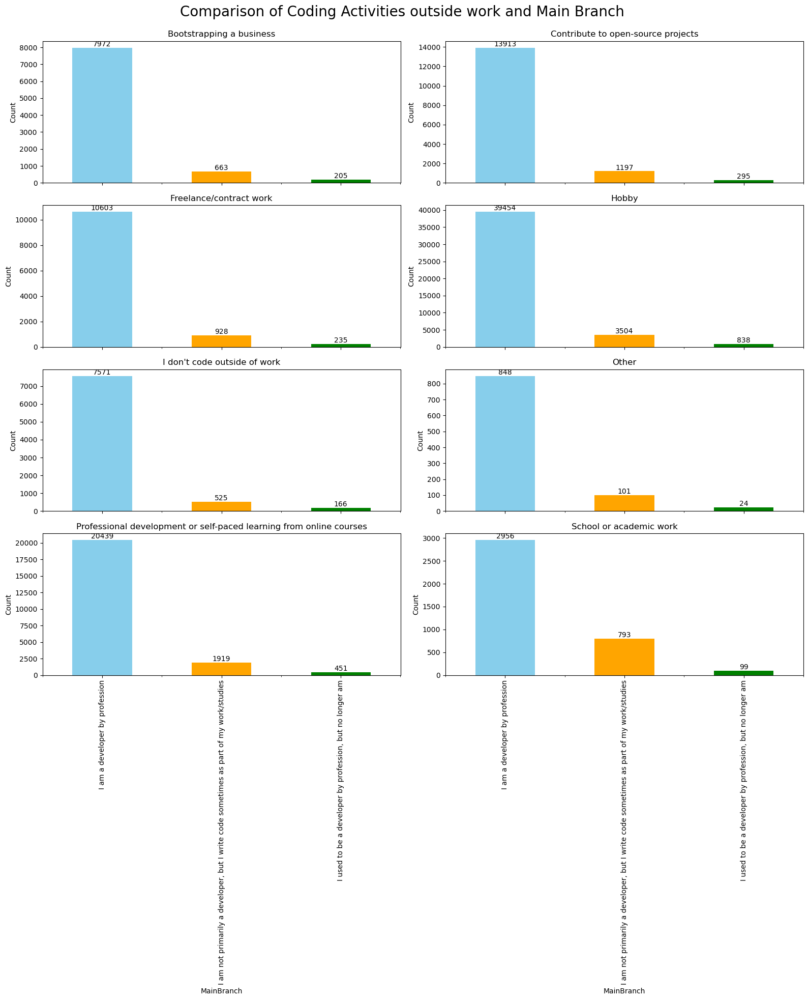

In [40]:
#Variation with Branch
Branch_coding=ED_Emp_relation[['ResponseId','CodingActivities','MainBranch']]
Branch_coding=Branch_coding.dropna(subset='CodingActivities')
Branch_coding=Branch_coding.dropna(subset='MainBranch')
Branch_coding=Branch_coding.drop_duplicates()
df=Branch_coding[['ResponseId','CodingActivities','MainBranch']]
df=df.groupby(['MainBranch','CodingActivities']).size().unstack()
plot_grouped_bar_plots(4,2,'MainBranch','CodingActivities',df,16,20,'MainBranch','Count','Comparison of Coding Activities outside work and Main Branch \n',colors_branch)

<b>Inference:</b><br>
1. Regardless of the coding activities, most of these activities are performed by <b>developers</b>, given that a higher percentage of the survey takers are developers.
2. The highest percentage of those who <b>code as part of professional development or as part of school or academics</b> are people who are not primarily developers but <b>code as part of work or school. </b>

### Comparison of Coding Activities performed and Main Branch
What education level would be required to perform certain coding activities ? 

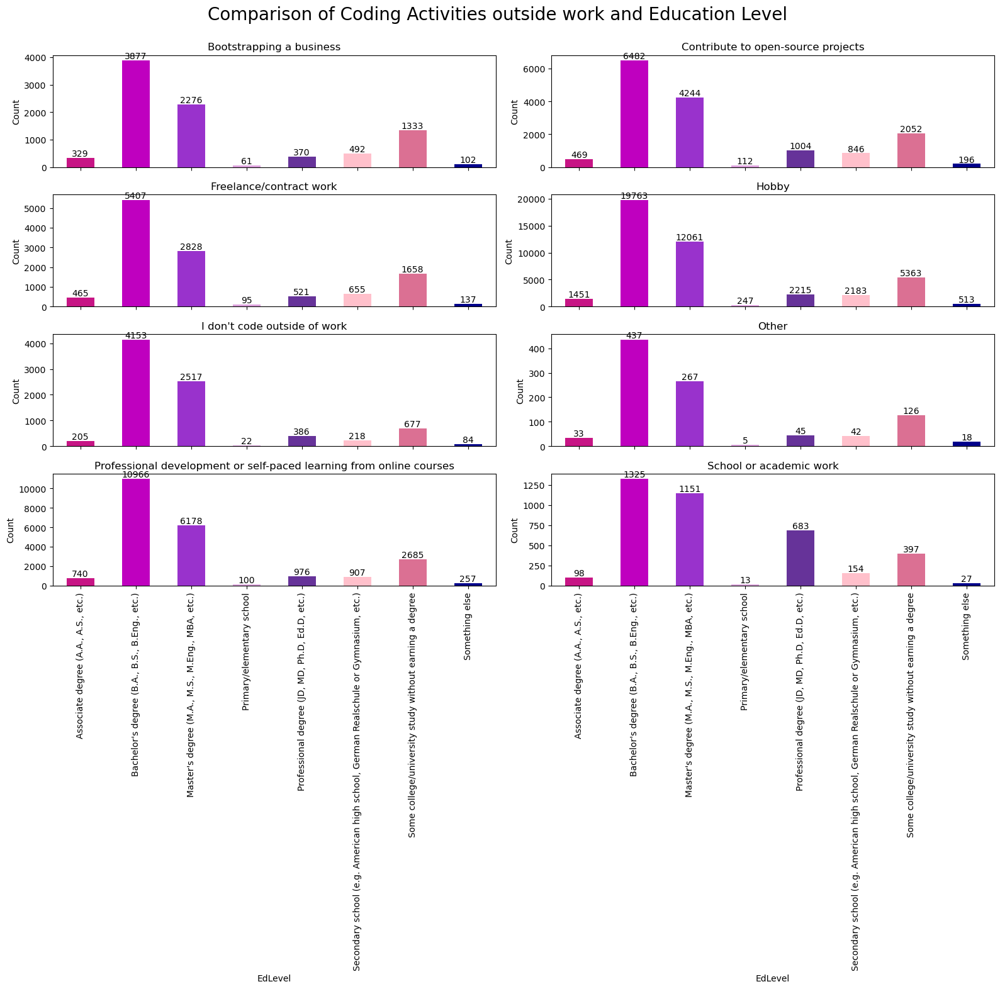

In [41]:
#Variation with Education Level
ED_coding=ED_Emp_relation[['ResponseId','CodingActivities','EdLevel']]
ED_coding=ED_coding.dropna(subset='CodingActivities')
ED_coding=ED_coding.dropna(subset='EdLevel')
ED_coding=ED_coding.drop_duplicates()
df=ED_coding[['ResponseId','CodingActivities','EdLevel']]
df=df.groupby(['EdLevel','CodingActivities']).size().unstack()
plot_grouped_bar_plots(4,2,'EdLevel','CodingActivities',df,16,16,'EdLevel','Count','Comparison of Coding Activities outside work and Education Level \n',colors_ED)

<b>Inference:</b>
1. <b>A bachelor's degree</b> is sufficient to perform most of these coding activities.
2. Those who perform <b>coding as part of school or academic work</b> are those who are <b>either enrolled or have a higher level of education such as a Professional degree.</b>

### Comparison of Coding Activities performed and Employment Status
How does employment status influence coding activities performed outside of work ?

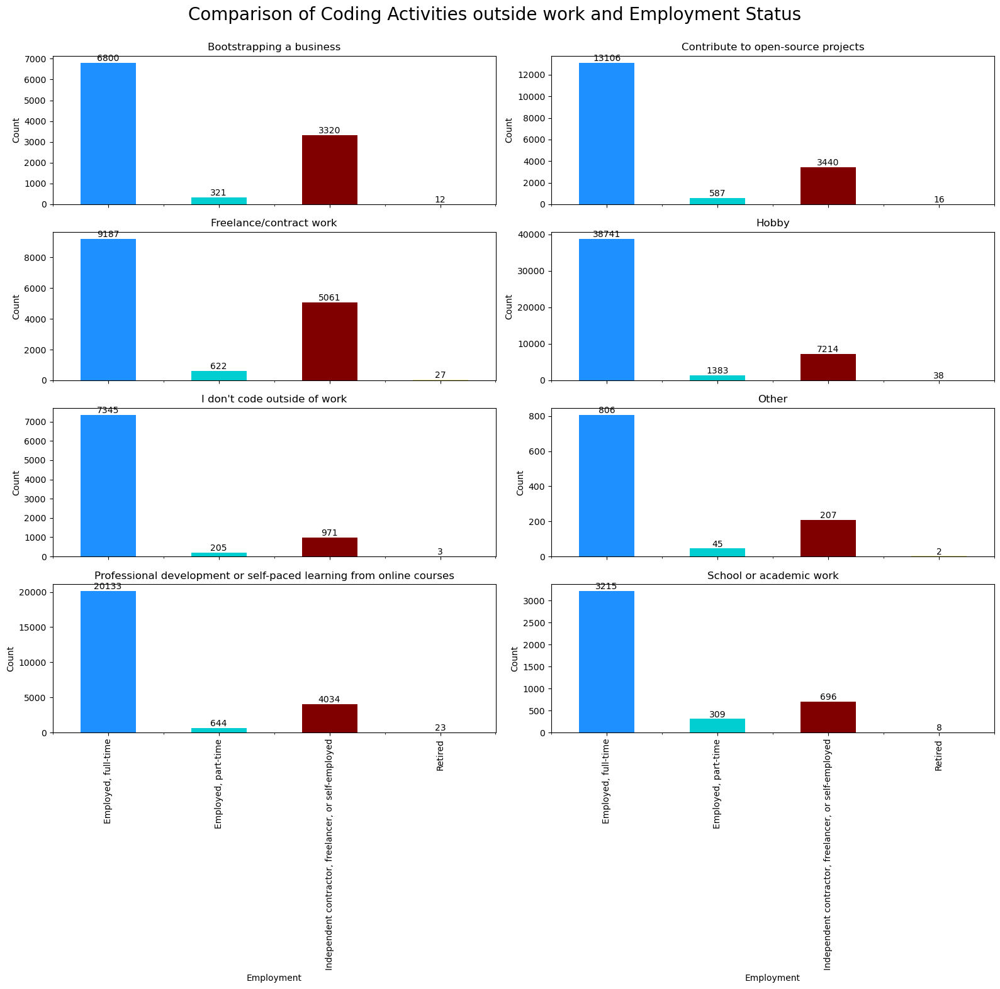

In [42]:
#Variation with employment status
Emp_coding=ED_Emp_relation[['ResponseId','CodingActivities','Employment']]
Emp_coding=Emp_coding.dropna(subset='CodingActivities')
Emp_coding=Emp_coding.dropna(subset='Employment')
Emp_coding['Employment']=Emp_coding['Employment'].str.split(';')
Emp_coding=Emp_coding.explode('Employment')
Emp_coding=Emp_coding.drop_duplicates()
df=Emp_coding[['ResponseId','CodingActivities','Employment']]
df=df.groupby(['Employment','CodingActivities']).size().unstack()
plot_grouped_bar_plots(4,2,'Employment','CodingActivities',df,16,16,'Employment','Count','Comparison of Coding Activities outside work and Employment Status  \n',colors_emp)

<b>Inference:</b><br>
1. Most of the people who perform any coding activities outside of work, regardless of the activity, are <b>empolyed full time.</b>
2. A higher percentage of <b>Independent contractors, freelancers  and self-employed</b> survey takers are involved in coding activities such as <b>Bootstrapping a business, freelance work and open source projects. </b>
3. Most <b>retired</b> survey takers are still involved in coding as a <b>hobby.</b> 
4. Survey takers who are <b>employed full time</b> are involved in coding activities as part of <b>Hobby, professional development or contributing to open source projects.</b>

### Comparison of Coding Activities performed and Age Group
How do coding activities performed outside of work change with certain age groups?

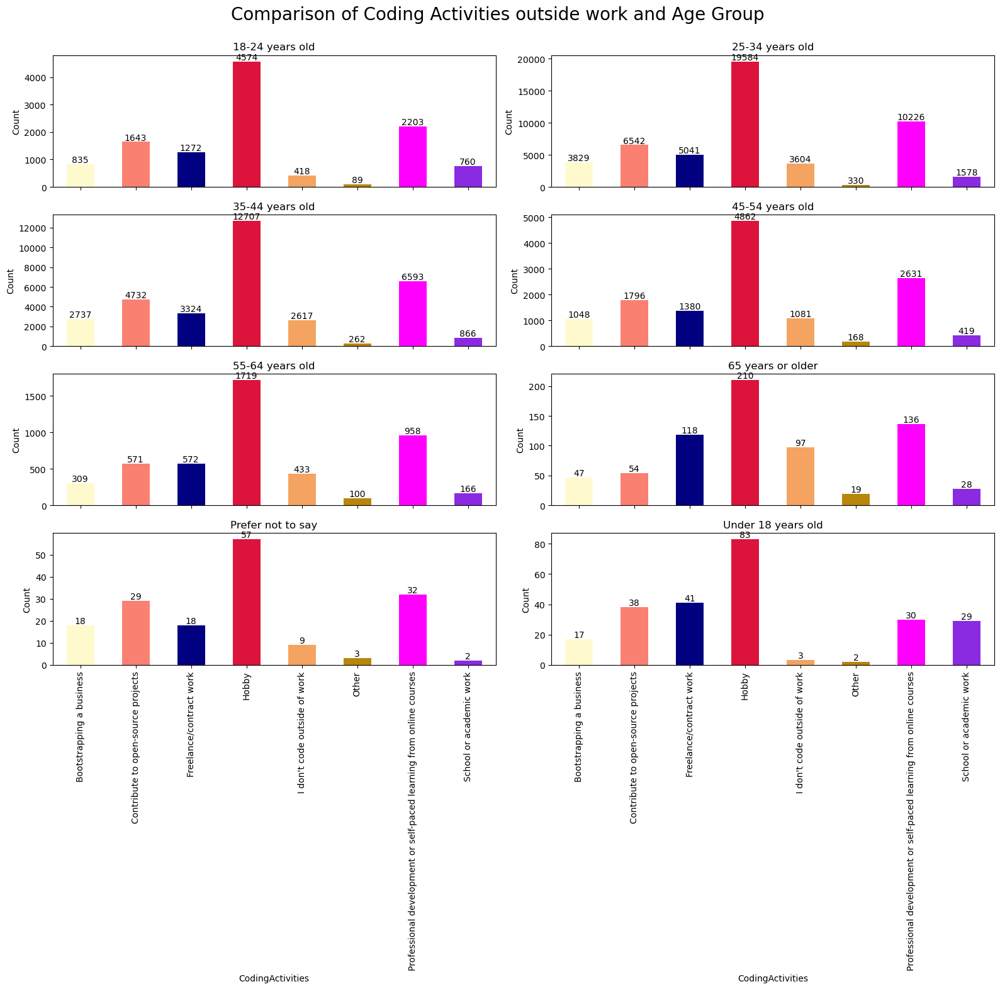

In [43]:
#Variation with age
Age_coding=ED_Emp_relation[['ResponseId','CodingActivities','Age']]
Age_coding=Age_coding.dropna(subset='CodingActivities')
Age_coding=Age_coding.dropna(subset='Age')
Age_coding=Age_coding.drop_duplicates()
df=Age_coding[['ResponseId','CodingActivities','Age']]
df=df.groupby([ 'CodingActivities','Age']).size().unstack()
plot_grouped_bar_plots(4,2,'CodingActivities','Age',df,16,16,'CodingActivities','Count','Comparison of Coding Activities outside work and Age Group \n',colors_Coding)

<b>Inference:</b> The analysis doesn't present any particularly egregious results, but confirms what is usually expected.<br>
1. Regardless of the age group, coding as part of <b>a hobby</b> is still dominant. 
2. <b>Older people (65 or older)</b> have a higher percentage of those who <b>don't code outside work</b>.
3. <b>Younger people (under 18 and 18-24 years old)</b> are more likely to perfom <b>coding as part of academics</b> than any other age group. 
4. People in the <b>work force (25-34 and 35-44 years old) </b>are more likely to <b>bootstrapping business, freelance work, and open source projects.</b>
5. <b>Older people (65 or older)</b> have a higher percentage of those who <b>code as part of professional development or freelance work.</b>

### Comparison of Coding Activities performed and Years of coding experience
How do coding activities performed outside of work change with years of coding experience?

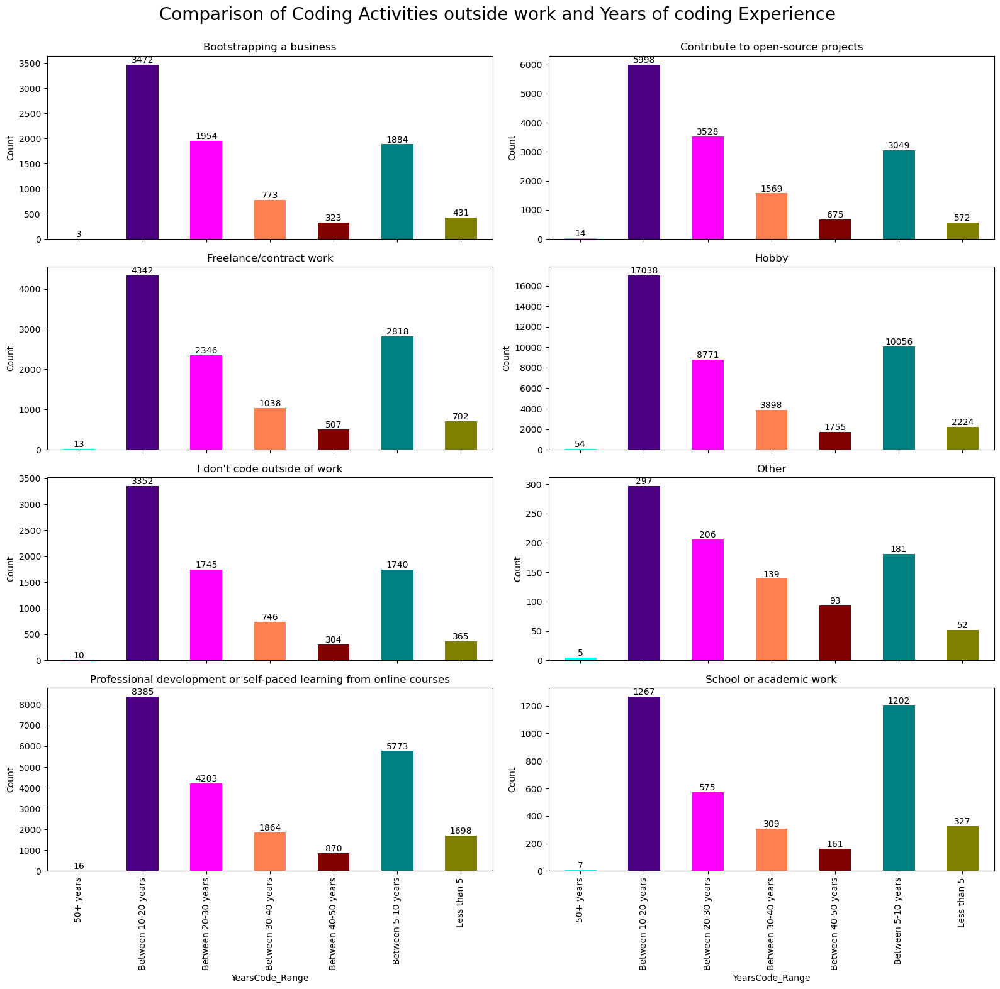

In [44]:
#Variation with number of years
Exp_coding=ED_Emp_relation[['ResponseId','CodingActivities','YearsCode']]
Exp_coding=Exp_coding.dropna(subset='CodingActivities')
Exp_coding=Exp_coding.dropna(subset='YearsCode')
Exp_coding=Exp_coding.drop_duplicates()
Exp_coding['YearsCode_Range']=Exp_coding['YearsCode'].apply(YearCode_range)
df=Exp_coding.groupby(['YearsCode_Range','CodingActivities']).size().unstack()
plot_grouped_bar_plots(4,2,'YearsCode_Range','CodingActivities',df,16,16,'YearsCode_Range','Count','Comparison of Coding Activities outside work and Years of coding Experience \n',colors_YearsExp)

<b>Inference:</b> As in the previous analysis, variation of coding activities with years of coding experience doesn't present any particularly egregious results, but confirms what is usually expected.<br>
1. Regardless of the years of experience, coding as part of <b>a hobby</b> is still dominant. 
2. It would be expected that people with <b>the most years of experience (50+ years)</b> would be more involved in bootstrapping business, freelance or open source projects. However,<b> most of them code as a hobby.</b>
3. People who have <b>just entered the work force</b> , with limited experience <b>(under 5 years)</b>, are mostly coding as <b>part of academic work or professional development.</b>
4. <b>Open source projects, bootstrapping a business or freelance projects</b> are mostly performed by those who have significant experience and are in the work force (<b>Years of experience between 5-20 years</b>).

## Professional Development

Are survey takers actively engaged in continuous learning ? To determine this cases where no resources for continuous learning are identified and compared to those that do. Only <b>0.2%</b> of the survey takers <b>are not actively engaged in continuous learning.</b>

,Learning,Count
0,Learning,63114
1,No Learning,146


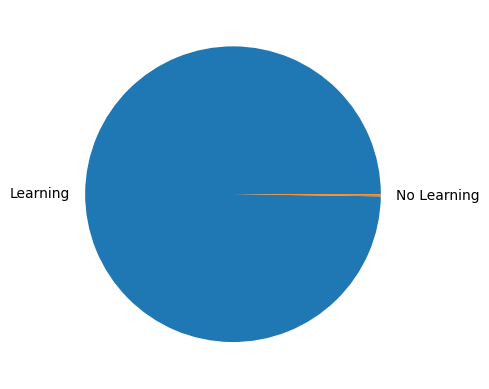

In [45]:
#Are survey takers actively engaged in continuous learning and their preferred professional development resources.

No_learning=survey_df[survey_df['LearnCode'].isna()].count()['ResponseId']
learning=len(survey_df['ResponseId'])-No_learning
Continous_learning=pd.DataFrame(data=[['Learning',learning],['No Learning',No_learning]],columns=['Learning','Count'])
Continous_learning.Count.plot(kind="pie",labels=Continous_learning.Learning).axes.get_yaxis().set_visible(False)
Continous_learning

Most survey takers are engaged in continuous learning. What resources they prefer are analysed below.

In [46]:
Resources= survey_df[['ResponseId','MainBranch','Country','Age','EdLevel','Employment','CodingActivities','YearsCode','LearnCode','Industry']]
Resources=Resources.dropna(subset=['LearnCode'])
Resources['LearnCode']=Resources['LearnCode'].str.split(';')
Resources['ResourceCount']=Resources['LearnCode'].str.len()
Resources=Resources.explode('LearnCode')
Resources['Employment']=Resources['Employment'].str.split(';')
Resources=Resources.explode('Employment')
Resources['CodingActivities']=Resources['CodingActivities'].str.split(';')
Resources=Resources.explode('CodingActivities')
Resources.drop_duplicates()

,ResponseId,MainBranch,Country,Age,EdLevel,Employment,CodingActivities,YearsCode,LearnCode,Industry,ResourceCount
2,11,I am a developer by profession,United States of America,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",Hobby,14.0,Books / Physical media,Other,4
2,11,I am a developer by profession,United States of America,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",Hobby,14.0,Friend or family member,Other,4
2,11,I am a developer by profession,United States of America,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",Hobby,14.0,"Other online resources (e.g., videos, blogs, f...",Other,4
2,11,I am a developer by profession,United States of America,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",Hobby,14.0,"School (i.e., University, College, etc)",Other,4
3,27,I am a developer by profession,Belgium,25-34 years old,"Bachelor's degree (B.A., B.S., B.Eng., etc.)","Employed, full-time",Hobby,16.0,Books / Physical media,"Information Services, IT, Software Development...",3
...,...,...,...,...,...,...,...,...,...,...,...
89181,88011,I am a developer by profession,New Zealand,35-44 years old,Some college/university study without earning ...,"Independent contractor, freelancer, or self-em...",Bootstrapping a business,23.0,"Other online resources (e.g., videos, blogs, f...",NaN,3
89181,88011,I am a developer by profession,New Zealand,35-44 years old,Some college/university study without earning ...,"Independent contractor, freelancer, or self-em...",Professional development or self-paced learnin...,23.0,"Other online resources (e.g., videos, blogs, f...",NaN,3
89183,88950,"I am not primarily a developer, but I write co...",Australia,65 years or older,"Secondary school (e.g. American high school, G...",Retired,NaN,46.0,Books / Physical media,NaN,3
89183,88950,"I am not primarily a developer, but I write co...",Australia,65 years or older,"Secondary school (e.g. American high school, G...",Retired,NaN,46.0,Colleague,NaN,3


LearnCode
Other online resources (e.g., videos, blogs, forum)    22.931451
Books / Physical media                                 15.965872
On the job training                                    15.563044
Online Courses or Certification                        14.380167
School (i.e., University, College, etc)                14.146975
Colleague                                               7.723224
Friend or family member                                 2.889293
Coding Bootcamp                                         2.532190
Hackathons (virtual or in-person)                       2.176915
Other                                                   1.690870
Name: Perc, dtype: float64


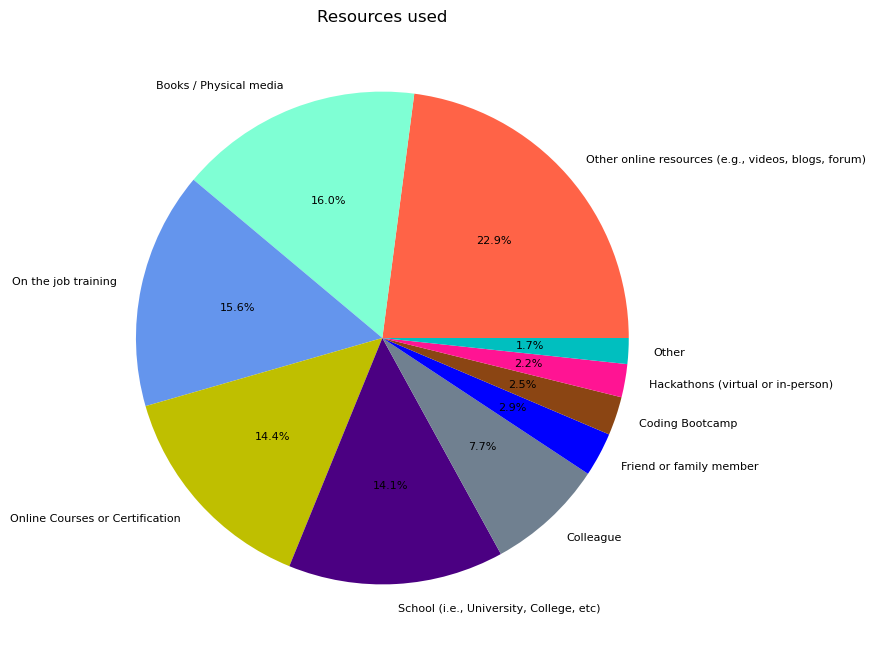

In [47]:
Resources_used=Resources[['ResponseId','LearnCode']]
Resources_used=Resources_used.dropna(subset='LearnCode')
Resources_used=Resources_used.drop_duplicates()
Resources_used=Resources_used.groupby(['LearnCode']).count()[['ResponseId']]
draw_pie(Resources_used,'LearnCode',8,8,'Resources used',colors_Resources)

<b>Inference:</b> No particular resource is a clear favourite among survey takers. A combination of resources are preferred by responders.<br>
1. Most survey takers use <b>Online Resources such as videos, blogs, forums etc as their main resource for continuous learning.</b> 
2. This is followed by <b>books or physical media, job training,online courses or schools.</b>

### Average Resource use across different categories

Variation of average resources used by survey takers with different age, education level, experience, industry, coding activities and years of experience ?

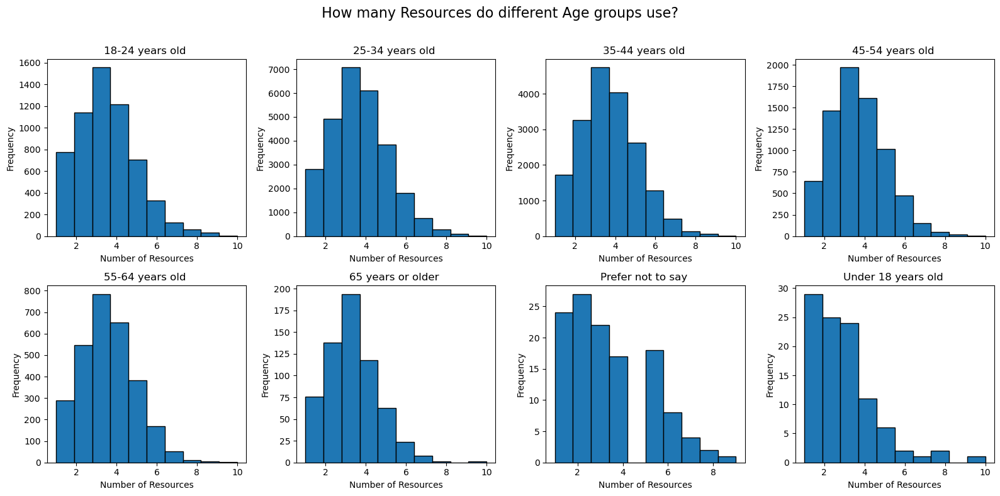

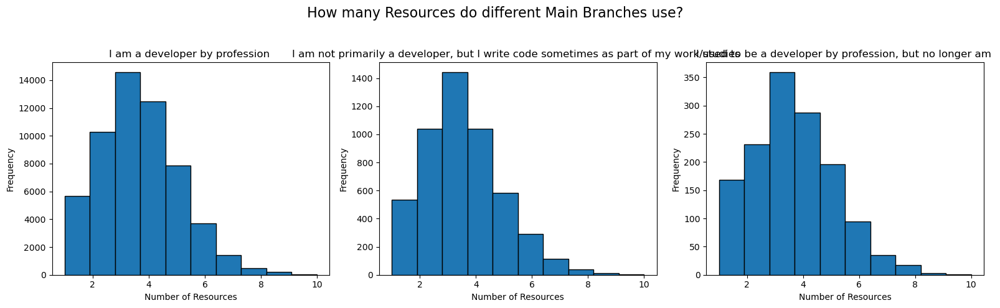

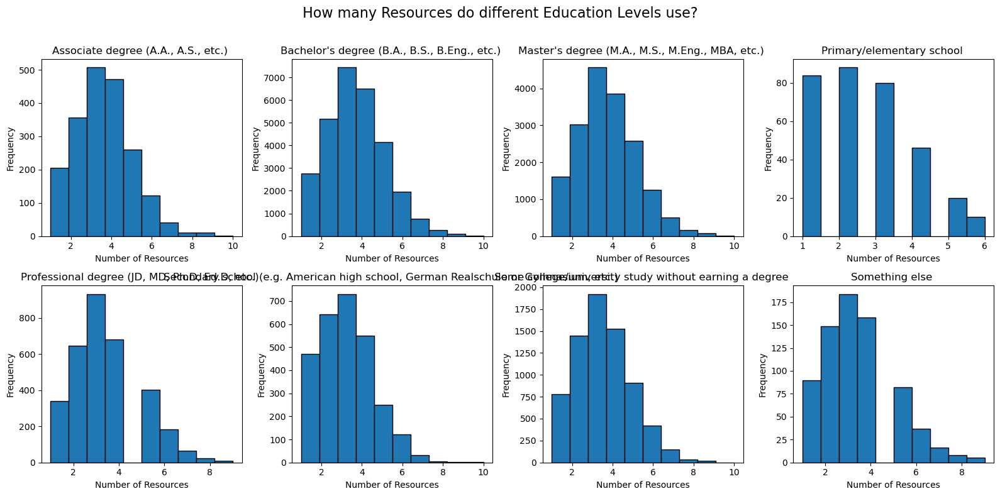

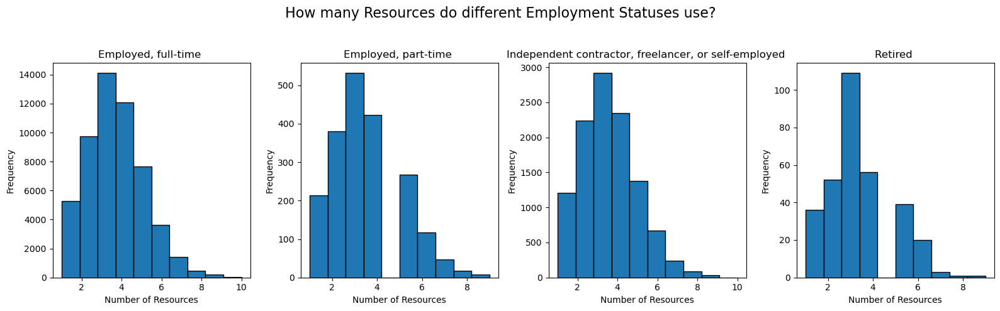

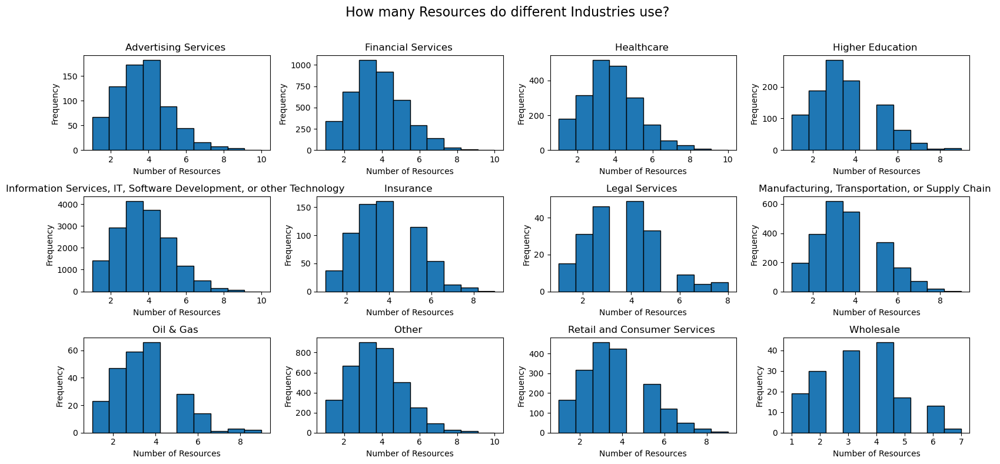

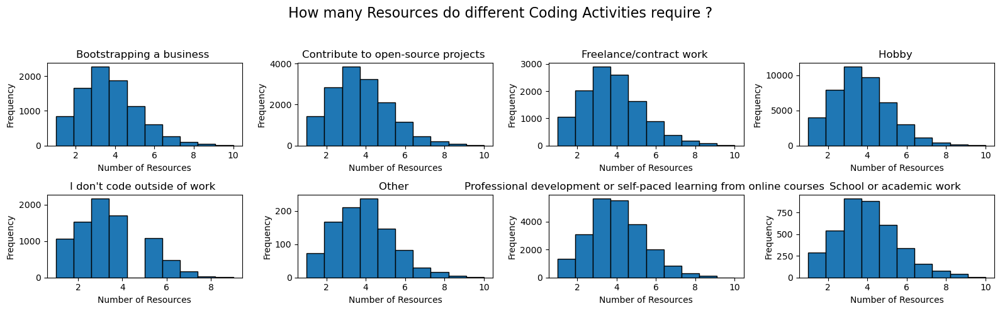

In [48]:
Numb_Resources= survey_df[['ResponseId','MainBranch','Country','Age','EdLevel','Employment','CodingActivities','YearsCode','LearnCode','Industry']]
Numb_Resources=Numb_Resources.dropna(subset=['LearnCode'])
Numb_Resources['LearnCode']=Numb_Resources['LearnCode'].str.split(';')
Numb_Resources['ResourceCount']=Numb_Resources['LearnCode'].str.len()

Numb_Resources_Age=Numb_Resources[['ResponseId','Age','ResourceCount']]
Numb_Resources_Age=Numb_Resources_Age.dropna(subset='Age')
Numb_Resources_Age=Numb_Resources_Age.dropna(subset='ResourceCount')
Numb_Resources_Age=Numb_Resources_Age.drop_duplicates()
plot_grouped_hist_plots(2,4,'Age','ResourceCount',Numb_Resources_Age,16,8,'Number of Resources',' How many Resources do different Age groups use? \n')

Numb_Resources_branch=Numb_Resources[['ResponseId','MainBranch','ResourceCount']]
Numb_Resources_branch=Numb_Resources_branch.dropna(subset='MainBranch')
Numb_Resources_branch=Numb_Resources_branch.dropna(subset='ResourceCount')
Numb_Resources_branch=Numb_Resources_branch.drop_duplicates()
plot_grouped_hist_plots(1,3,'MainBranch','ResourceCount',Numb_Resources_branch,16,5,'Number of Resources',' How many Resources do different Main Branches use? \n')

Numb_Resources_ED=Numb_Resources[['ResponseId','EdLevel','ResourceCount']]
Numb_Resources_ED=Numb_Resources_ED.dropna(subset='EdLevel')
Numb_Resources_ED=Numb_Resources_ED.dropna(subset='ResourceCount')
Numb_Resources_ED=Numb_Resources_ED.drop_duplicates()
plot_grouped_hist_plots(2,4,'EdLevel','ResourceCount',Numb_Resources_ED,16,8,'Number of Resources',' How many Resources do different Education Levels use? \n')

Numb_Resources_emp=Numb_Resources[['ResponseId','Employment','ResourceCount']]
Numb_Resources_emp['Employment']=Numb_Resources_emp['Employment'].str.split(';')
Numb_Resources_emp=Numb_Resources_emp.explode('Employment')
Numb_Resources_emp=Numb_Resources_emp[Numb_Resources_emp['Employment']!='I prefer not to say']
Numb_Resources_emp=Numb_Resources_emp.dropna(subset='Employment')
Numb_Resources_emp=Numb_Resources_emp.dropna(subset='ResourceCount')
Numb_Resources_emp=Numb_Resources_emp.drop_duplicates()
plot_grouped_hist_plots(1,4,'Employment','ResourceCount',Numb_Resources_emp,16,5,'Number of Resources',' How many Resources do different Employment Statuses use? \n')

Numb_Resources_Industry=Numb_Resources[['ResponseId','Industry','ResourceCount']]
Numb_Resources_Industry=Numb_Resources_Industry.dropna(subset='Industry')
Numb_Resources_Industry=Numb_Resources_Industry.dropna(subset='ResourceCount')
Numb_Resources_Industry=Numb_Resources_Industry.drop_duplicates()
plot_grouped_hist_plots(3,4,'Industry','ResourceCount',Numb_Resources_Industry,16,8,'Number of Resources',' How many Resources do different Industries use? \n')

Numb_Resources_Coding=Numb_Resources[['ResponseId','CodingActivities','ResourceCount']]
Numb_Resources_Coding['CodingActivities']=Numb_Resources_Coding['CodingActivities'].str.split(';')
Numb_Resources_Coding=Numb_Resources_Coding.explode('CodingActivities')
Numb_Resources_Coding=Numb_Resources_Coding.dropna(subset='CodingActivities')
Numb_Resources_Coding=Numb_Resources_Coding.dropna(subset='ResourceCount')
Numb_Resources_Coding=Numb_Resources_Coding.drop_duplicates()
plot_grouped_hist_plots(2,4,'CodingActivities','ResourceCount',Numb_Resources_Coding,16,5,'Number of Resources',' How many Resources do different Coding Activities require ? \n')


<b>Inference:</b><br>
1. Most survey takers on average use <b>at least 3 different resources for their development.</b>
2. Most age groups <b>use more than 3 resources except under 18's</b>, who rely on under 3 resources for their continuous learning.
3. As seen in the age group comparison, under 18's rely on under 3 resources. This is reflected in the education levels as well where most degrees have an average of 3 or more, Primary/Elementary school students rely on under 3 resources.
4. <b>Main Branch, Employment Level, industry, coding activities have no significant impact</b> on the number of resources, most survey takers use at least 3 resources.

### Comparison of Resources with Main Branch, Education Level,Coding Activity,and Years of experience

How does the Resource used vary with MainBranch, Education level, Employment Status and Years of coding experience?

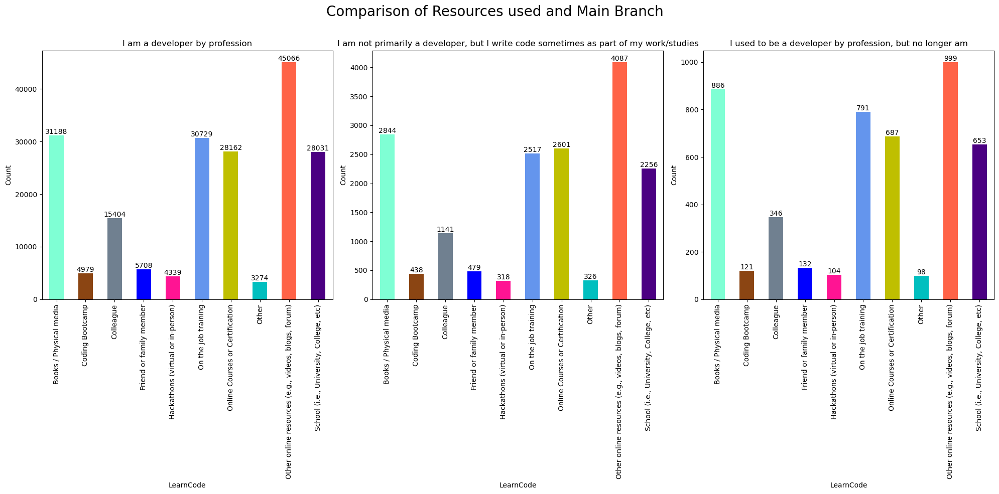

In [49]:
#Variation with Main Branch
Branch_learning=Resources[['ResponseId','LearnCode','MainBranch']]
Branch_learning=Branch_learning.dropna(subset='LearnCode')
Branch_learning=Branch_learning.dropna(subset='MainBranch')
Branch_learning=Branch_learning.drop_duplicates()
df=Branch_learning.groupby(['LearnCode', 'MainBranch']).size().unstack()
#plotting_multiple(1,3,Branch_learning,MainBranch,16,20,'LearnCode','Count',' Comparison of Resources used and Main Branch \n')
plot_grouped_bar_plots(1,3,'LearnCode','MainBranch',df,20,10,'LearnCode','Count','Comparison of Resources used and Main Branch  \n',colors_Resources)

<b>Inference:</b><br>
1. Regardless of the main branch, <b>Online resources such as videos, blogs etc are a popular resource choice.</b>
2. The highest percentage of people who use <b>books and other physical media are past developers.</b>
3. <b>Developers and past developers</b> are more likely to also learn <b>on the job training.</b>
4. People who are <b>not primarily developers</b>, are more likely to <b>use online certification courses</b> as a resource choice. 


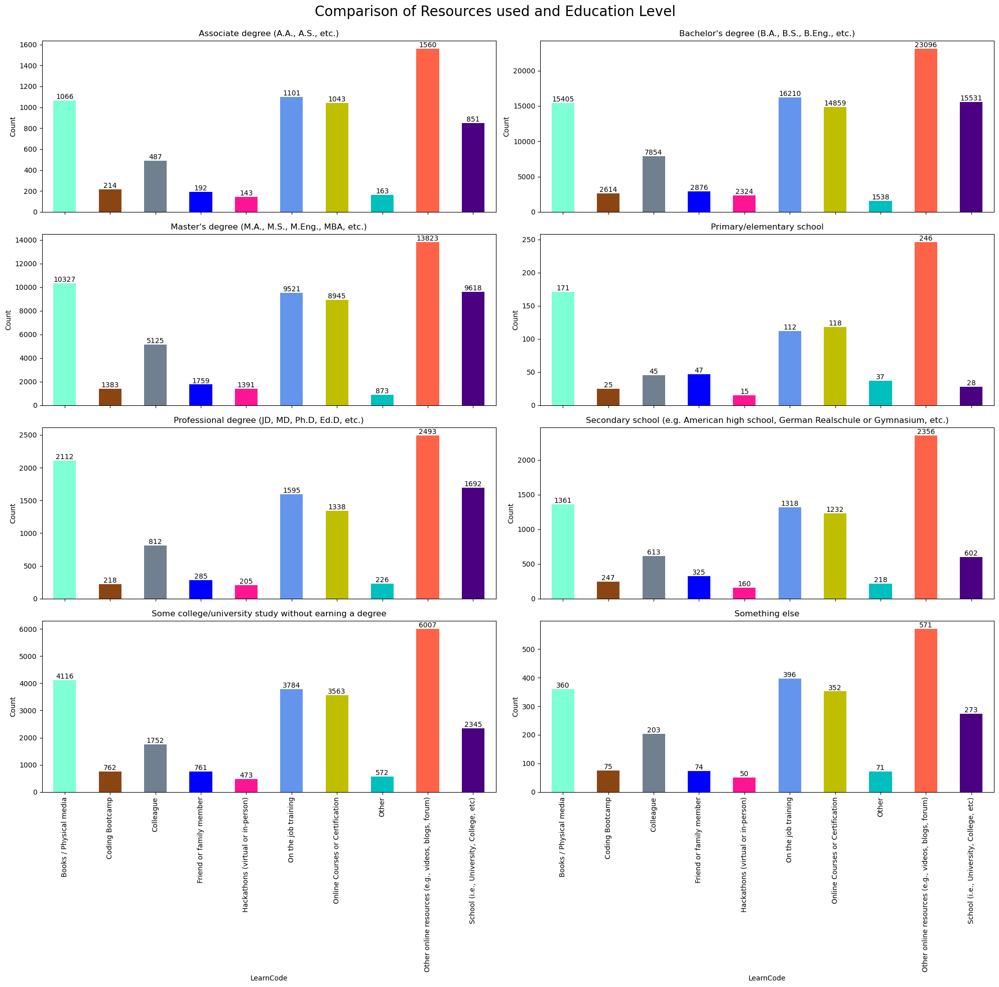

In [50]:
#Variation with education level
ED_learning=Resources[['ResponseId','LearnCode','EdLevel']]
ED_learning=ED_learning.dropna(subset='LearnCode')
ED_learning=ED_learning.dropna(subset='EdLevel')
ED_learning=ED_learning.drop_duplicates()

df=ED_learning.groupby(['LearnCode', 'EdLevel']).size().unstack()

#plotting_multiple(2,4,ED_learning,EdLevel,25,21,'LearnCode','Count','Comparison of Resources used and Education Level \n')
plot_grouped_bar_plots(4,2,'LearnCode','EdLevel',df,20,20,'LearnCode','Count','Comparison of Resources used and Education Level  \n',colors_Resources)

<b>Inference:</b>
1. <b>Primary/elementary and high school students</b> are <b>less likely</b> to <b>rely on their schools</b> as a source of resource to learn coding. They are<b> more likely to rely on family or friends.</b>
2. People with a <b>formal degree - Bachelor's , master's, associates or professional degrees</b> - rely on <b>online videos, job training, online courses or books</b> for continuous learning. 

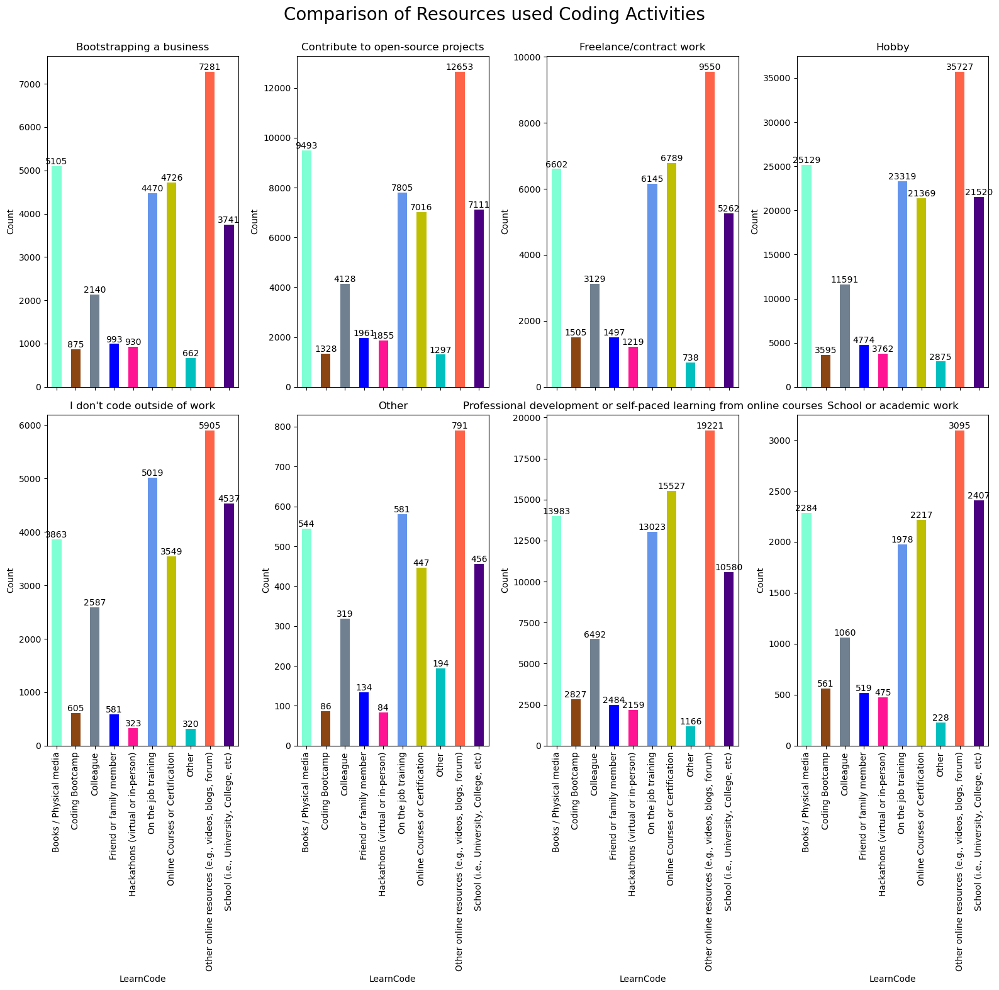

In [51]:
#Do people who partake in particular coding activities rely on certain resources ?
Emp_learning=Resources[['ResponseId','LearnCode','CodingActivities']]
Emp_learning=Emp_learning.dropna(subset='LearnCode')
Emp_learning=Emp_learning.dropna(subset='CodingActivities')
Emp_learning=Emp_learning.drop_duplicates()

df=Emp_learning.groupby(['LearnCode', 'CodingActivities']).size().unstack()

plot_grouped_bar_plots(2,4,'LearnCode','CodingActivities',df,16,16,'LearnCode','Count','Comparison of Resources used Coding Activities  \n',colors_Resources)

<b>Inference:</b>
1. <b>Online resources such as videos, blogs, online forums remain a popular choice regardless of the coding activity.</b>
2. People who <b>don't code outside of work</b> are more likely to <b>rely on job training, and colleague</b> than any other activities for their professional development.
3. People who perform coding activities for <b>academic work,open source projects, freelance or bootstrapping a business</b> are more likely to rely on <b>online courses</b> as a resource compared to other coding activities.
4. <b>Coding bootcamps</b> are a more common resource choice among those who perform <b>coding for academic work or freelance work.</b>


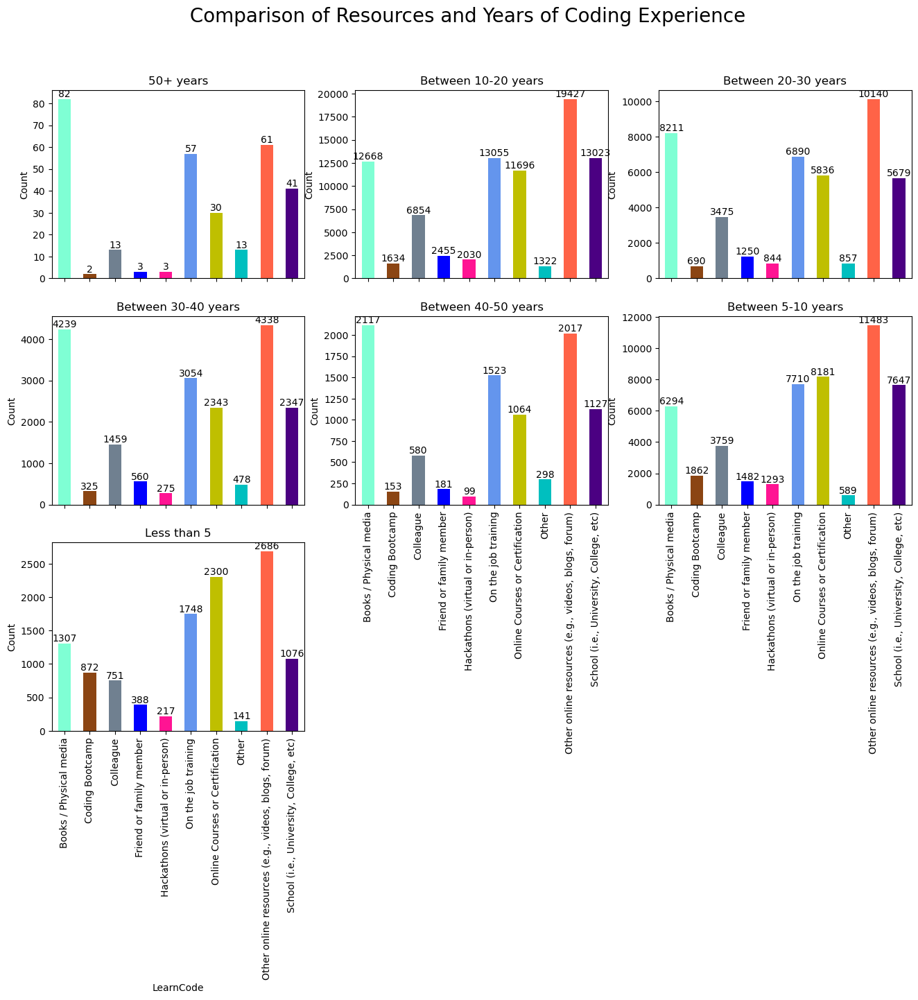

In [52]:
#Variation with experience
Exp_learning=Resources[['ResponseId','LearnCode','YearsCode']]
Exp_learning=Exp_learning.dropna(subset='LearnCode')
Exp_learning=Exp_learning.dropna(subset='YearsCode')
Exp_learning=Exp_learning.drop_duplicates()
Exp_learning
Exp_learning['YearsCode_Range']=Exp_learning['YearsCode'].apply(YearCode_range)

df=Exp_learning.groupby(['LearnCode', 'YearsCode_Range']).size().unstack()
num_cols=3
fig,axes=plt.subplots(3,3,figsize=(16,12),sharex=True,sharey=False)
for i, (YearsCode_Range, data) in enumerate(df.items()):
    colors_x=colors_Resources
    row = i // num_cols
    col = i % num_cols
    colors_x=df.merge(colors_Resources, on='LearnCode')['Color']
    data.plot.bar(ax=axes[row][col], color=colors_x)
    axes[row][col].set_title(YearsCode_Range)
    axes[row][col].set_xlabel('LearnCode')
    axes[row][col].set_ylabel('Count')
    axes[row][col].tick_params(axis='x')
        # Add annotations to the bars
    for bar in axes[row][col].patches:
        axes[row][col].annotate(str(bar.get_height()),(bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                            ha='center', va='center', xytext=(0, 5),textcoords='offset points')
axes[1][1].xaxis.set_tick_params(which='both', labelbottom=True, labeltop=False,rotation=90)
axes[1][2].xaxis.set_tick_params(which='both', labelbottom=True, labeltop=False,rotation=90)
axes[2][0].tick_params(axis='x',rotation=90)



fig.suptitle(' Comparison of Resources and Years of Coding Experience \n', fontsize=20)

fig.delaxes(axes[2][1])
fig.delaxes(axes[2][2])
plt.tight_layout()
plt.show()

<b>Inference:</b><br>
1. People with<b> more experience (experience of more than 30 years), ie, older age groups</b>, prefer <b>books or other physical media</b> as a resource for professional development. It is also noticed that even among these groups, <b>preference for books increases with age.</b> This trend is also seen in preference for on the job training.
2. <b>Coding bootcamps</b> are a more popular option among survey takers <b>early in their careers (experience somewhere between 0-10 years).</b>
3. <b>Younger generation</b> prefer <b>online videos</b> for continuous learning. 
4. <b>Online courses or certification preference goes down with age/number of years of experience.</b>


# Programming language and Technology

This section provides an analysis of the different programming technology preferred across different demographics. 

In [53]:
programming_df=survey_df.copy()
programming_df=programming_df[['ResponseId','MainBranch','Country','Age','EdLevel','Employment','CodingActivities','YearsCode','DevType','Industry','LanguageHaveWorkedWith','DatabaseHaveWorkedWith']]
programming_df['Employment']=programming_df['Employment'].str.split(';')
programming_df['CodingActivities']=programming_df['CodingActivities'].str.split(';')
programming_df['Num_CodingActivities']=programming_df['CodingActivities'].str.len()
programming_df['LanguageHaveWorkedWith']=programming_df['LanguageHaveWorkedWith'].str.split(';')
programming_df['Num_LanguageHaveWorkedWith']=programming_df['LanguageHaveWorkedWith'].str.len()
programming_df['DatabaseHaveWorkedWith']=programming_df['DatabaseHaveWorkedWith'].str.split(';')
programming_df['Num_DatabaseHaveWorkedWith']=programming_df['DatabaseHaveWorkedWith'].str.len()
programming_df['YearsCode_Range']=programming_df['YearsCode'].apply(YearCode_range)
programming_df=programming_df.explode('Employment')
programming_df=programming_df.explode('CodingActivities')
programming_df=programming_df.explode('LanguageHaveWorkedWith')
programming_df=programming_df.explode('DatabaseHaveWorkedWith')

## Programming Language Comparison

In this section, the preference of programming language with main branch, industry and developer type is analysed.

### Programming Language Distribution

Below is a word cloud with all the potential programming language options.

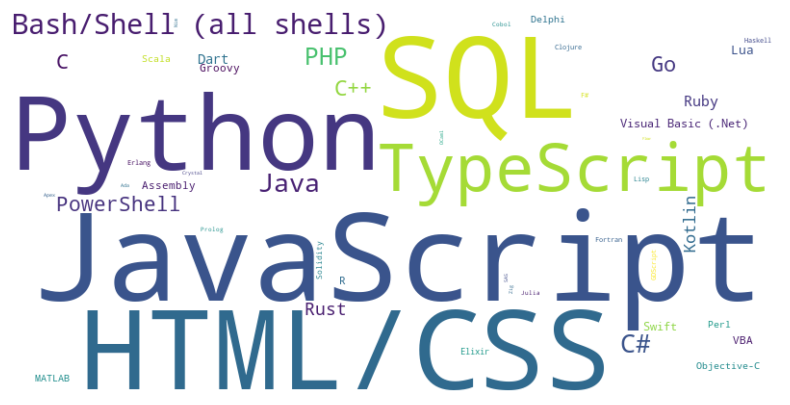

In [54]:
Languages_df=programming_df[['ResponseId','LanguageHaveWorkedWith']]
Languages_df.drop_duplicates()
Languages_df=Languages_df.groupby('LanguageHaveWorkedWith').count()[['ResponseId']]
Languages_df['Perc_Language']=(Languages_df['ResponseId']/Languages_df['ResponseId'].sum())*100
#There are 51 unique programming languages selected by the survey takers. Because a pie chart would not make sense for such data a word cloud is generated
Languages_df=Languages_df.reset_index()
Languages_df
word_freq = dict(zip(Languages_df['LanguageHaveWorkedWith'], Languages_df['ResponseId']))
# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


LanguageHaveWorkedWith
JavaScript                 11.202633
SQL                         9.628019
HTML/CSS                    9.175934
Python                      7.936267
TypeScript                  7.596819
Bash/Shell (all shells)     6.088770
Java                        5.344882
C#                          4.872780
PHP                         4.452166
Go                          3.248398
C++                         3.223404
C                           2.933065
PowerShell                  2.892007
Rust                        2.156316
Kotlin                      1.878602
Ruby                        1.532823
Dart                        1.341618
Lua                         1.143277
Visual Basic (.Net)         1.005061
Swift                       0.995693
Groovy                      0.876213
VBA                         0.872809
Assembly                    0.847047
R                           0.806098
Perl                        0.703158
Scala                       0.697706
Delphi         

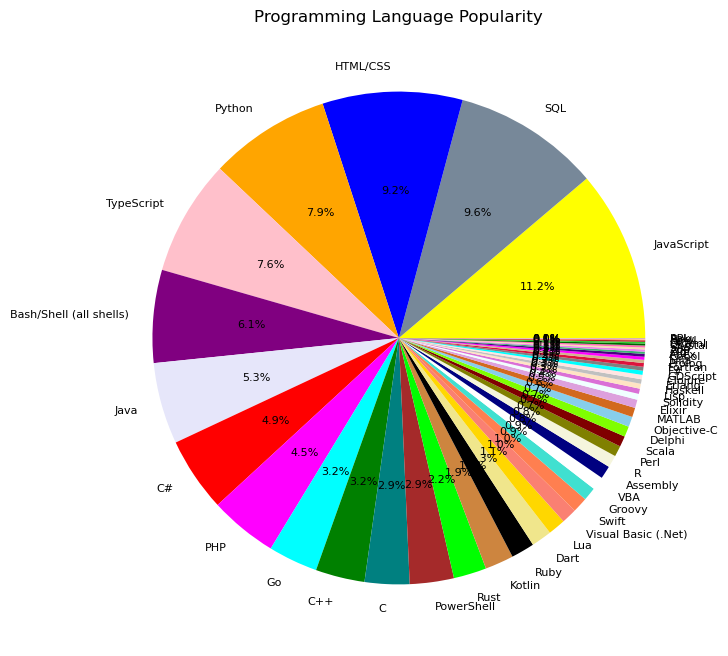

In [55]:
Languages_group=programming_df[['ResponseId','LanguageHaveWorkedWith']].groupby('LanguageHaveWorkedWith').count()[['ResponseId']]
Languages_group=Languages_group.sort_values('ResponseId',ascending=False)
draw_pie(Languages_group,'LanguageHaveWorkedWith',8,8,'Programming Language Popularity',All_Lang_colors)

Programming languages developers preferred are plotted above. There is no particular language that dominates. <b>JavaScript, SQL, HTML/CSS, Python and TypeScript </b> are the top 5 most popular programming languages. 

In [56]:
top_ten=Languages_group.sort_values('Perc',ascending=False).head(10)
top_ten=top_ten.reset_index()
top_ten[top_ten.Perc.cumsum()<=50][['LanguageHaveWorkedWith','Perc']]

,LanguageHaveWorkedWith,Perc
0,JavaScript,11.202633
1,SQL,9.628019
2,HTML/CSS,9.175934
3,Python,7.936267
4,TypeScript,7.596819


<b>5 </b>programming languages make up <b>50% </b>of the selection by survey takers.

### Programming Language Variation with Main Branch

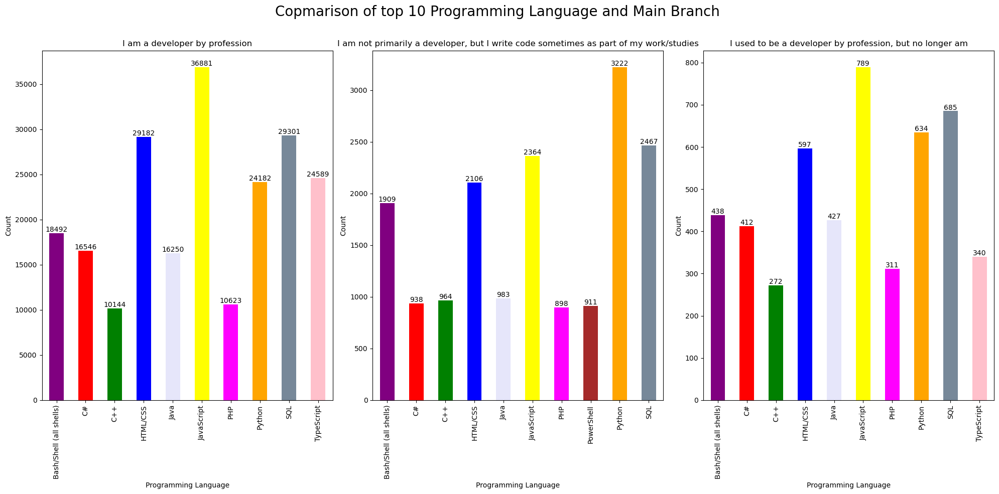

In [57]:
#Correlation between main branch and Language
Language_Branch=programming_df[['ResponseId','LanguageHaveWorkedWith','MainBranch']]
Language_Branch=Language_Branch.dropna(subset='LanguageHaveWorkedWith')
Language_Branch=Language_Branch.dropna(subset='MainBranch')
Language_Branch=Language_Branch.drop_duplicates()

df=Language_Branch.groupby(['LanguageHaveWorkedWith', 'MainBranch']).size().unstack()
plot_grouped_bar_plots(1,3,'LanguageHaveWorkedWith', 'MainBranch',df,20,10,'Programming Language','Count','Copmarison of top 10 Programming Language and Main Branch \n',All_Lang_colors,1)
        

<b>Inference:</b>
1. <b>TypeScript</b> is <b>not a popular programming option</b> for those who are not primarily developers but <b>write code as part of studies or work</b>. <b>Python and SQL are the most popular programming languages in this group. </b>
2. Among <b>current and past developers, JavaScript</b> is the most popular programming language, followed by <b>SQL</b>.<b>C#</b> is also most preferred by current and past developers.  
3. The highest percentage of survey takers who use <b>HTML/CSS</b> programming language are <b>current developers.</b>
4. The highest percentage of people who use <b>Bash/Shell</b> are those who <b>write code as part of studies/work.</b>
5. <b>PHP</b> is most popular among <b>past developers.</b> 

### Programming Language Variation with Industry

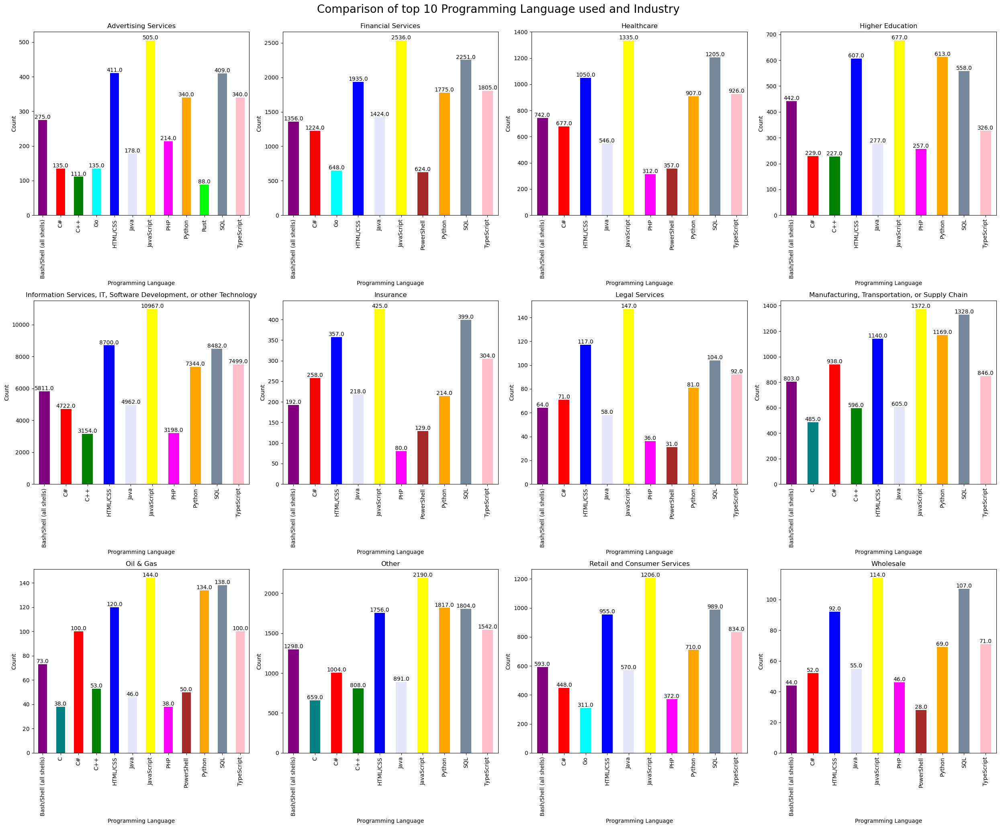

In [58]:
#Correlation between Programming Language and Industry
Language_Industry=programming_df[['ResponseId','LanguageHaveWorkedWith','Industry']]
Language_Industry=Language_Industry.dropna(subset='LanguageHaveWorkedWith')
Language_Industry=Language_Industry.dropna(subset='Industry')
Language_Industry=Language_Industry.drop_duplicates()

df=Language_Industry.groupby(['LanguageHaveWorkedWith', 'Industry']).size().unstack()

plot_grouped_bar_plots(3,4,'LanguageHaveWorkedWith', 'Industry',df,25,21,'Programming Language','Count','Comparison of top 10 Programming Language used and Industry \n',All_Lang_colors,1)

<b>Inference:</b>
1. <b>JavaScript remains the most popular programming language among different industries</b>. IT sector and Legal services have the highest percentage of JavaScript users.
2. <b>Go programming language </b>is only preferred by Advertising, Retail and Consumer and Financial Services. 
3. <b>Oil and Gas, Advertising industry</b> uses a variety of programming languages. 
4. <b>PowerShell</b> is popular in Financial, Healthcare, Insurance, Legal services, Oil & Gas and Wholesale. 
5. Highest percentage of users who use <b>HTML/CSS are from the higher education industry.</b> 
6. <b>Python</b> is a popular choice among the Oil & Gas industry and Higher education.
7. <b>Rust programming language</b> is only popular among the Advertising Industry.

Histogram of number of languages used in different Industries:

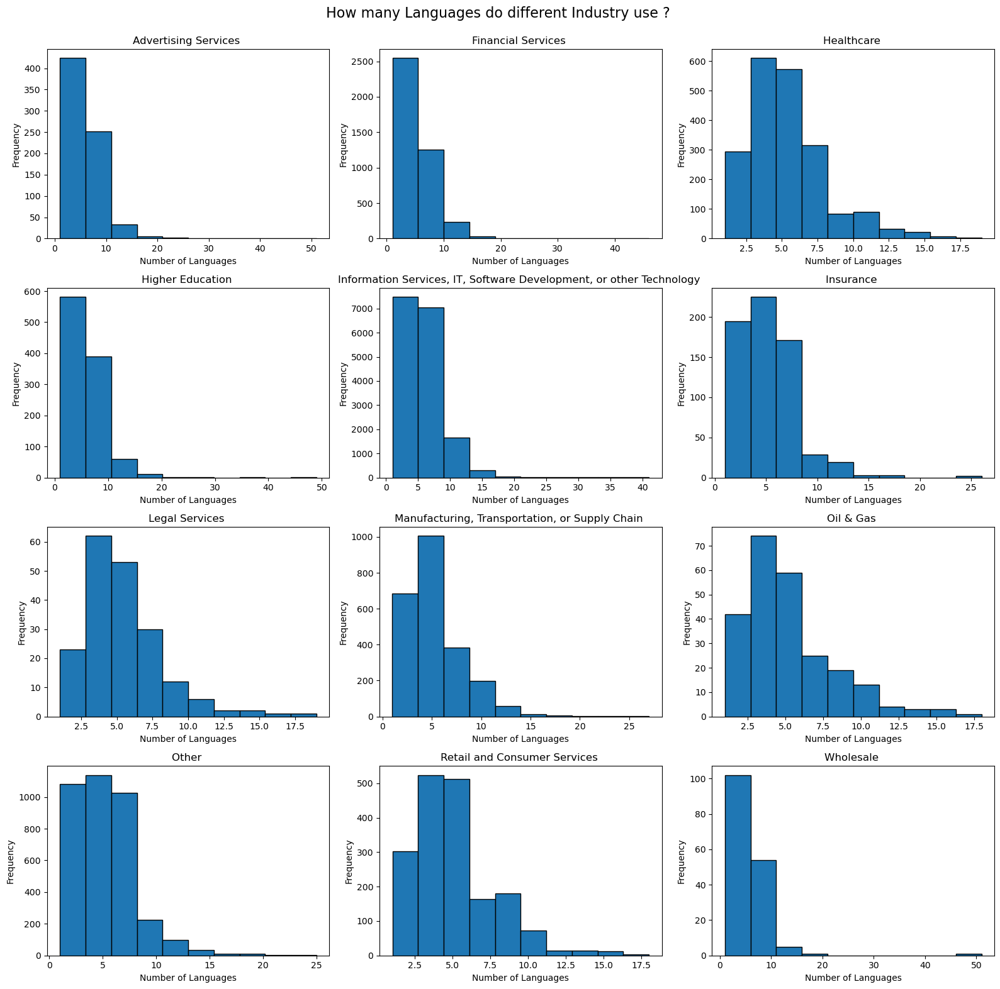

In [59]:
Numb_Lang_Industry=programming_df[['ResponseId','Industry','Num_LanguageHaveWorkedWith']]
Numb_Lang_Industry=Numb_Lang_Industry.dropna(subset='Industry')
Numb_Lang_Industry=Numb_Lang_Industry.dropna(subset='Num_LanguageHaveWorkedWith')
Numb_Lang_Industry=Numb_Lang_Industry.drop_duplicates()
plot_grouped_hist_plots(4,3,'Industry','Num_LanguageHaveWorkedWith',Numb_Lang_Industry,16,16,'Number of Languages',' How many Languages do different Industry use ?  \n')

<b>Inference:</b>
 1. Most survey takers,regardless of the industry, use <b>fewer programming languages. </b>
 2. Most survey takers from any industry use an average of <b>5</b> programming languages.
 3. Survey takers from the <b>IT sector</b> on average use <b>5-10 programming languages.</b>

### Programming Language Variation with Developer Type

Developer type indicates the fundamental developer role  the survey taker most identifies with. 

DevType
Developer, full-stack                            35.005340
Developer, back-end                              19.241620
Developer, front-end                              6.450533
Developer, desktop or enterprise applications     5.432028
Developer, mobile                                 3.489058
Other                                             3.336043
Engineering manager                               3.061891
Developer, embedded applications or devices       2.527933
Data scientist or machine learning specialist     2.025853
Senior Executive (C-Suite, VP, etc.)              1.958909
DevOps specialist                                 1.906310
Research & Development role                       1.840960
Engineer, data                                    1.716636
Cloud infrastructure engineer                     1.467986
Academic researcher                               1.370758
Developer, game or graphics                       1.058353
Data or business analyst                        

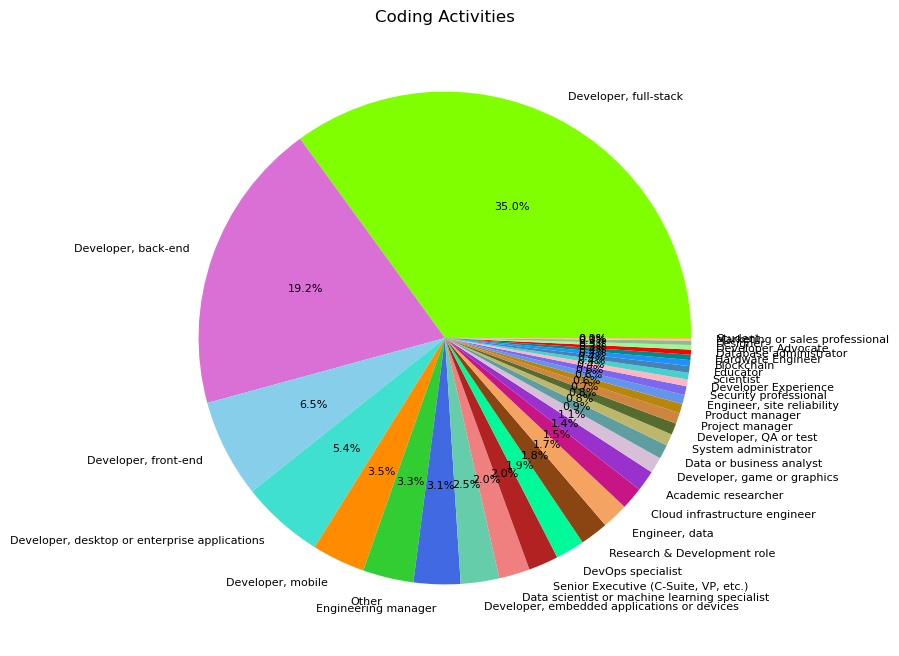

In [60]:
#Developers pie chart
Dev_group=survey_df[['ResponseId','DevType']]
Dev_group=Dev_group.dropna(subset='DevType')
Dev_group=Dev_group.groupby(['DevType']).count()[['ResponseId']]
Dev_group=Dev_group.sort_values('ResponseId',ascending=False)
draw_pie(Dev_group,'DevType',8,8,'Coding Activities',colors_Dev)

<b>35%</b> of the survey takers are <b>Developers, Full-Stack</b>, followed by <b>About 20% Developer, back-end</b>  - implying more than 50%  of the survey takers are Developers - full stack or backend.

For brevity variation with only the top 10 most popular choices (other than the option 'Other') is performed below:
1. Developer, full-stack                    
2. Developer, back-end                              
3. Developer, front-end                            
4. Developer, desktop or enterprise applications    
5. Developer, mobile                                
6. Engineering manager                              
7. Developer, embedded applications or devices     
8. Data scientist or machine learning specialist  
9. Senior Executive (C-Suite, VP, etc.)            
10. DevOps specialist                              

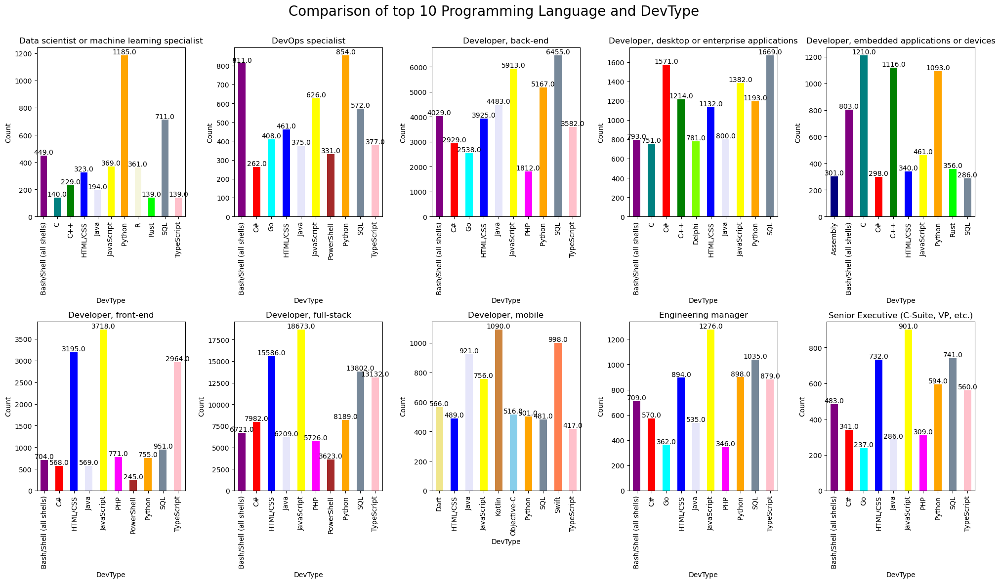

In [61]:
Language_Dev=programming_df[['ResponseId','LanguageHaveWorkedWith','DevType']]
Language_Dev=Language_Dev.dropna(subset='LanguageHaveWorkedWith')
Language_Dev=Language_Dev.dropna(subset='DevType')
Language_Dev=Language_Dev.drop_duplicates()
filtered_list=['Developer, full-stack','Developer, back-end','Developer, front-end','Developer, desktop or enterprise applications',
'Developer, mobile','Engineering manager', 'Developer, embedded applications or devices', 'Data scientist or machine learning specialist', 'Senior Executive (C-Suite, VP, etc.)','DevOps specialist']

Language_Dev['DevCheck']=Language_Dev['DevType'].isin(filtered_list)
Language_Dev=Language_Dev[Language_Dev['DevCheck']==True]

df=Language_Dev.groupby(['LanguageHaveWorkedWith', 'DevType']).size().unstack()

plot_grouped_bar_plots(2,5,'LanguageHaveWorkedWith', 'DevType',df,20,12,'DevType','Count',' Comparison of top 10 Programming Language and DevType\n',All_Lang_colors,1)

<b>Inference:</b>
1. <b>Python</b> is the most popular choice among <b>Data Scientist, DevOps Specialist.</b> 
2. <b>Full stack, frontend Developers, Engineering manager and Senior Executives</b> prefer <b>JavaScript.</b>
3. <b>Mobile Developers are the only developers</b> in the top 10 that <b>use Kotlin, Dart,Swift and Objective-C. Most of them prefer Kotlin over other languages.</b>
4. <b>SQL</b> is a popular programming language among <b>Developers - Desktop applications and back-end.</b> 
5. <b>Front end developers</b> are more likely to use <b>TypeScript</b> than any other group in the top 10.
6. <b>Most unique programming languages are used by Developers, mobile.</b>
7. <b> Embedded application developers prefer C and C++. </b>
8. <b>Backend developers</b> are most likely to use <b>Java</b> programming language. 

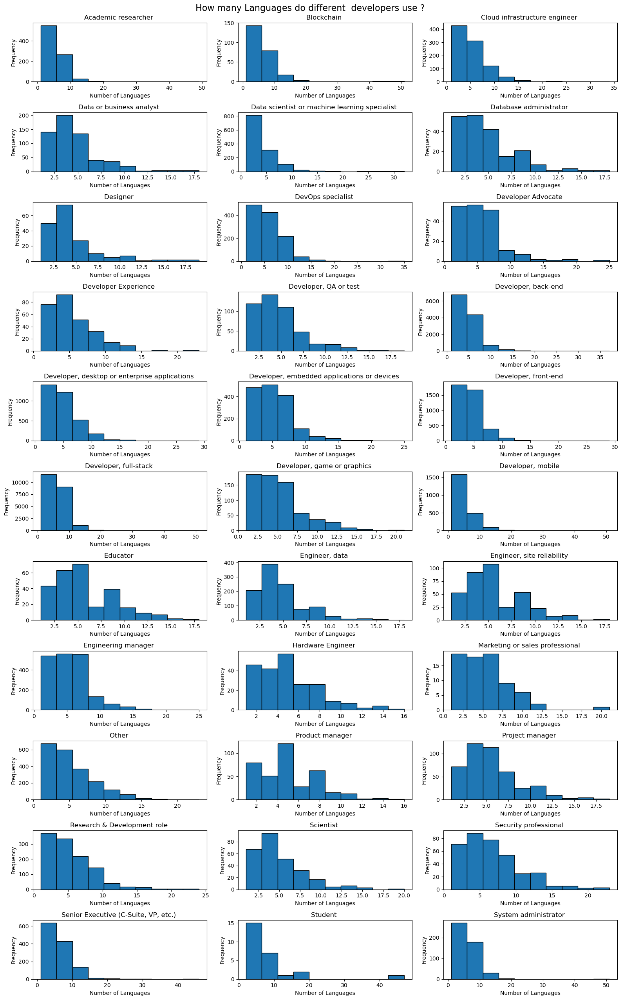

In [62]:
Numb_Lang_Dev=programming_df[['ResponseId','DevType','Num_LanguageHaveWorkedWith']]
Numb_Lang_Dev=Numb_Lang_Dev.dropna(subset='DevType')
Numb_Lang_Dev=Numb_Lang_Dev.dropna(subset='Num_LanguageHaveWorkedWith')
Numb_Lang_Dev=Numb_Lang_Dev.drop_duplicates()
plot_grouped_hist_plots(11,3,'DevType','Num_LanguageHaveWorkedWith',Numb_Lang_Dev,16,26,'Number of Languages',' How many Languages do different  developers use ?  \n')

<b>Inference:</b>
 1. Most developers use <b>fewer languages</b> - an average of <b>5 programming languages.</b> 
 2. <b>Project Manager, Marketing professional, hardware engineer, educator, site reliability engineer</b> are few developer types that have <b>high variation in the number of languages preferred.</b>

## Database Comparison

In this section, the preference of database with education level, years of experience, industry and developer type is analysed.

### Database Distribution

Below is a word cloud with all the potential database options.

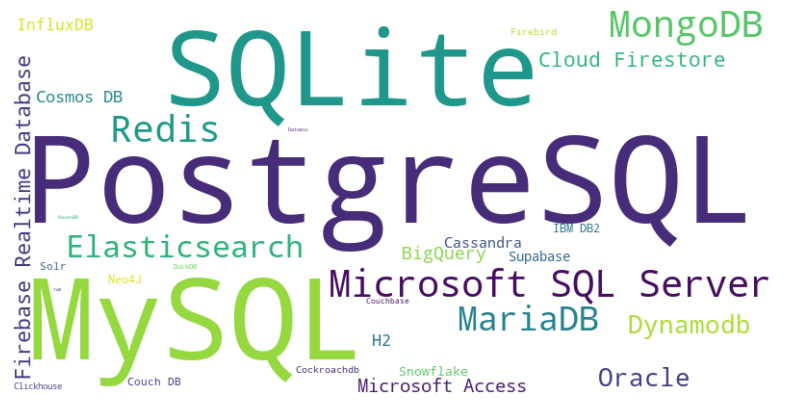

In [63]:
Database_df=programming_df[['ResponseId','DatabaseHaveWorkedWith']]
Database_df.drop_duplicates()
Database_df=Database_df.groupby('DatabaseHaveWorkedWith').count()[['ResponseId']]
Database_df['Perc_Database']=(Database_df['ResponseId']/Database_df['ResponseId'].sum())*100
#There are 51 unique programming languages selected by the survey takers. Because a pie chart would not make sense for such data a word cloud is generated
Database_df=Database_df.reset_index()
Database_df
word_freq = dict(zip(Database_df['DatabaseHaveWorkedWith'], Database_df['ResponseId']))
# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

DatabaseHaveWorkedWith
PostgreSQL                    14.464305
MySQL                         12.490508
SQLite                        10.464157
Microsoft SQL Server           8.207899
MongoDB                        7.963445
Redis                          7.812013
MariaDB                        6.566617
Elasticsearch                  5.448596
Oracle                         3.257834
Dynamodb                       3.241684
Firebase Realtime Database     2.296615
Cloud Firestore                2.130935
Microsoft Access               1.782568
BigQuery                       1.637999
Cosmos DB                      1.373441
H2                             1.358596
InfluxDB                       1.182175
Cassandra                      1.095307
Supabase                       0.938802
Snowflake                      0.854918
Neo4J                          0.789086
IBM DB2                        0.785916
Solr                           0.694124
Couch DB                       0.636498
Firebird         

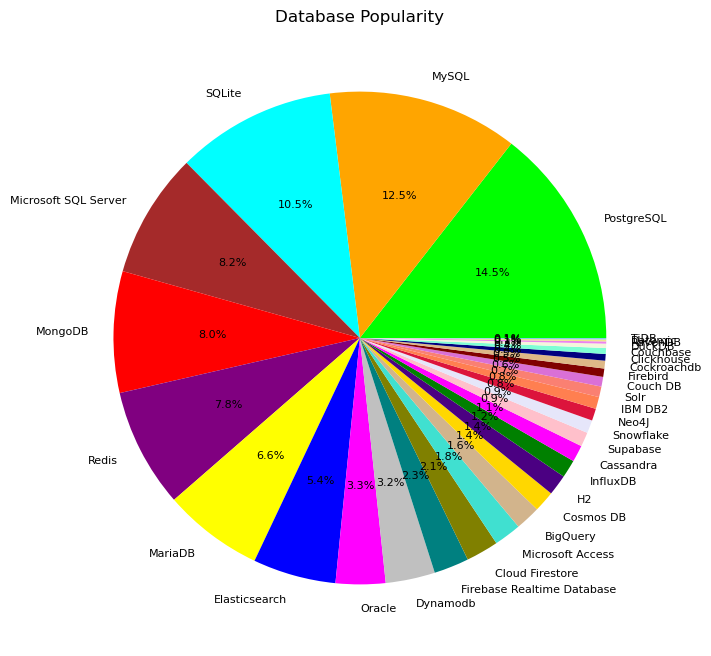

In [64]:
Database_group=programming_df[['ResponseId','DatabaseHaveWorkedWith']].groupby('DatabaseHaveWorkedWith').count()[['ResponseId']]
Database_group=Database_group.sort_values('ResponseId',ascending=False)
draw_pie(Database_group,'DatabaseHaveWorkedWith',8,8,'Database Popularity',All_Database_colors)

<b>PostgreSQL, MySQL, SQLite, Microsoft SQL Server, MongoDB</b>  are the 5 most common database options among survey takers.

In [65]:
top_ten=Database_group.sort_values('Perc',ascending=False).head(10)
top_ten=top_ten.reset_index()
top_ten[top_ten.Perc.cumsum()<=50][['DatabaseHaveWorkedWith','Perc']]
top_ten[top_ten.Perc.cumsum()<=50][['DatabaseHaveWorkedWith','Perc']]

,DatabaseHaveWorkedWith,Perc
0,PostgreSQL,14.464305
1,MySQL,12.490508
2,SQLite,10.464157
3,Microsoft SQL Server,8.207899


<b>4</b> database options - <b>PostgreSQL, MySQL,SQLite, Microsoft SQL Server</b> - make up 50% of the survey takers database options.

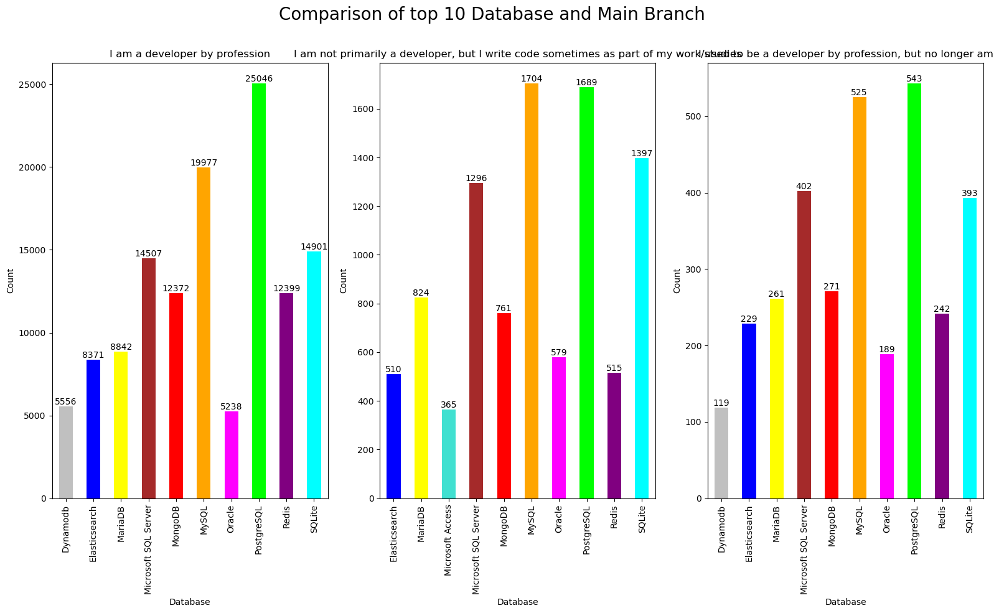

In [66]:
#Correlation between main branch and Language,database
Database_Branch=programming_df[['ResponseId','DatabaseHaveWorkedWith','MainBranch']]
Database_Branch=Database_Branch.dropna(subset='DatabaseHaveWorkedWith')
Database_Branch=Database_Branch.dropna(subset='MainBranch')
Database_Branch=Database_Branch.drop_duplicates()
df=Database_Branch.groupby(['DatabaseHaveWorkedWith', 'MainBranch']).size().unstack()
plot_grouped_bar_plots(1,3,'DatabaseHaveWorkedWith', 'MainBranch',df,16,10,'Database','Count', 'Comparison of top 10 Database and Main Branch \n',All_Database_colors,1)
        

<b>Inference:</b>
1. <b>PostgreSQL</b> is most preferred by <b>current and past developers. </b>
2. <b>MySQL</b> is preferred by <b>those who write code sometimes and also by past developers after PostgreSQL. </b>
3. Users of <b>SQLite</b> are most like <b>those that code as part of studies or work.</b> 
4. <b>Current and Past developers use Dynamodb database.</b> 

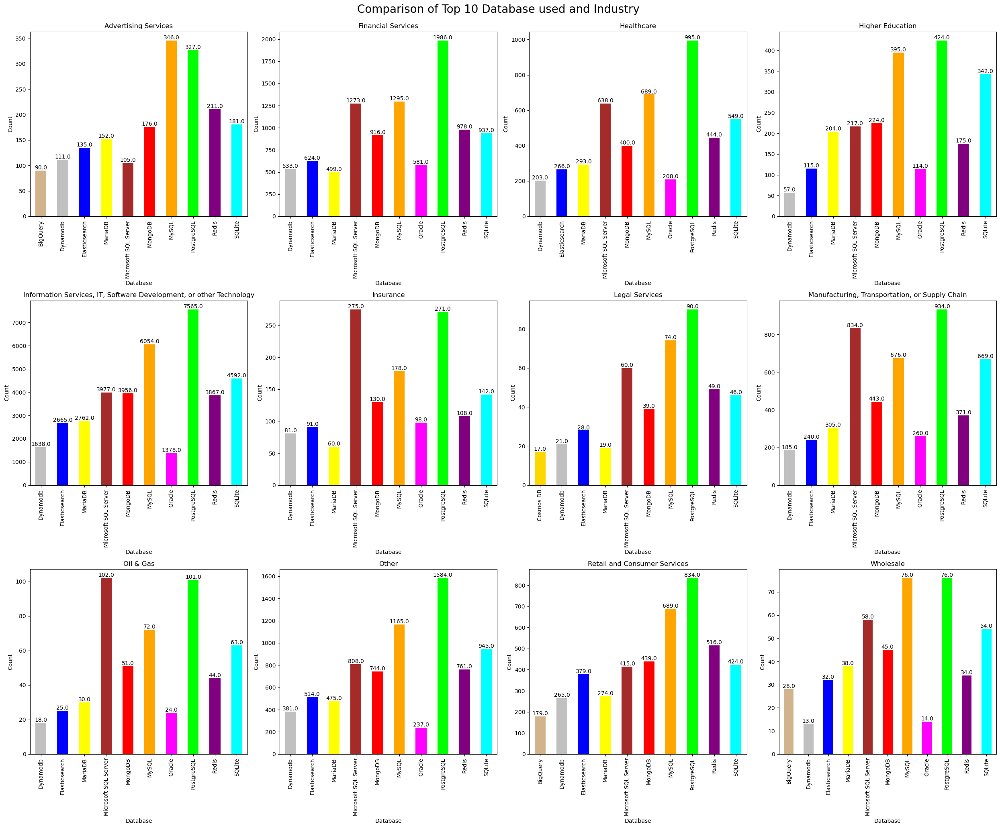

In [67]:
#Correlation between Industry and database
Database_Industry=programming_df[['ResponseId','DatabaseHaveWorkedWith','Industry']]
Database_Industry=Database_Industry.dropna(subset='DatabaseHaveWorkedWith')
Database_Industry=Database_Industry.dropna(subset='Industry')
Database_Industry=Database_Industry.drop_duplicates()
df=Database_Industry.groupby(['DatabaseHaveWorkedWith', 'Industry']).size().unstack()
plot_grouped_bar_plots(3,4,'DatabaseHaveWorkedWith', 'Industry',df,25,21,'Database','Count','Comparison of Top 10 Database used and Industry \n',All_Database_colors,1)

<b>Inference:</b>
1. <b>PostgreSQL is preferred amongst most industries except Advertising, Insurance, Oil & Gas.</b> 
2. <b>Wholesale</b> industry survey takers prefer <b>both PostgreSQL and MySQL.</b> 
3. <b>Advertising</b> industry <b>prefer MySQL over PostgreSQL.</b>
4. <b>Microsoft SQL Server is a popular option in the Oil & gas and Insurance industry. </b>
5. <b>Only Advertising and Whole sale industries use BigQuery.</b> 
6. <b>Only legal services industry use Cosmos DB. </b>

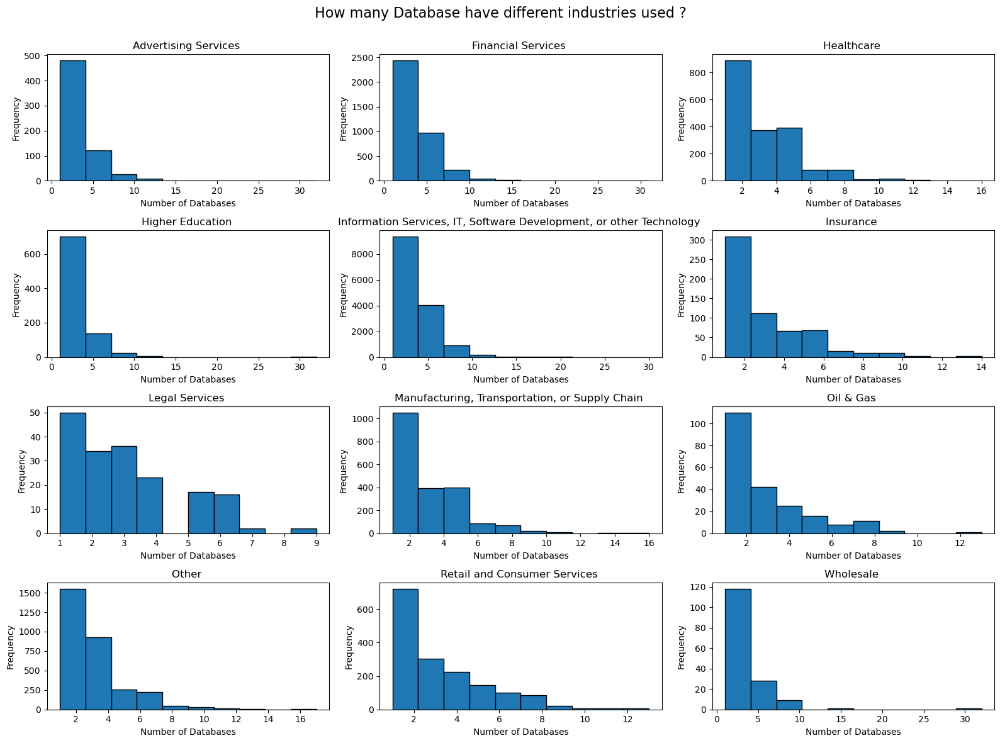

In [68]:
Numb_DB_Industry=programming_df[['ResponseId','Industry','Num_DatabaseHaveWorkedWith']]
Numb_DB_Industry=Numb_DB_Industry.dropna(subset='Industry')
Numb_DB_Industry=Numb_DB_Industry.dropna(subset='Num_DatabaseHaveWorkedWith')
Numb_DB_Industry=Numb_DB_Industry.drop_duplicates()
plot_grouped_hist_plots(4,3,'Industry','Num_DatabaseHaveWorkedWith',Numb_DB_Industry,16,12,'Number of Databases',' How many Database have different industries used ? \n')

<b>Inference:</b>
1. Most industries use fewer databases - averaging <b>under 5 databases.</b> 

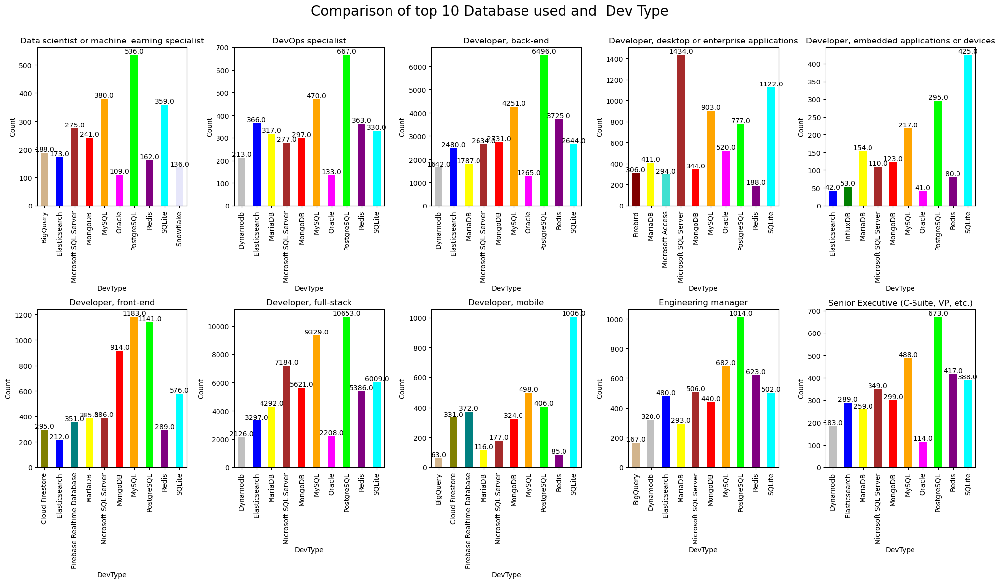

In [69]:
#Correlation between Dev type and Database
Database_Dev=programming_df[['ResponseId','DatabaseHaveWorkedWith','DevType']]
Database_Dev=Database_Dev.dropna(subset='DatabaseHaveWorkedWith')
Database_Dev=Database_Dev.dropna(subset='DevType')
Database_Dev=Database_Dev.drop_duplicates()
Database_Dev
filtered_list=['Developer, full-stack','Developer, back-end','Developer, front-end','Developer, desktop or enterprise applications',
'Developer, mobile','Engineering manager', 'Developer, embedded applications or devices', 'Data scientist or machine learning specialist', 'Senior Executive (C-Suite, VP, etc.)','DevOps specialist']

Database_Dev['DevCheck']=Database_Dev['DevType'].isin(filtered_list)
Database_Dev=Database_Dev[Database_Dev['DevCheck']==True]
df=Database_Dev.groupby(['DatabaseHaveWorkedWith', 'DevType']).size().unstack()

plot_grouped_bar_plots(2,5,'DatabaseHaveWorkedWith', 'DevType',df,20,12,'DevType','Count','Comparison of top 10 Database used and  Dev Type \n',All_Database_colors,1)

<b>Inference:</b>
1. <b>PostgreSQL is preferred by Data Scientists, DevOps Specialist, Backend developers, full stack developer, Engineering Managers and Senior Executives. </b>
2. Survey takers who use <b>Microsoft SQL Server </b>are most likely to be <b>Desktop or Enterprise application developers.</b> 
3. Survey takers who use <b>SQLite</b> are most likely to be <b>Embedded application or devices developers.</b> 
4. <b>MySQL is most preferred by frontend developers.</b> 
5. <b>Front End developers are the only ones</b> likely to <b>use Cloud Firestore database </b>among the top 10 developer types. 
6. <b>Desktop or Enterprise application developers are the only ones</b> likely to <b>use Firebird database</b> among the top 10 developer types.
7. Users of <b>BigQuery</b> are likely to be <b>Data Scientists. </b>

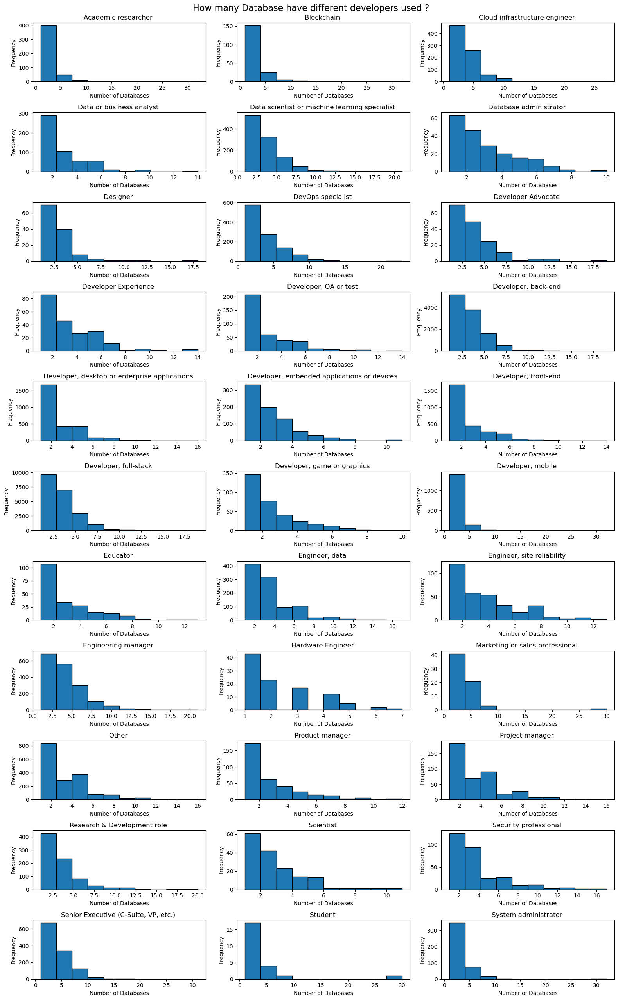

In [70]:
Numb_DB_Dev=programming_df[['ResponseId','DevType','Num_DatabaseHaveWorkedWith']]
Numb_DB_Dev=Numb_DB_Dev.dropna(subset='DevType')
Numb_DB_Dev=Numb_DB_Dev.dropna(subset='Num_DatabaseHaveWorkedWith')
Numb_DB_Dev=Numb_DB_Dev.drop_duplicates()
plot_grouped_hist_plots(11,3,'DevType','Num_DatabaseHaveWorkedWith',Numb_DB_Dev,16,26,'Number of Databases',' How many Database have different developers used ? \n')

<b>Inference:</b>
1. Most developers use an average of <b> under 5 databases. </b>
2. Most variation in databases used are by Security professionals, Engineering Managers, Reserach roles, Product manager, Database administrator. 

# Stack Overflow Usage, Contribution and Community Engagement

In this section, we delve into the characteristics of the developer community, exploring their engagement with Stack Overflow, their contribution to the platform, and their participation in the developer community at large.

In [71]:
SO_group=survey_df.copy()
SO_group['YearsCode_Range']=SO_group['YearsCode'].apply(YearCode_range)

## Stack Overflow Account Status

SOAccount
Yes                        77.998355
No                         14.051378
Not sure/can't remember     7.950267
Name: Perc, dtype: float64


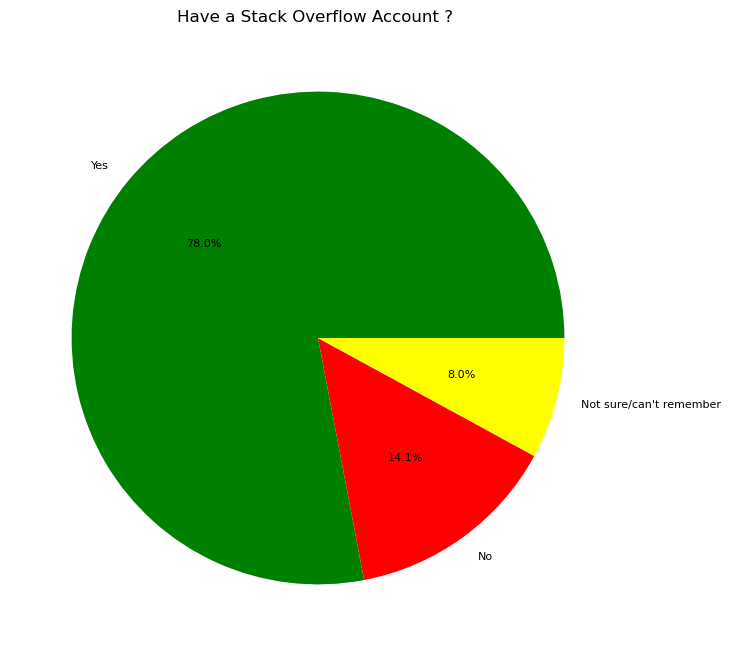

In [72]:
#Starting with identifying how many survey takers have a stackoverflow account:
SO_acc=SO_group.groupby('SOAccount').count()[['ResponseId']]
draw_pie(SO_acc,'SOAccount',8,8,'Have a Stack Overflow Account ? ',colors_SO_acc)

<b>78%</b> of the survey takers have a Stack Overflow Account.

## Most popular Stack Overflow Sites 

NEWSOSites
Stack Overflow                                                                                 54.957619
Stack Exchange                                                                                 37.758883
Collectives on Stack Overflow                                                                   4.012745
Stack Overflow for Teams (private knowledge sharing & collaboration platform for companies)     3.077113
I have never visited Stack Overflow or the Stack Exchange network                               0.193640
Name: Perc, dtype: float64


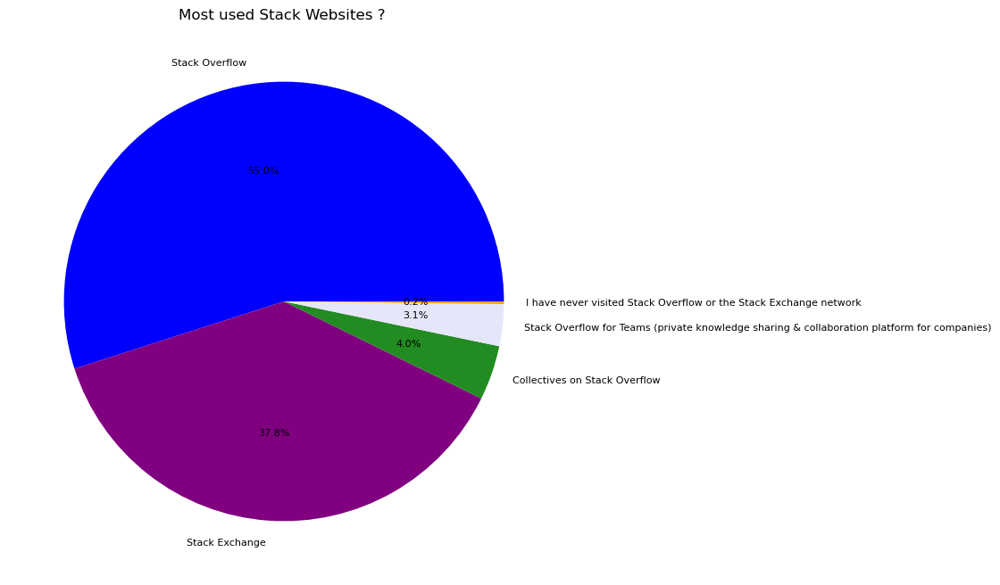

In [73]:
#Most popular stackover flow sites ? 
#colors_SO_sites=['blue','purple','lavender','forestgreen','orange']
SO_sites=SO_group[['ResponseId','NEWSOSites']]
SO_sites['NEWSOSites']=SO_sites['NEWSOSites'].str.split(';')
SO_sites=SO_sites.explode('NEWSOSites')
SO_sites=SO_sites.drop_duplicates()
SO_sites_group=SO_sites.groupby('NEWSOSites').count()[['ResponseId']]
draw_pie(SO_sites_group,'NEWSOSites',8,8,'Most used Stack Websites ? ',colors_SO_sites)

<b>55%</b> of the survey takers use <b>Stack Overflow</b> site the most, followed by <b>38%</b> using the <b>Stack Exchange</b> website. <b>0.2%</b> of the survey takers have never visited either Stack Overflow or Stack Exchange networks.

## Stack Overflow Visit Frequency

SOVisitFreq
A few times per week                   32.099060
Daily or almost daily                  26.027767
A few times per month or weekly        22.971470
Multiple times per day                 14.218770
Less than once per month or monthly     4.682933
Name: Perc, dtype: float64


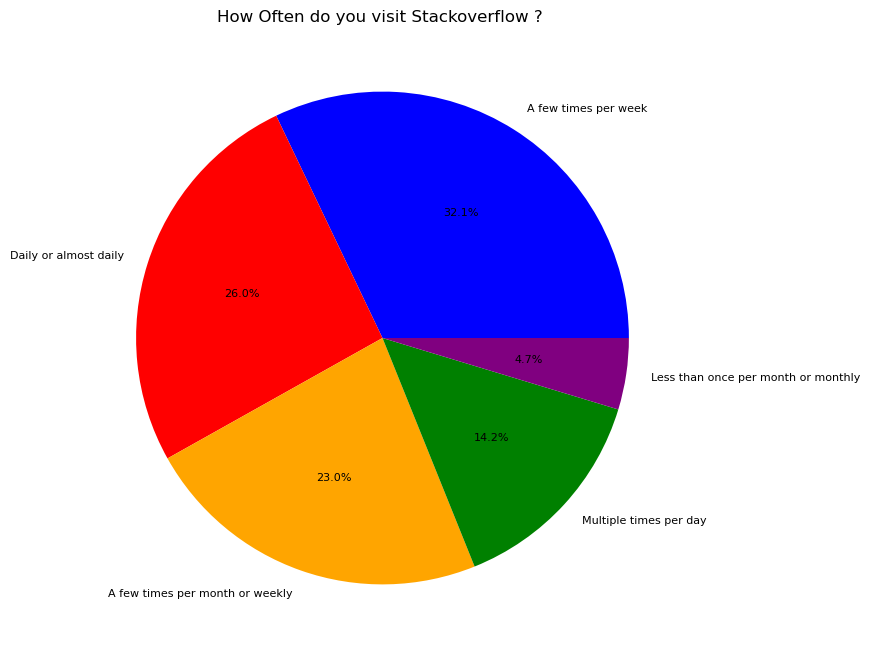

In [74]:
#Site Visits
SO_visit=SO_group[['ResponseId','SOVisitFreq']]
SO_visit['SOVisitFreq'].dropna().unique() #5 options
SO_visit_group=SO_visit.groupby('SOVisitFreq').count()[['ResponseId']]
draw_pie(SO_visit_group,'SOVisitFreq',8,8,'How Often do you visit Stackoverflow ? ',colors_SO_VisitFreq)

Visit frequencies are fairly even, with just under <b>5% of the survey takers visiting Stack Overflow less than once a month. </b> Most survey takers visit Stack Overflow at least few time a week, daily or monthly.

## Stack Overflow Participation Frequency

SOPartFreq
Less than once per month or monthly                   54.963818
I have never participated in Q&A on Stack Overflow    22.396130
A few times per month or weekly                       14.346695
A few times per week                                   5.160989
Daily or almost daily                                  2.044882
Multiple times per day                                 1.087487
Name: Perc, dtype: float64


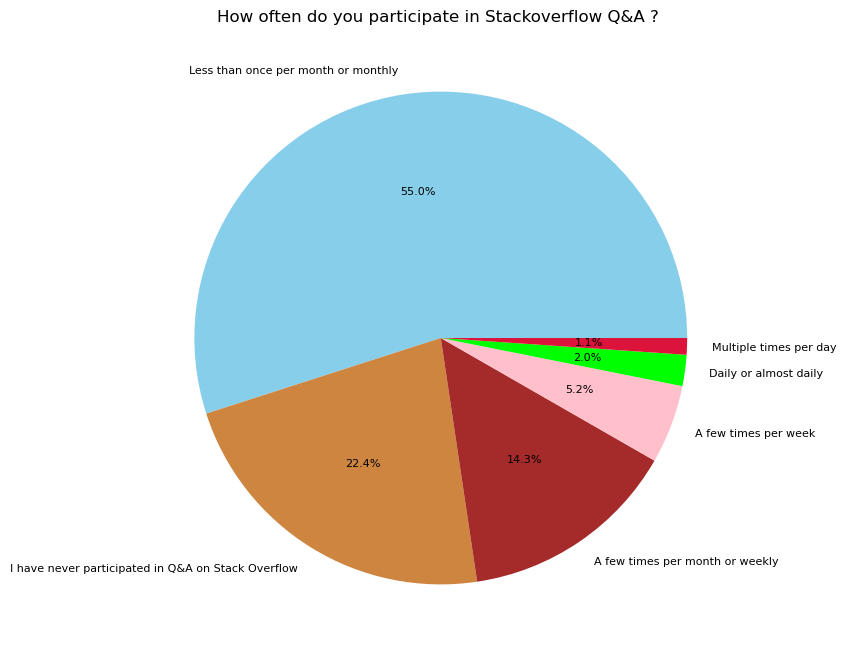

In [75]:
#Site Participation
SO_PartFreq=SO_group[['ResponseId','SOPartFreq']]
SO_PartFreq_group=SO_PartFreq.groupby('SOPartFreq').count()[['ResponseId']]
draw_pie(SO_PartFreq_group,'SOPartFreq',8,8,'How often do you participate in Stackoverflow Q&A ? ',colors_SO_PartFreq)

Although most survey takers visit Stack Overflow a few times a week, more than <b>50% of survey takers are participating less than once a month</b> in Stack Overflow Q&A, followed by <b>22% who have never participated.</b> Therefore, despite survey takers visiting Stack Overflow frequently, a large percentage of these people are not actively engaged in the community. Only 2% of the responders participate almost daily, with <b>just 1.1% participating multiple times a day.</b>

## Comparison of Stack Overflow accounts:

### Comparison with Employment Status

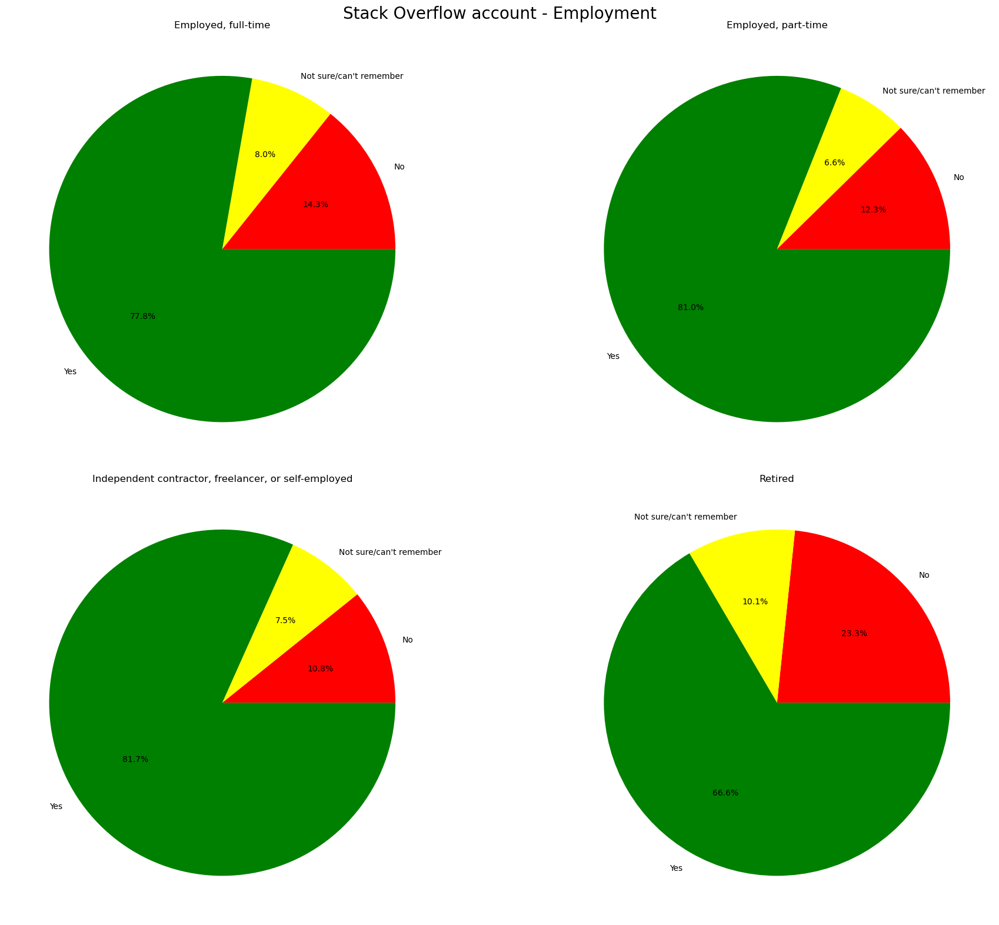

In [76]:
#Employment vs whether they have stackoverflow accounts:
SO_acc_Emp=SO_group[['ResponseId','SOAccount','Employment']].dropna()
SO_acc_Emp['Employment']=SO_acc_Emp['Employment'].str.split(';')
SO_acc_Emp=SO_acc_Emp.explode('Employment')
SO_acc_Emp=SO_acc_Emp[SO_acc_Emp['Employment']!='I prefer not to say']
SO_acc_Emp=SO_acc_Emp.drop_duplicates()

df=SO_acc_Emp.groupby(['SOAccount','Employment']).size().unstack()
        
plot_grouped_pie_plots(2,2,'SOAccount','Employment',df,20,16,'Stack Overflow account - Employment',colors_SO_acc)

<b>Inference:</b>
1. <b>Retired</b> survey takers are the <b>most unlikely to have a Stack Overflow account.</b>
2. <b>Freelances and part time employed</b> survey takers are more likely to <b>have a Stack Overflow account.</b>

### Comparison with Education Level

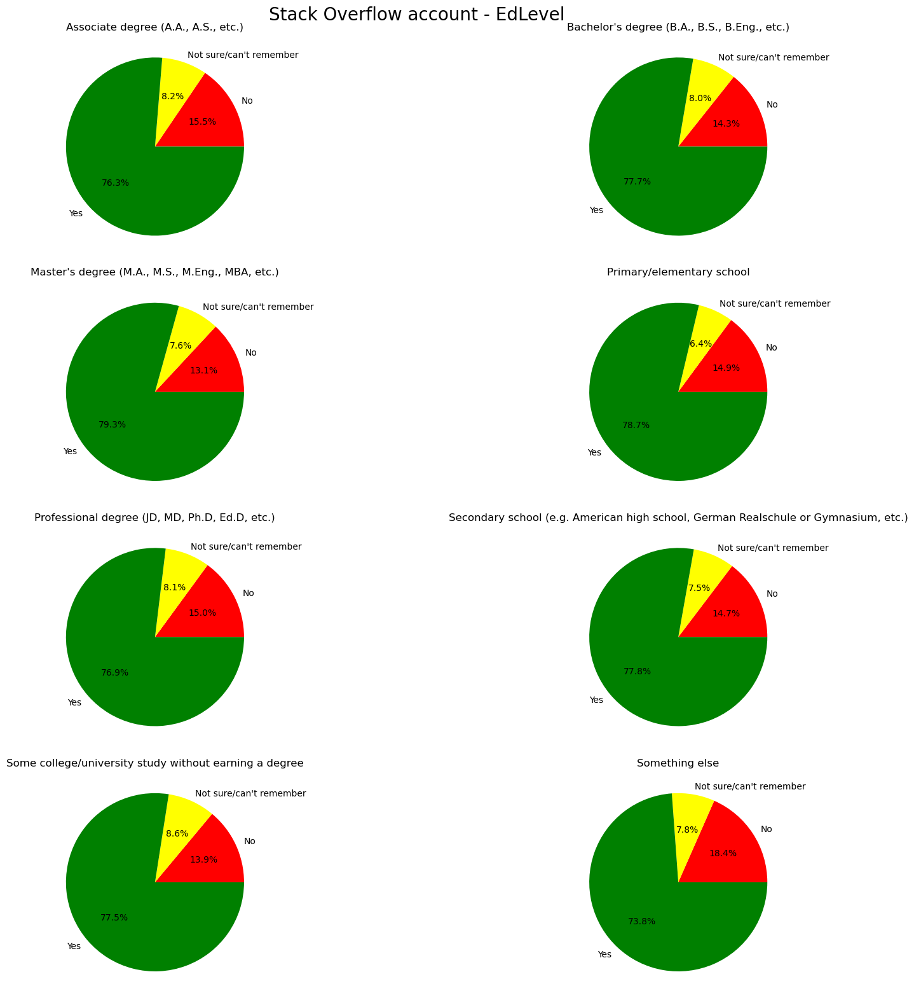

In [77]:
#EdLevel vs whether they have stackoverflow accounts:
SO_acc_ED=SO_group[['ResponseId','SOAccount','EdLevel']].dropna()
df=SO_acc_ED.groupby(['SOAccount','EdLevel']).size().unstack()        
plot_grouped_pie_plots(4,2,'SOAccount','EdLevel',df,20,16,'Stack Overflow account - EdLevel',colors_SO_acc)

<b>Inference:</b>
1. Education level <b>does not show significant variation</b> in whether they have a Stack Overflow account or not. 
2. <b>Most unlikely to have a Stack Overflow account are those with an Associates Degree, Professional Degree or Some other form of education. </b>

### Comparison with Developer Type

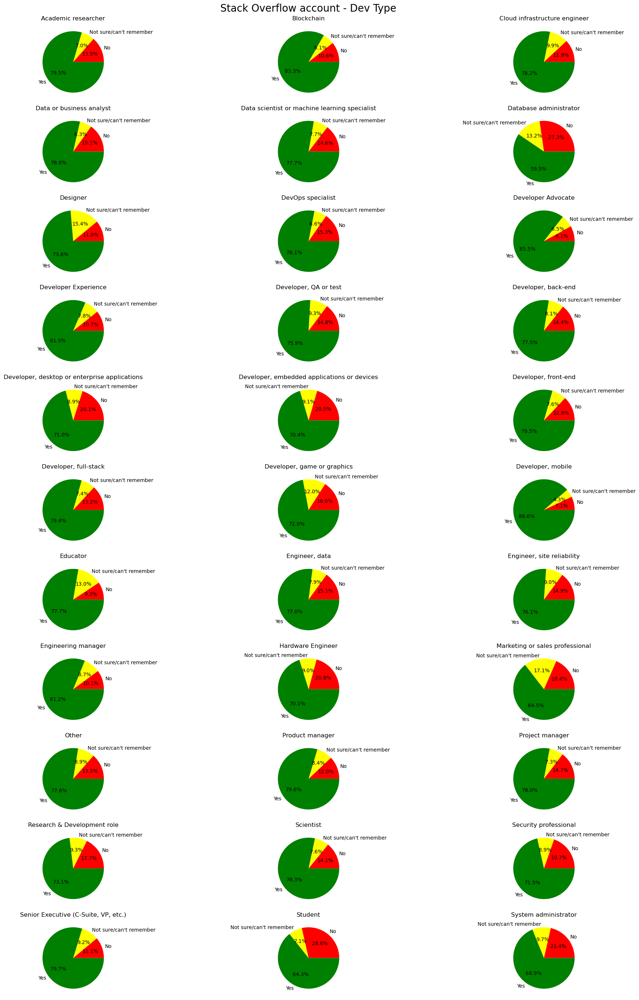

In [78]:
#Dev Type vs whether they have stackoverflow accounts:
SO_acc_Dev=SO_group[['ResponseId','SOAccount','DevType']].dropna()
df=SO_acc_Dev.groupby(['SOAccount','DevType']).size().unstack()        
plot_grouped_pie_plots(11,3,'SOAccount','DevType',df,20,28,'Stack Overflow account - Dev Type \n',colors_SO_acc)

<b>Inference:</b>
1. <b>Students, System Administrators, Hardware Engineer, Security Professional, Embedded applications developer and Database administrators</b> are the most <b>unlikely</b> to have Stack Overflow accounts (No% >=20%). 
2. <b>Developer Mobile,  Engineering Manager, Developer Experience and Blockchain developers</b> are <b>most likely</b> to have a Stack Overflow account (Yes%>=80%).

### Comparison with Age Group

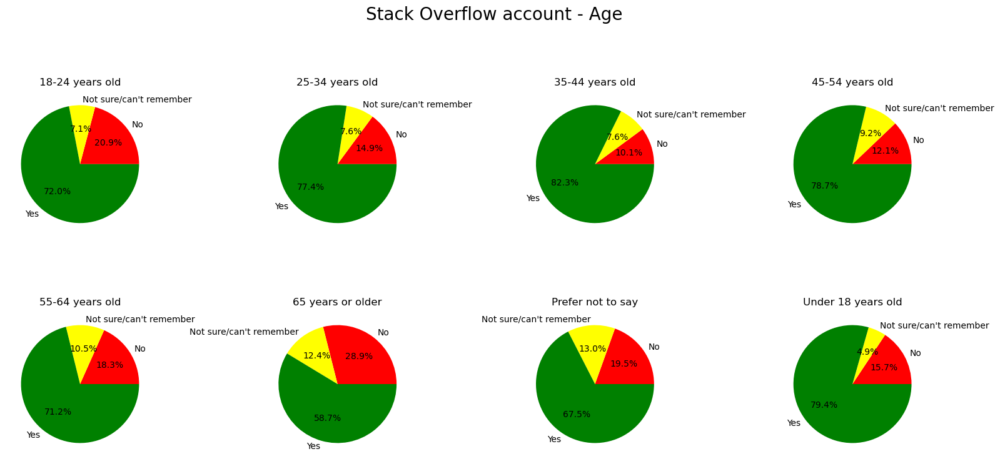

In [79]:
#Are older age groups using stackoverflow ?
SO_acc_Age=SO_group[['ResponseId','SOAccount','Age']].dropna()
df=SO_acc_Age.groupby(['SOAccount','Age']).size().unstack()
plot_grouped_pie_plots(2,4,'SOAccount','Age',df,16,8,'Stack Overflow account - Age \n',colors_SO_acc)

<b>Inference:</b>
1. Survey takers <b>in the workforce</b> are more likely to <b>have a Stack Overflow accounts.</b> 
2. <b>Older survey takers</b> are more likely to <b>not have a Stack Overflow account. </b>
3. <b>Students in school (under 18)</b> are <b>more likely to have an account than those that are in university (18-24 years).</b>

## Comparison of Stack Overflow Participation Frequency
Comparison shows that the participation frequency does not depend on employment status, education level, age group or developer type. 

### Comparison with Employment Status

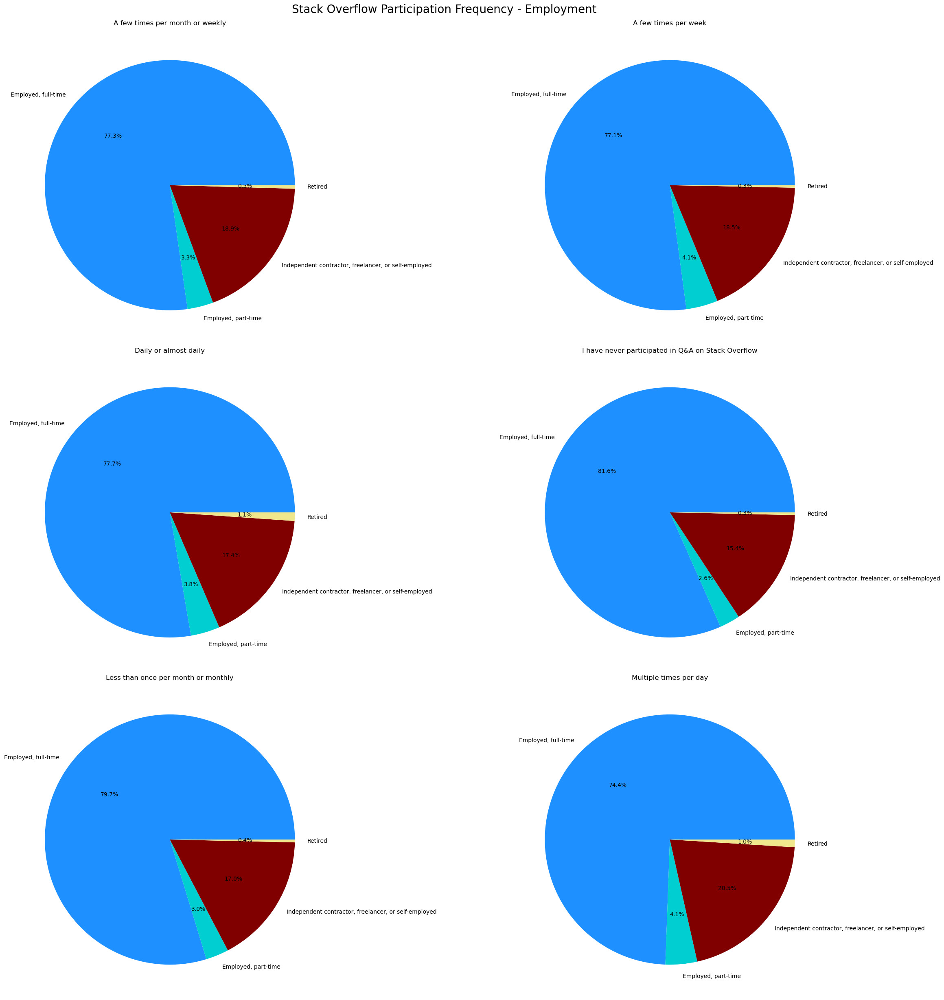

In [80]:
#Emp vs So part freq:
SO_PartFreq_Emp=SO_group[['ResponseId','Employment','SOPartFreq']].dropna()
SO_PartFreq_Emp['Employment']=SO_PartFreq_Emp['Employment'].str.split(';')
SO_PartFreq_Emp=SO_PartFreq_Emp.explode('Employment')
SO_PartFreq_Emp=SO_PartFreq_Emp[SO_PartFreq_Emp['Employment']!='I prefer not to say']
df=SO_PartFreq_Emp.groupby(['Employment','SOPartFreq']).size().unstack()
plot_grouped_pie_plots(3,2,'Employment','SOPartFreq',df,26,25,'Stack Overflow Participation Frequency - Employment \n',colors_emp)

<b>Inference:</b>
1. When participating in Stack Overflow Q&A, <b>Independent contractor,Freelance or self-employed</b> are more <b>likely to interact multiple times</b> a day rather than never participate. 
2. Survey takers who are <b>Employed full time are least likely to participate in Stack Overflow community.</b>

### Comparison with Education Level

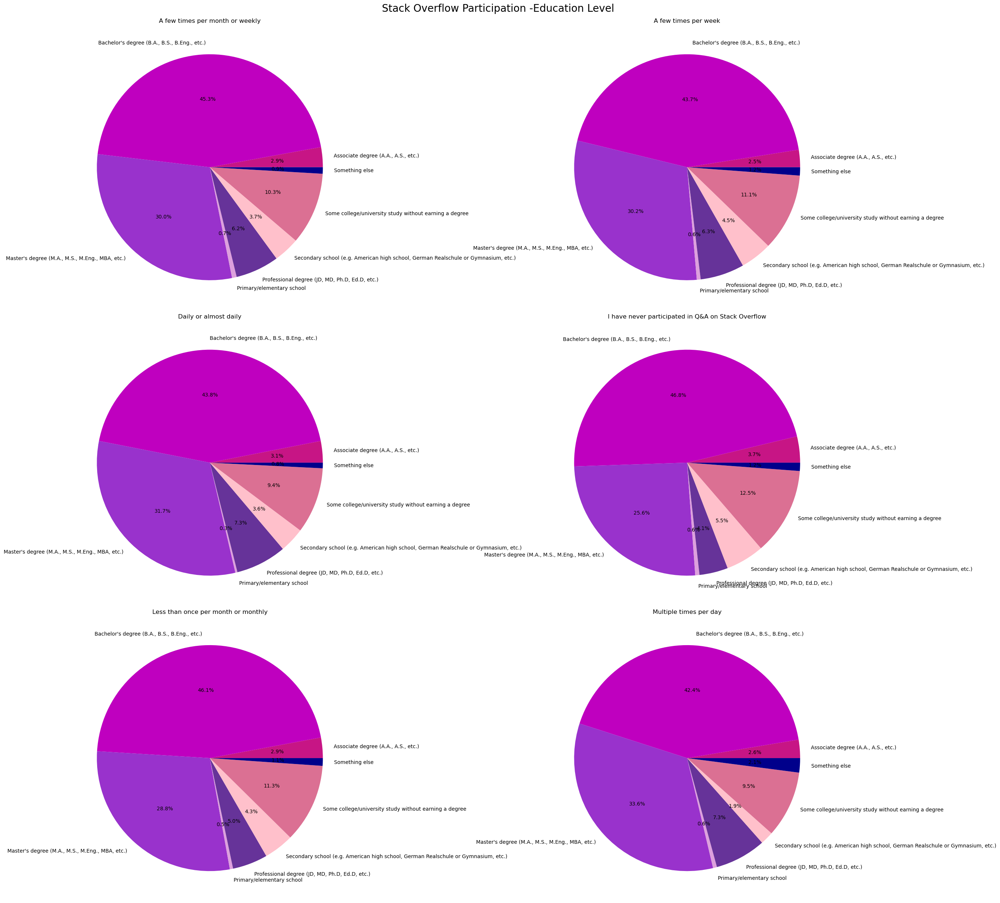

In [81]:
#EDLEVEL vs So part freq:
SO_PartFreq_ED=SO_group[['ResponseId','EdLevel','SOPartFreq']].dropna()
df=SO_PartFreq_ED.groupby(['EdLevel','SOPartFreq']).size().unstack()
plot_grouped_pie_plots(3,2,'EdLevel','SOPartFreq',df,26,25,'Stack Overflow Participation -Education Level \n',colors_ED)

<b>Inference:</b>
1. Survey takers with a <b>Bachelor's degree</b> are more likely to <b>not participate<b> in Stack Overflow community.
2. Survey takers with a <b>Master's degree</b> are more likely to <b>interact multiple times a day.</b>
3. Survey takers with a <b>Professional degree</b> are more likely to <b>interact daily or multiple times a day.</b> 
4. <b>School students and survey takers without a formal degree</b> are more likely to <b>never participate in Stack Overflow community.</b>

### Comparison with Age Group

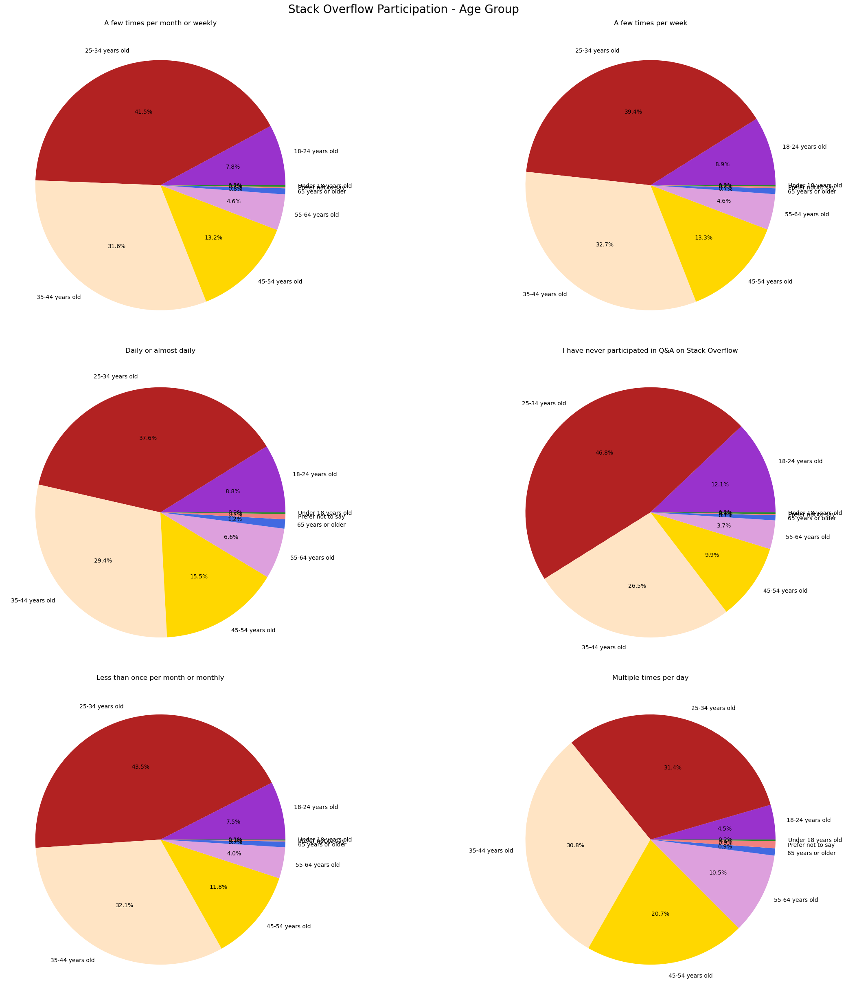

In [82]:
#Age vs So part freq:
SO_PartFreq_Age=SO_group[['ResponseId','Age','SOPartFreq']].dropna()
df=SO_PartFreq_Age.groupby(['Age','SOPartFreq']).size().unstack()
plot_grouped_pie_plots(3,2,'Age','SOPartFreq',df,26,25,'Stack Overflow Participation - Age Group \n',colors_Age)

<b>Inference:</b>
1. Survey takers in the age group <b>25-34 years</b> and <b>18-24 years </b>are most likely to have <b>never participated</b> in a Stack Overflow Q&A.
2. Survey takers in the age group <b>35-44 years</b> are more likely to <b>interact a few times per week.</b>
3. Survey takers who are much older, in the age group <b>44-54 years</b> and <b>55-64 years</b>, are m ore likely to interact multiple times a day. 


### Comparison with developer type

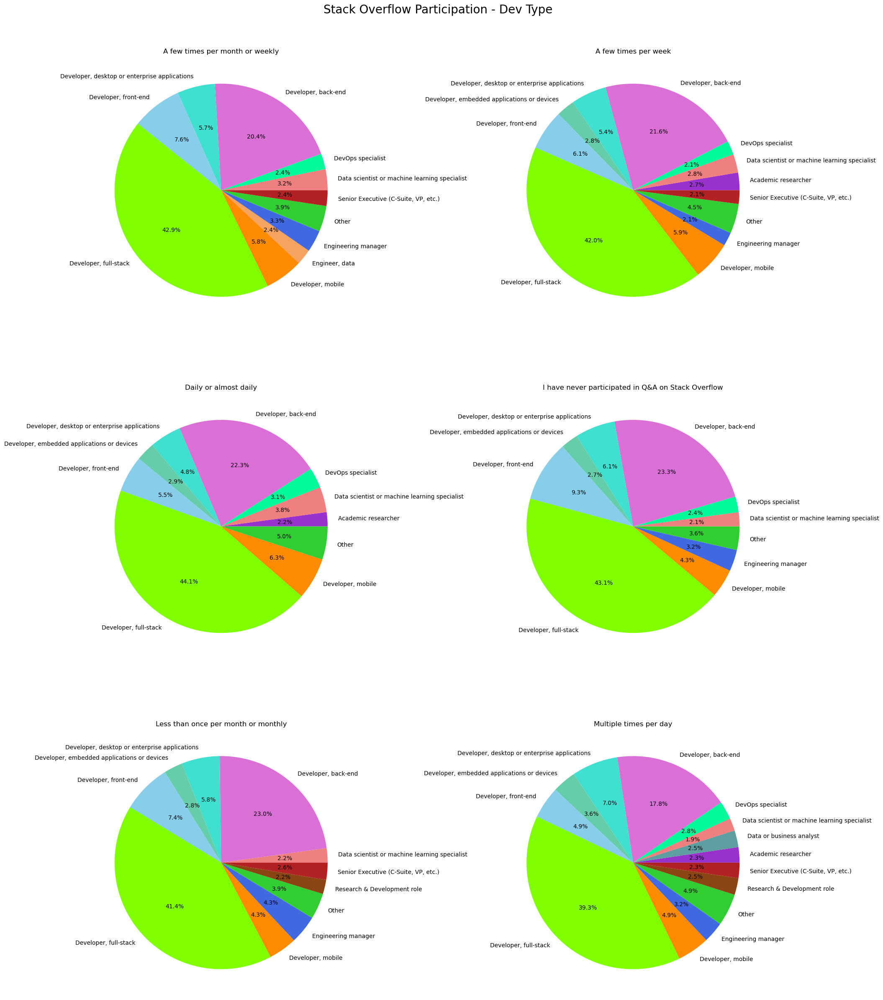

In [83]:
#dev vs So part freq:
#colors_SO_PartFreq=['skyblue','brown','peru','crimson','lime','pink']
SO_PartFreq_Dev=SO_group[['ResponseId','DevType','SOPartFreq']].dropna()
df=SO_PartFreq_Dev.groupby(['DevType','SOPartFreq']).size().unstack()
plot_grouped_pie_plots(3,2,'DevType','SOPartFreq',df,20,25,'Stack Overflow Participation - Dev Type \n',colors_Dev,1)

<b>Inference:</b>
1. <b>Full stack developers</b> are more likely to interact with Stack Overflow community <b>daily or almost daily.</b>
2. <b>Backend Developers </b> are more likely to have <b>never participated in Stack Overflow community.</b>
3. <b>Desktop or application enterprise developers </b> are more likely to participate <b>multiple times a day.</b>

# Summary

The demographic analysis of the Stack Overflow Developer Survey dataset provides a comprehensive view of the global developer community's engagement with the platform and participation in the broader developer ecosystem. Through a detailed exploration of various metrics, valuable insights into the demographic composition of Stack Overflow users and their patterns of interaction with the platform were gained.<br>
<br>
The analysis revealed that a significant proportion of developers across different industries, employment statuses, education levels, developer types, age groups, and years of coding experience are active users of Stack Overflow, highlighting the platform's widespread adoption among developers worldwide. Furthermore, variations in platform usage across different demographic groups, with factors such as industry sector, employment status, and education level influencing developers' levels of participation in the Stack Overflow community were noticed.<br>
<br>
Overall, the demographic analysis underscores the importance of Stack Overflow as a vital resource and community hub for developers, providing them with valuable support, knowledge-sharing opportunities, and collaborative networks. By understanding the demographic characteristics and engagement patterns of developers on Stack Overflow, organizations and stakeholders in the tech industry can tailor their strategies and initiatives to better meet the needs of the developer community and foster a thriving ecosystem of innovation and collaboration in software development.<br>